In [1]:
%pylab inline
import tensorflow as tf
import numpy as np
import tflearn
from tflearn.layers.core import input_data, dropout, fully_connected
from tflearn.layers.conv import conv_2d, max_pool_2d, avg_pool_2d
from tflearn.layers.normalization import local_response_normalization
from tflearn.layers.estimator import regression
import matplotlib.pyplot as plt

# Data loading and preprocessing
import tflearn.datasets.mnist as mnist
from tensorflow.examples.tutorials.mnist import input_data
mnist = input_data.read_data_sets('MNIST_data', one_hot=True)


# Building convolutional network

image_width = 28



/usr/local/lib/python2.7/dist-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


Populating the interactive namespace from numpy and matplotlib
hdf5 not supported (please install/reinstall h5py)
Extracting MNIST_data/train-images-idx3-ubyte.gz
Extracting MNIST_data/train-labels-idx1-ubyte.gz
Extracting MNIST_data/t10k-images-idx3-ubyte.gz
Extracting MNIST_data/t10k-labels-idx1-ubyte.gz


# DCGAN

In [18]:
tf.reset_default_graph()
# using "GAN hacks" from https://github.com/soumith/ganhacks/blob/master/README.md
z_dim = 20
activation_depth = 32
activation_width = image_width/4

label_ph = tf.placeholder(tf.float32, [None, 10])

real_label_ph = tf.placeholder(tf.float32, [None])
real_label_logit = tf.reshape(real_label_ph, [-1,1])

z_ph = tf.placeholder(tf.float32, [None, z_dim])
learning_rate = tf.Variable(.005)


input_to_conv = tflearn.layers.merge([z_ph, label_ph], "concat")


with tf.variable_scope("gen"):
    m = tflearn.layers.core.fully_connected(input_to_conv, z_dim+10, activation='LeakyReLU')
    m = tflearn.layers.core.fully_connected(m, z_dim+10, activation='elu')
    m = tflearn.layers.core.fully_connected(m, activation_depth*activation_width**2, activation='LeakyReLU')
    print "fully connected", m.get_shape()
    m = tf.reshape(m,[-1,activation_width,activation_width,activation_depth])
    print "reshaped", m.get_shape()
    m = tflearn.conv_2d_transpose(m, 32, 5, [image_width/4, image_width/4, 32], strides=1, activation='LeakyReLU')
#     m = tflearn.layers.conv.upsample_2d (m, 2)
    m = tflearn.conv_2d_transpose(m, 32, 5, [image_width/2, image_width/2, 32], strides=2, activation='LeakyReLU')
    print m.get_shape()
    m = tflearn.conv_2d_transpose(m, 32, 5, [image_width/2, image_width/2, 32], strides=1, activation='LeakyReLU')
    print m.get_shape()
#     m = tflearn.layers.conv.upsample_2d (m, 2)
    print m.get_shape()
    m = tflearn.conv_2d_transpose(m, 10, 5, [image_width, image_width, 10], strides=2, activation='LeakyReLU')
    print m.get_shape()
    image_ten = tflearn.conv_2d_transpose(m, 1, 5, [image_width, image_width, 1], strides=1, activation='sigmoid')
    print image_ten.get_shape()
    image_flat = tf.reshape(image_ten, [-1,image_width**2])

with tf.variable_scope("adv"):
    network = conv_2d(image_ten, 32, 3, activation='LeakyReLU')
    network = avg_pool_2d(network, 2)
#     network = local_response_normalization(network)
    network = conv_2d(network, 64, 3, activation='LeakyReLU')
    network = avg_pool_2d(network, 2)
#     network = local_response_normalization(network)
    network = fully_connected(network, 128, activation='LeakyReLU')
#     network = fully_connected(network, 128, activation='LeakyReLU')
    network = tflearn.layers.merge([network, label_ph], "concat")
    network = dropout(network, 0.8)
    network = fully_connected(network, 256, activation='LeakyReLU')
    network = dropout(network, 0.8)
    adversary_prediction_ten = fully_connected(network, 1, activation='linear')
    adversary_prediction_prob = tf.nn.sigmoid(adversary_prediction_ten)

# adversary_loss = - tf.reduce_mean(
#                     real_label_ph * tf.log(adversary_prediction_prob) 
#                     + 
#                     (1 - real_label_ph) * tf.log(1 - adversary_prediction_prob) 
#                     )

adversary_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(adversary_prediction_ten, real_label_logit))

generator_loss = - tf.reduce_mean(tf.log(adversary_prediction_prob)) # maximize the adversary's confidence

adversary_optimizer = tf.train.AdamOptimizer(learning_rate).minimize(adversary_loss, 
                                        var_list =  tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope='adv'))
generator_optimizer = tf.train.AdamOptimizer(learning_rate).minimize(generator_loss,
                                        var_list =  tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope='gen'))


sess = tf.Session()
init = tf.global_variables_initializer()
sess.run(init)

generator_loss_record = [1]
adversary_loss_record = [1]

fully connected (?, 1568)
reshaped (?, 7, 7, 32)
(?, 14, 14, 32)
(?, 14, 14, 32)
(?, 14, 14, 32)
(?, 28, 28, 10)
(?, 28, 28, 1)


# baby GAN

In [32]:
tf.reset_default_graph()
# using "GAN hacks" from https://github.com/soumith/ganhacks/blob/master/README.md
z_dim = 20
activation_depth = 32
activation_width = image_width/4


real_label_ph = tf.placeholder(tf.float32, [None])
images_ph = tf.placeholder(tf.float32, [None, 28 * 28])

real_label_logit = tf.reshape(real_label_ph, [-1,1])

z_ph = tf.placeholder(tf.float32, [None, z_dim])
learning_rate = tf.Variable(.0005)




with tf.variable_scope("gen"):
    m = tflearn.layers.core.fully_connected(z_ph, z_dim+10, activation='LeakyReLU')
    m = tflearn.layers.core.fully_connected(m, z_dim+10, activation='LeakyReLU')
    m = tflearn.layers.core.fully_connected(m, activation_depth*activation_width**2, activation='LeakyReLU')
    m = tflearn.layers.core.fully_connected(m, image_width**2, activation='LeakyReLU')
    image_ten = tflearn.layers.core.fully_connected(m, image_width**2, activation='LeakyReLU')
    image_flat = tf.reshape(image_ten, [-1,image_width**2])
    g_result = image_ten
    
# def discriminator(dis_in):
#     network = fully_connected(dis_in, 300, activation='LeakyReLU')
#     network = fully_connected(network, 300, activation='LeakyReLU')
#     network = fully_connected(network, 300, activation='LeakyReLU')
#     network = fully_connected(network, 1, activation='linear')

#     return fully_connected(network, 1, activation='linear')

def dc_discriminator(x):
    x = tf.reshape(x, shape=[-1, 28, 28, 1])
    conv1 = tf.nn.relu(tf.nn.conv2d(x, DC_D_W1, strides=[1, 2, 2, 1], padding='SAME') + DC_D_b1)
    conv2 = tf.nn.relu(tf.nn.conv2d(conv1, DC_D_W2, strides=[1, 2, 2, 1], padding='SAME') + DC_D_b2)
    conv2 = tf.reshape(conv2, shape=[-1, 7 * 7 * 32])
    h = tf.nn.relu(tf.matmul(conv2, DC_D_W3) + DC_D_b3)
    logit = tf.matmul(h, DC_D_W4) + DC_D_b4
    prob = tf.nn.sigmoid(logit)

    return logit

# adversary_loss = - tf.reduce_mean(
#                     real_label_ph * tf.log(adversary_prediction_prob) 
#                     + 
#                     (1 - real_label_ph) * tf.log(1 - adversary_prediction_prob) 
#                     )
with tf.variable_scope("adv"):
    disc_pred_real = discriminator(images_ph)
with tf.variable_scope("adv", reuse=True):
    disc_pred_fake = discriminator(g_result)


# adversary_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(adversary_prediction_ten, real_label_logit))

adv_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(disc_pred_real, tf.ones_like(disc_pred_real)))
adv_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(disc_pred_fake, tf.zeros_like(disc_pred_real)))
adversary_loss = (adv_loss_real + adv_loss_fake)/2



# generator_loss = - tf.reduce_mean(tf.log(tf.nn.sigmoid(disc_pred_fake))) # maximize the adversary's confidence
# generator_loss = - adversary_loss
generator_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(disc_pred_fake, tf.ones_like(disc_pred_real)))

adversary_optimizer = tf.train.AdamOptimizer().minimize(adversary_loss, 
                                        var_list =  tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope='adv'))
generator_optimizer = tf.train.AdamOptimizer().minimize(generator_loss,
                                        var_list =  tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope='gen'))


sess = tf.Session()
init = tf.global_variables_initializer()
sess.run(init)

generator_loss_record = [1]
adversary_loss_record = [1]

# baby training 

0.693966 0.714024


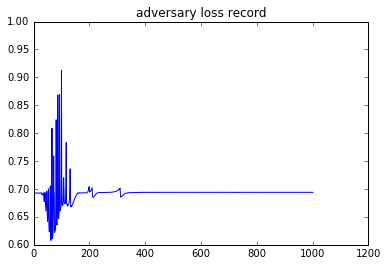

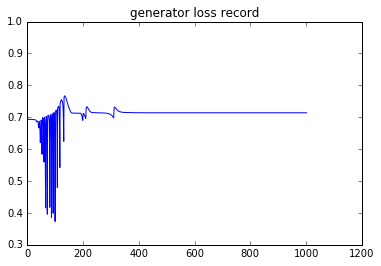

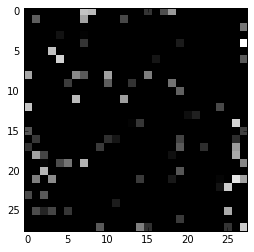

0.694085 0.714023


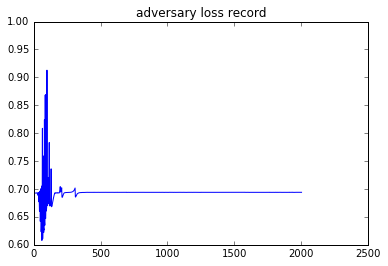

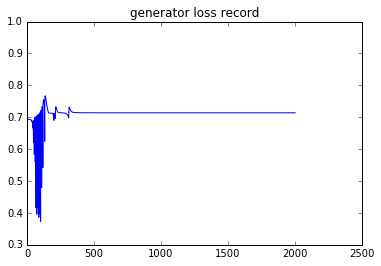

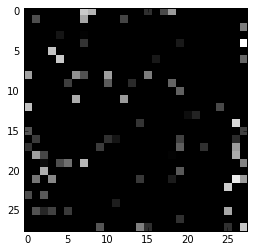

0.694102 0.714023


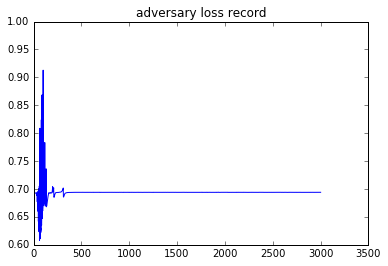

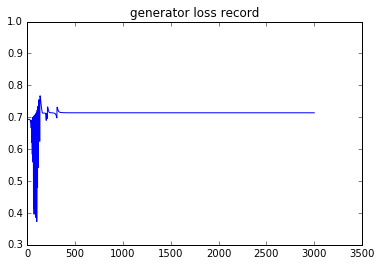

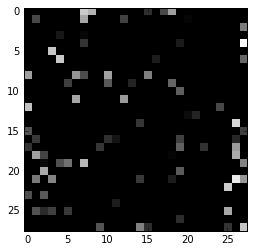

KeyboardInterrupt: 

In [33]:
from itertools import count
batch_size = 100

# remember to scale pixels [-1,1]
def generate_images(labels):
    feed = {real_label_ph: np.array([0]*batch_size), z_ph: np.random.normal(size=[batch_size,z_dim])}
    return sess.run(image_ten, feed_dict = feed)



for i in range(5000):#count(start = 0, step = 1):
    if  generator_loss_record[-1] >= adversary_loss_record[-1]:
        x, y = mnist.train.next_batch(batch_size)

        # train generator
        feed = {real_label_ph: np.array([0]*batch_size), 
                z_ph: np.random.normal(size=[batch_size,z_dim]),
               images_ph: x}
        _, generator_loss_val, adversary_loss_val = sess.run([generator_optimizer, generator_loss, adversary_loss], feed_dict = feed)
        generator_loss_record.append(generator_loss_val)
        adversary_loss_record.append(adversary_loss_val)

    else:
        # train adversary
        x, y = mnist.train.next_batch(batch_size)
        real_generated = np.array([1]*batch_size)
        
        if random.choice([True, False]):
            # 50% chance of replacing the real MNIST data with the product of the generator.
            x = generate_images(y)
        
            real_label = np.array([0]*batch_size)
            
        feed = {real_label_ph: real_generated,
                images_ph: x,
                z_ph: np.random.normal(size=[batch_size,z_dim])}
        
        _, generator_loss_val, adversary_loss_val = sess.run([adversary_optimizer, generator_loss, adversary_loss], feed_dict = feed)
        generator_loss_record.append(generator_loss_val)
        adversary_loss_record.append(adversary_loss_val)

#     x, y = mnist.train.next_batch(batch_size)

#     # train generator
#     feed = {z_ph: np.random.normal(size=[batch_size,z_dim]),
#            images_ph: x}
#     _, generator_loss_val = sess.run([generator_optimizer, generator_loss], feed_dict = feed)
#     generator_loss_record.append(generator_loss_val)
#     _, adversary_loss_val = sess.run([adversary_optimizer, adversary_loss], feed_dict = feed)
#     generator_loss_record.append(generator_loss_val)

#     adversary_loss_record.append(adversary_loss_val)
    
    if i % 400 == 0 and i>0:
        print adversary_loss_val, generator_loss_val
        plt.plot(adversary_loss_record)
        plt.title("adversary loss record")
        plt.show()

        plt.plot(generator_loss_record)
        plt.title("generator loss record")
        plt.show()

        _, y = mnist.train.next_batch(batch_size)
        generated_images = generate_images(y)
        plt.imshow(np.reshape(generated_images[0],[image_width, image_width]), cmap = 'gray', interpolation = 'nearest')
        plt.show()

0.684109 0.681739


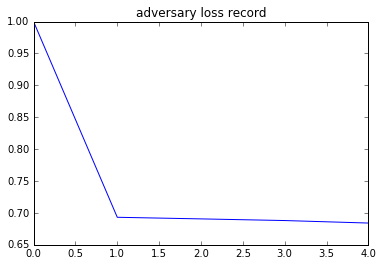

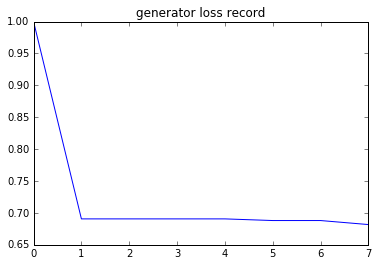

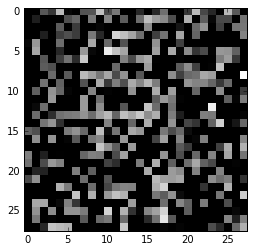

0.00704568 5.38708e-06


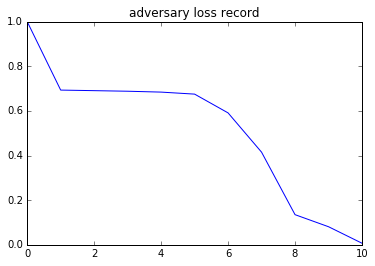

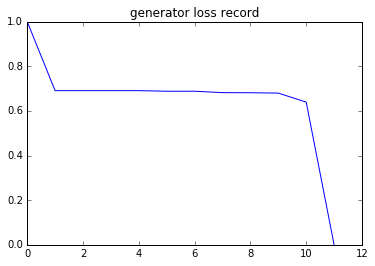

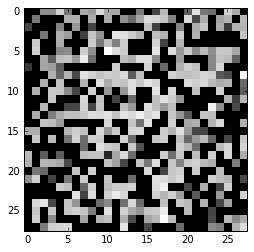

7.42422e-18 -0.0


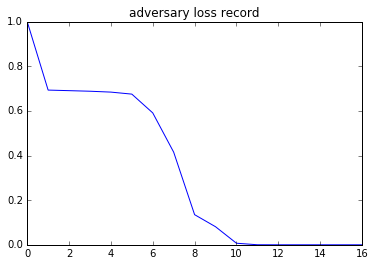

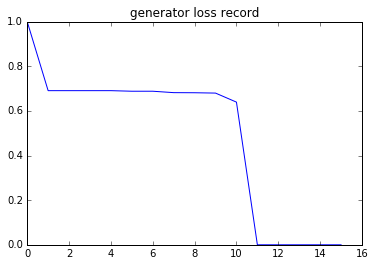

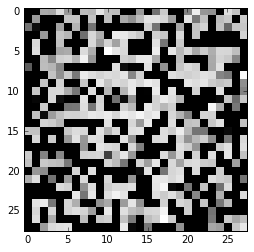

0.0 -0.0


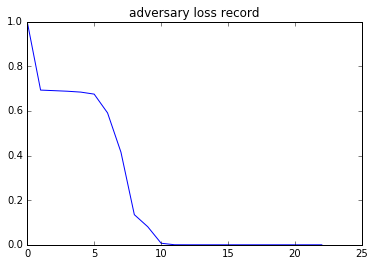

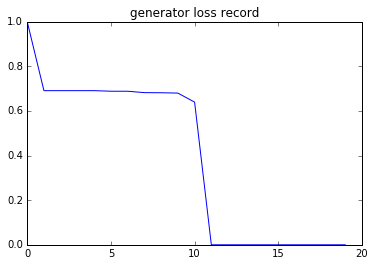

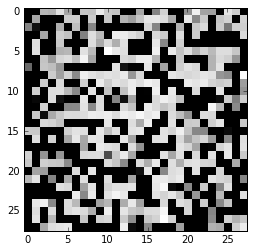

In [26]:
from itertools import count
batch_size = 100

# remember to scale pixels [-1,1]
def generate_images(labels):
    feed = {real_label_ph: np.array([0]*batch_size), label_ph: labels, z_ph: np.random.normal(size=[batch_size,z_dim])}
    return sess.run(image_flat, feed_dict = feed)



for i in range(50):#count(start = 0, step = 1):
    if random.choice([True, False]):# generator_loss_record[-1] >= adversary_loss_record[-1]:
        _, y = mnist.train.next_batch(batch_size)
z
        # train generator
        feed = {real_label_ph: np.array([0]*batch_size), 
                label_ph: y, 
                z_ph: np.random.normal(size=[batch_size,z_dim])}
        _, generator_loss_val = sess.run([generator_optimizer, generator_loss], feed_dict = feed)
        generator_loss_record.append(generator_loss_val)
        
    else:
        # train adversary
        x, y = mnist.train.next_batch(batch_size)
        real_generated = np.array([1]*batch_size)
        
        if random.choice([True, False]):
            # 50% chance of replacing the real MNIST data with the product of the generator.
            x = generate_images(y)
            real_label = np.array([0]*batch_size)
            
        feed = {real_label_ph: real_generated,
                label_ph: y, 
                image_flat: x,
                z_ph: np.random.normal(size=[batch_size,z_dim])}
        
        _, adversary_loss_val = sess.run([adversary_optimizer, adversary_loss], feed_dict = feed)
        adversary_loss_record.append(adversary_loss_val)
    
    if i % 10 == 0 and i>0:
        print adversary_loss_val, generator_loss_val
        plt.plot(adversary_loss_record)
        plt.title("adversary loss record")
        plt.show()

        plt.plot(generator_loss_record)
        plt.title("generator loss record")
        plt.show()

        _, y = mnist.train.next_batch(batch_size)
        generated_images = generate_images(y)
        plt.imshow(np.reshape(generated_images[0],[image_width, image_width]), cmap = 'gray', interpolation = 'nearest')
        plt.show()

Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


Extracting ../data/MNIST_data/train-images-idx3-ubyte.gz
Extracting ../data/MNIST_data/train-labels-idx1-ubyte.gz
Extracting ../data/MNIST_data/t10k-images-idx3-ubyte.gz
Extracting ../data/MNIST_data/t10k-labels-idx1-ubyte.gz
Instructions for updating:
Use `tf.global_variables_initializer` instead.
Iter: 0
D loss: 4.721
G_loss: 2.376e-05
()


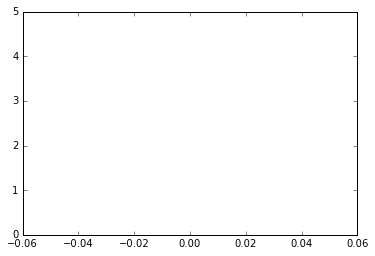

(784,)


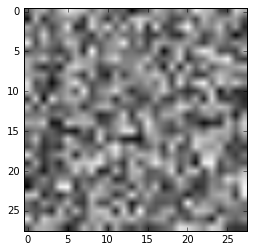

Iter: 1000
D loss: 0.001826
G_loss: 14.39
()


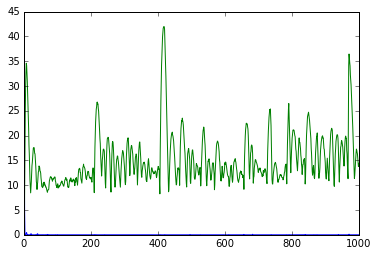

(784,)


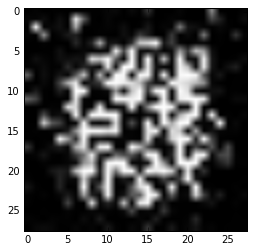

Iter: 2000
D loss: 0.00309
G_loss: 23.17
()


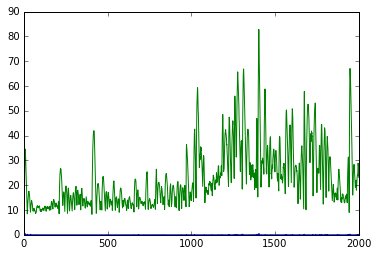

(784,)


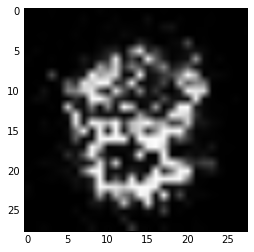

Iter: 3000
D loss: 0.04367
G_loss: 20.55
()


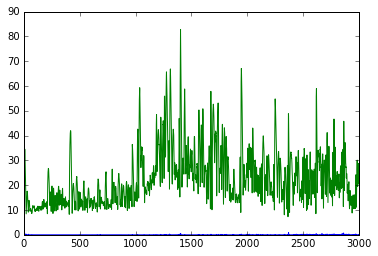

(784,)


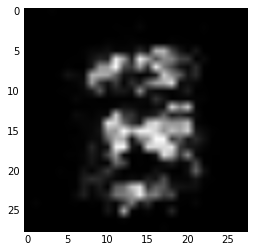

Iter: 4000
D loss: 0.04733
G_loss: 11.17
()


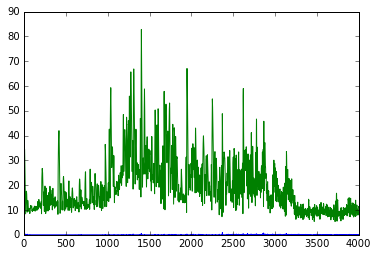

(784,)


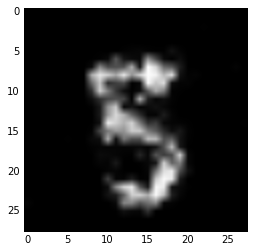

Iter: 5000
D loss: 0.09882
G_loss: 10.13
()


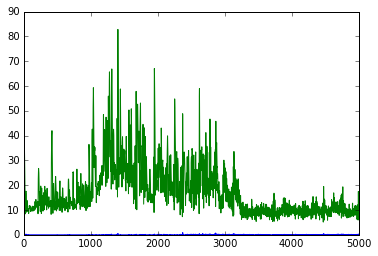

(784,)


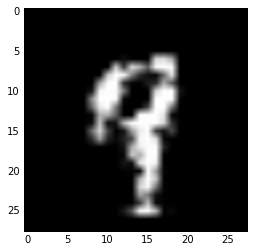

Iter: 6000
D loss: 0.2323
G_loss: 8.787
()


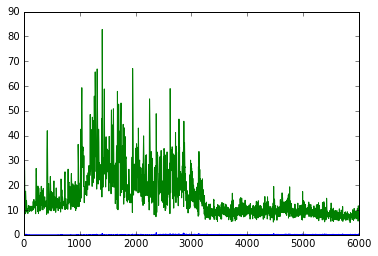

(784,)


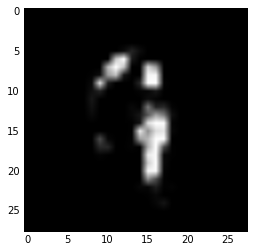

Iter: 7000
D loss: 0.02757
G_loss: 7.39
()


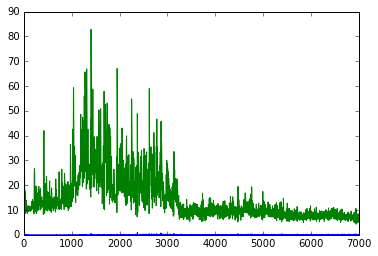

(784,)


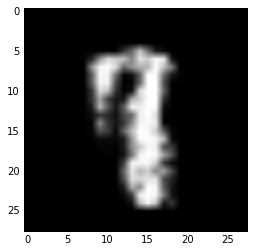

Iter: 8000
D loss: 0.1038
G_loss: 5.823
()


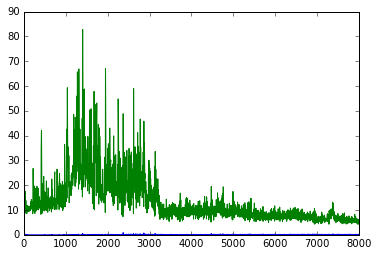

(784,)


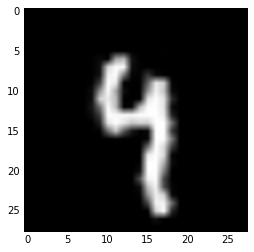

Iter: 9000
D loss: 0.1163
G_loss: 6.308
()


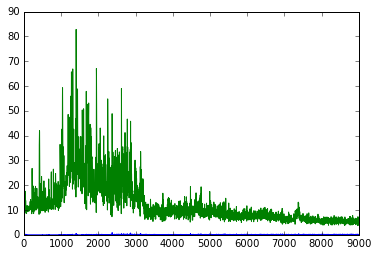

(784,)


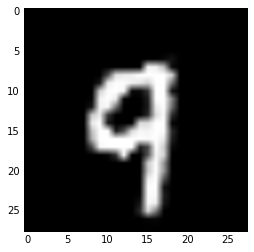

Iter: 10000
D loss: 0.2245
G_loss: 4.061
()


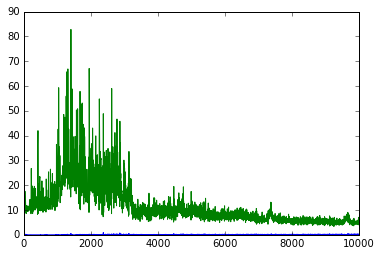

(784,)


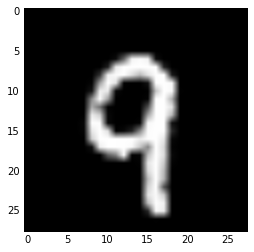

Iter: 11000
D loss: 0.1991
G_loss: 6.045
()


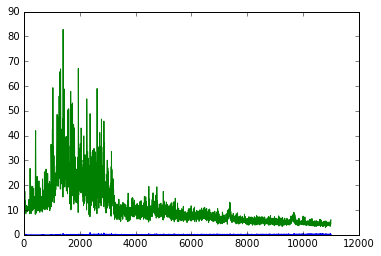

(784,)


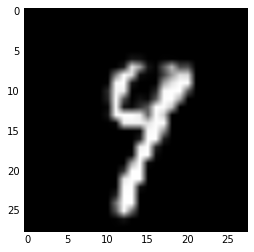

Iter: 12000
D loss: 0.187
G_loss: 4.573
()


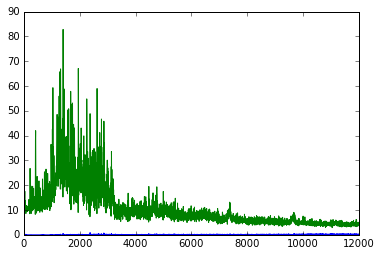

(784,)


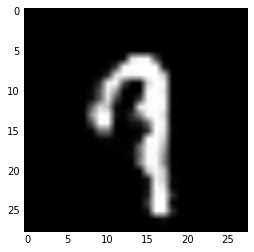

Iter: 13000
D loss: 0.08322
G_loss: 4.094
()


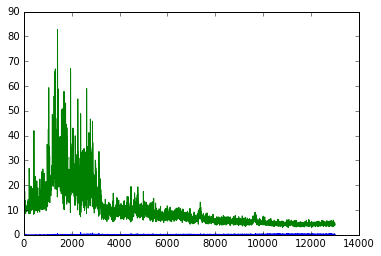

(784,)


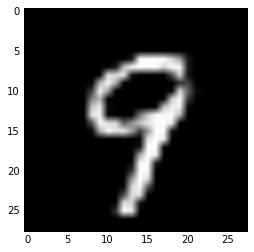

Iter: 14000
D loss: 0.1969
G_loss: 3.929
()


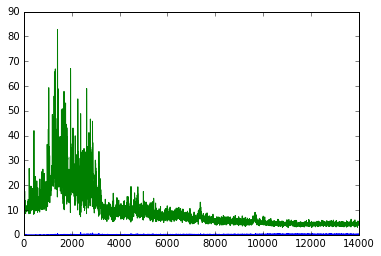

(784,)


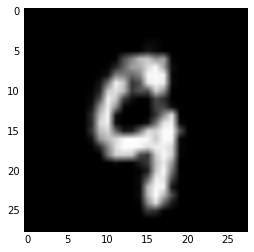

Iter: 15000
D loss: 0.1668
G_loss: 4.023
()


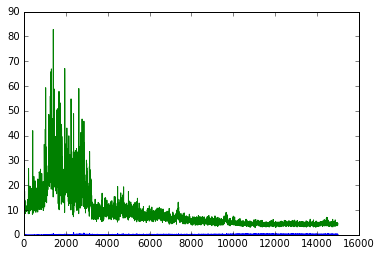

(784,)


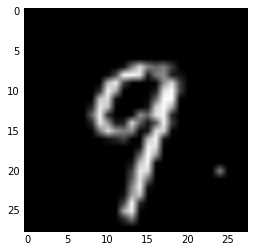

Iter: 16000
D loss: 0.1315
G_loss: 4.562
()


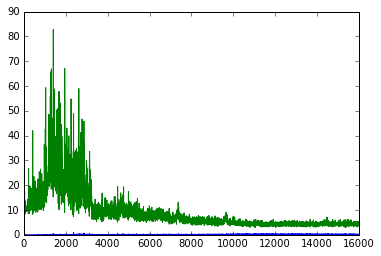

(784,)


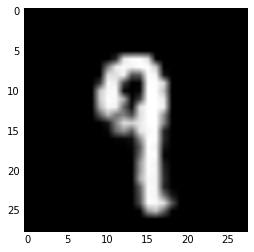

Iter: 17000
D loss: 0.1254
G_loss: 4.591
()


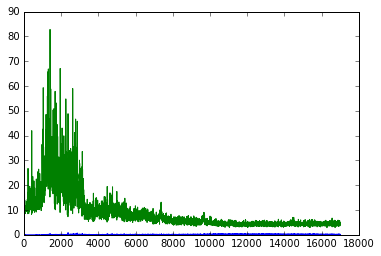

(784,)


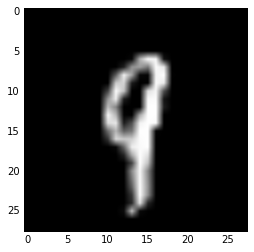

Iter: 18000
D loss: 0.2029
G_loss: 5.251
()


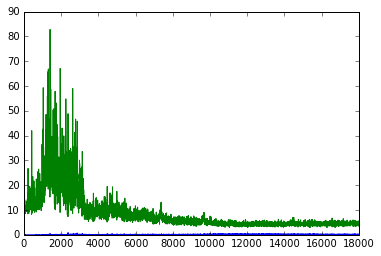

(784,)


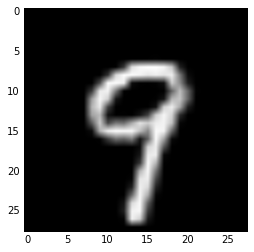

KeyboardInterrupt: 

In [54]:
%pylab inline
import tensorflow as tf
from tensorflow.examples.tutorials.mnist import input_data
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os


def xavier_init(size):
    in_dim = size[0]
    xavier_stddev = 1. / tf.sqrt(in_dim / 2.)
    return tf.random_normal(shape=size, stddev=xavier_stddev)


X = tf.placeholder(tf.float32, shape=[None, 784])

D_W1 = tf.Variable(xavier_init([784, 128]))
D_b1 = tf.Variable(tf.zeros(shape=[128]))

D_W2 = tf.Variable(xavier_init([128, 1]))
D_b2 = tf.Variable(tf.zeros(shape=[1]))

theta_D = [D_W1, D_W2, D_b1, D_b2]


Z = tf.placeholder(tf.float32, shape=[None, 100])

G_W1 = tf.Variable(xavier_init([100, 128]))
G_b1 = tf.Vadef sample_Z(m, n):
    return np.random.uniform(-1., 1., size=[m, n])riable(tf.zeros(shape=[128]))

G_W2 = tf.Variable(xavier_init([128, 784]))
G_b2 = tf.Variable(tf.zeros(shape=[784]))

theta_G = [G_W1, G_W2, G_b1, G_b2]


DC_D_W1 = tf.Variable(xavier_init([5, 5, 1, 16]))
DC_D_b1 = tf.Variable(tf.zeros(shape=[16]))

DC_D_W2 = tf.Variable(xavier_init([3, 3, 16, 32]))
DC_D_b2 = tf.Variable(tf.zeros(shape=[32]))

DC_D_W3 = tf.Variable(xavier_init([7 * 7 * 32, 128]))
DC_D_b3 = tf.Variable(tf.zeros(shape=[128]))

DC_D_W4 = tf.Variable(xavier_init([128, 1]))
DC_D_b4 = tf.Variable(tf.zeros(shape=[1]))

theta_DC_D = [DC_D_W1, DC_D_b1, DC_D_W2, DC_D_b2, DC_D_W3, DC_D_b3, DC_D_W4, DC_D_b4]


def sample_Z(m, n):
    return np.random.uniform(-1., 1., size=[m, n])


def generator(z):
    G_h1 = tf.nn.relu(tf.matmul(z, G_W1) + G_b1)
    G_log_prob = tf.matmul(G_h1, G_W2) + G_b2
    G_prob = tf.nn.sigmoid(G_log_prob)

    return G_prob


def discriminator(x):
    D_h1 = tf.nn.relu(tf.matmul(x, D_W1) + D_b1)
    D_logit = tf.matmul(D_h1, D_W2) + D_b2
    D_prob = tf.nn.sigmoid(D_logit)

    return D_prob, D_logit


def dc_generator(z):
    pass


def dc_discriminator(x):
    x = tf.reshape(x, shape=[-1, 28, 28, 1])
    conv1 = tf.nn.relu(tf.nn.conv2d(x, DC_D_W1, strides=[1, 2, 2, 1], padding='SAME') + DC_D_b1)
    conv2 = tf.nn.relu(tf.nn.conv2d(conv1, DC_D_W2, strides=[1, 2, 2, 1], padding='SAME') + DC_D_b2)
    conv2 = tf.reshape(conv2, shape=[-1, 7 * 7 * 32])
    h = tf.nn.relu(tf.matmul(conv2, DC_D_W3) + DC_D_b3)
    logit = tf.matmul(h, DC_D_W4) + DC_D_b4
    prob = tf.nn.sigmoid(logit)

    return prob, logit


def plot(samples):
    fig = plt.figure(figsize=(4, 4))
    gs = gridspec.GridSpec(4, 4)
    gs.update(wspace=0.05, hspace=0.05)

    for i, sample in enumerate(samples):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(sample.reshape(28, 28), cmap='Greys_r')

    return fig


G_sample = generator(Z)
D_real, D_logit_real = dc_discriminator(X)
D_fake, D_logit_fake = dc_discriminator(G_sample)

# D_loss = -tf.reduce_mean(tf.log(D_real) + tf.log(1. - D_fake))
# G_loss = -tf.reduce_mean(tf.log(D_fake))

# Alternative losses:
# -------------------
D_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(D_logit_real, tf.ones_like(D_logit_real)))
D_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(D_logit_fake, tf.zeros_like(D_logit_fake)))
D_loss = D_loss_real + D_loss_fake
G_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(D_logit_fake, tf.ones_like(D_logit_fake)))

D_solver = tf.train.AdamOptimizer().minimize(D_loss, var_list=theta_DC_D)
G_solver = tf.train.AdamOptimizer().minimize(G_loss, var_list=theta_G)

mb_size = 128
Z_dim = 100

mnist = input_data.read_data_sets('../data/MNIST_data', one_hot=True)

sess = tf.Session()
sess.run(tf.initialize_all_variables())

if not os.path.exists('../out/'):
    os.makedirs('../out/')

i = 0
D_loss_record = []
G_loss_record = []
for it in range(1000000):
    if it % 100 == 0:
        samples = sess.run(G_sample, feed_dict={Z: sample_Z(16, Z_dim)})

#         fig = plot(samples)
#         plt.savefig('../out/{}.png'.format(str(i).zfill(3)), bbox_inches='tight')
        i += 1
#         plt.close(fig)

    X_mb, _ = mnist.train.next_batch(mb_size)

    _, D_loss_curr = sess.run([D_solver, D_loss], feed_dict={X: X_mb, Z: sample_Z(mb_size, Z_dim)})
    _, G_loss_curr = sess.run([G_solver, G_loss], feed_dict={Z: sample_Z(mb_size, Z_dim)})

    D_loss_record.append(D_loss_curr)
    G_loss_record.append(G_loss_curr)

    if it % 1000 == 0:
        print('Iter: {}'.format(it))
        print('D loss: {:.4}'. format(D_loss_curr))
        print('G_loss: {:.4}'.format(G_loss_curr))
        print()
        plt.plot(D_loss_record)
        plt.plot(G_loss_record)
        plt.show()
        images_val = sess.run(G_sample, feed_dict={Z: sample_Z(mb_size, Z_dim)})[0]
        print images_val.shape
        plt.imshow(np.reshape(images_val,[28,28]), cmap='gray')
        plt.show()
        

In [5]:
%pylab inline
import tensorflow as tf
import tflearn
from tensorflow.examples.tutorials.mnist import input_data
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
tf.reset_default_graph()

def xavier_init(size):
    in_dim = size[0]
    xavier_stddev = 1. / tf.sqrt(in_dim / 2.)
    return tf.random_normal(shape=size, stddev=xavier_stddev)


X = tf.placeholder(tf.float32, shape=[None, 784])
Y = tf.placeholder(tf.float32, shape=[None, 10])
image_width = 28
z_dim = 100
Z = tf.placeholder(tf.float32, shape=[None, z_dim])
discriminator_noise_sigma = tf.Variable(.05)

def sample_Z(m, n):
#     return np.random.uniform(-1., 1., size=[m, n])
#     return tf.random_normal(shape=[m, n], mean=0.0, stddev=1.0, dtype=tf.float32) 
    return numpy.random.normal(loc=0.0, scale=1.0, size=[m, n])


# def generator(z):


# #     m = tflearn.layers.core.fully_connected(z, z_dim+10, activation='LeakyReLU')
# #     m = tflearn.layers.core.fully_connected(m, z_dim+10, activation='LeakyReLU')
# #     m = tflearn.layers.core.fully_connected(m, activation_depth*activation_width**2, activation='LeakyReLU')
# #     m = tf.reshape(m,[-1,activation_width,activation_width,activation_depth])
# #     m = tflearn.conv_2d_transpose(m, 32, 5, [image_width/4, image_width/4, 32], strides=1, activation='LeakyReLU')
# #     m = tflearn.conv_2d_transpose(m, 32, 5, [image_width/2, image_width/2, 32], strides=2, activation='LeakyReLU')
# #     m = tflearn.conv_2d_transpose(m, 32, 5, [image_width/2, image_width/2, 32], strides=1, activation='LeakyReLU')
# #     m = tflearn.conv_2d_transpose(m, 10, 5, [image_width, image_width, 10], strides=2, activation='LeakyReLU')
# #     image_ten = tflearn.conv_2d_transpose(m, 1, 5, [image_width, image_width, 1], strides=1, activation='sigmoid')
# #     image_flat = tf.reshape(image_ten, [-1,image_width**2])
#     m = tflearn.layers.core.fully_connected(z, 128, activation='LeakyReLU')
# #     m = tflearn.layers.core.fully_connected(m, z_dim+10, activation='LeakyReLU')
# #     m = tflearn.layers.core.fully_connected(m, image_width* image_width, activation='LeakyReLU')
# #     m = tflearn.layers.core.fully_connected(m, image_width* image_width, activation='LeakyReLU')
#     m = tflearn.layers.core.fully_connected(m, image_width* image_width, activation='sigmoid')

#     return m


def generator(z, y):
#     y = tf.tile(y, [1, 10*image_width*image_width])
#     print y.get_shape()
#     y = tf.reshape(y, [-1, image_width, image_width, 10])

    m = tflearn.layers.merge([z, y], "concat")
    m = tflearn.layers.core.fully_connected(m, 20*14*14, activation='LeakyReLU')
    m = tf.reshape(m,[-1,14,14,20])
#     m = tflearn.conv_2d_transpose(m, 32, 5, [image_width/4, image_width/4, 32], strides=1, activation='LeakyReLU')
    m = tflearn.conv_2d_transpose(m, 32, 5, [image_width/2, image_width/2, 32], strides=1, activation='LeakyReLU')
#     m = tflearn.conv_2d_transpose(m, 32, 5, [image_width/2, image_width/2, 32], strides=1, activation='LeakyReLU')
    m = tflearn.conv_2d_transpose(m, 32, 5, [image_width, image_width, 32], strides=2, activation='LeakyReLU')
    m = tflearn.conv_2d_transpose(m, 1, 5, [image_width, image_width, 1], strides=1, activation='sigmoid')

#     m = tflearn.layers.core.fully_connected(m, image_width* image_width, activation='sigmoid')
    return m

# def dc_generator(z):
#     pass


def dc_discriminator(x, y):
    x = tf.reshape(x, shape=[-1, 28, 28, 1])
    gaussian_noise = \
        tf.random_normal(shape=tf.shape(x), mean=0.0, stddev=discriminator_noise_sigma, dtype=tf.float32)
    m = tflearn.layers.conv.conv_2d(x, 32, 5, activation = "LeakyReLU")
    m = tflearn.layers.conv.avg_pool_2d(m, 2)
    m = tflearn.layers.conv.conv_2d(m, 32, 5, activation = "LeakyReLU")
    m = tflearn.layers.conv.avg_pool_2d(m, 2)
    m = tflearn.layers.conv.conv_2d(m, 16, 5, activation = "LeakyReLU")
    print "last D conv layer shape", m.get_shape()
    m = tflearn.layers.fully_connected(m, 400, activation='LeakyReLU')
    m = tflearn.layers.merge([m, y], "concat")
    m = tflearn.layers.fully_connected(m, 75, activation='LeakyReLU')

    logit = tflearn.layers.fully_connected(m, 1, activation='linear')
    prob = tf.nn.sigmoid(logit)
    return prob, logit

#     m = tflearn.layers.merge([x, y], "concat")
#     m = tflearn.layers.fully_connected(m, 200, activation='LeakyReLU')
#     m = tflearn.layers.fully_connected(m, 200, activation='LeakyReLU')

#     logit = tflearn.layers.fully_connected(m, 1, activation='linear')
#     prob = tf.nn.sigmoid(logit)
#     return prob, logit


def plot(samples):
    fig = plt.figure(figsize=(4, 4))
    gs = gridspec.GridSpec(4, 4)
    gs.update(wspace=0.05, hspace=0.05)

    for i, sample in enumerate(samples):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(sample.reshape(28, 28), cmap='Greys_r')

    return fig

with tf.variable_scope("gen"):
    G_sample =generator(Z, Y)

with tf.variable_scope("adv"):
    D_real, D_logit_real = dc_discriminator(X, Y)
with tf.variable_scope("adv", reuse=True):
    D_fake, D_logit_fake = dc_discriminator(G_sample, Y)


# D_loss = -tf.reduce_mean(tf.log(D_real) + tf.log(1. - D_fake))
# G_loss = -tf.reduce_mean(tf.log(D_fake))

# Alternative losses:
# -------------------
D_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(D_logit_real, tf.ones_like(D_logit_real)))
D_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(D_logit_fake, tf.zeros_like(D_logit_fake)))
D_loss = D_loss_real + D_loss_fake
G_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(D_logit_fake, tf.ones_like(D_logit_fake)))




D_solver = tf.train.AdamOptimizer().minimize(D_loss,
                                    var_list =  tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope='adv'))

G_solver = tf.train.AdamOptimizer().minimize(G_loss,
                                    var_list =  tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope='gen'))

Z_dim = 100

mnist = input_data.read_data_sets('../data/MNIST_data', one_hot=True)

sess = tf.Session()
sess.run(tf.initialize_all_variables())

if not os.path.exists('../out/'):
    os.makedirs('../out/')

i = 0
D_loss_record = []
G_loss_record = []


Populating the interactive namespace from numpy and matplotlib
last D conv layer shape (?, 7, 7, 16)
last D conv layer shape (?, 7, 7, 16)


`%matplotlib` prevents importing * from pylab and numpy


Extracting ../data/MNIST_data/train-images-idx3-ubyte.gz
Extracting ../data/MNIST_data/train-labels-idx1-ubyte.gz
Extracting ../data/MNIST_data/t10k-images-idx3-ubyte.gz
Extracting ../data/MNIST_data/t10k-labels-idx1-ubyte.gz
Instructions for updating:
Use `tf.global_variables_initializer` instead.


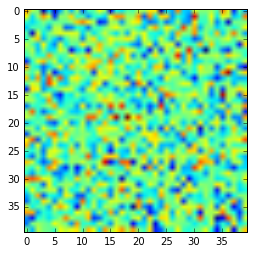

In [11]:
plt.imshow(sample_Z(40,40))
plt.show()

Iter: 0
D loss: 1.173
G_loss: 1.419
()


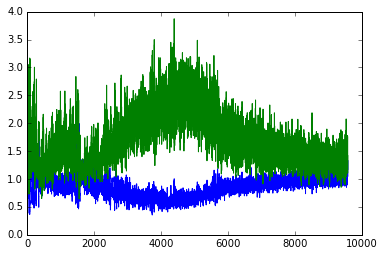

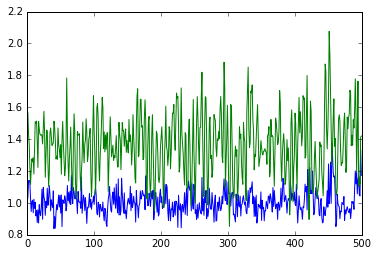

(128, 28, 28, 1)


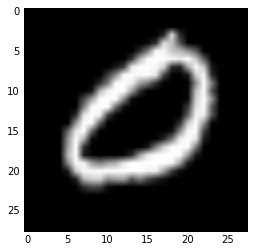

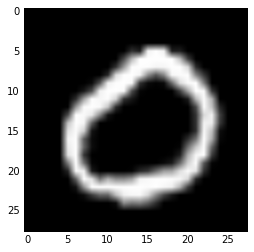

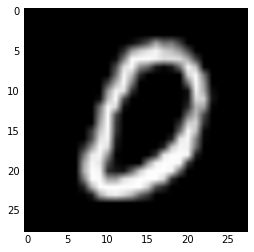

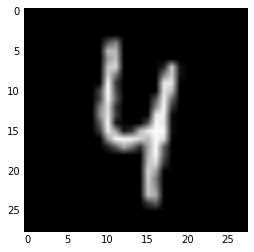

Iter: 1000
D loss: 0.9749
G_loss: 1.376
()


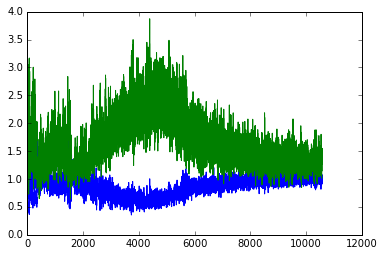

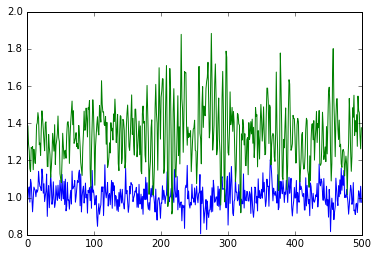

(128, 28, 28, 1)


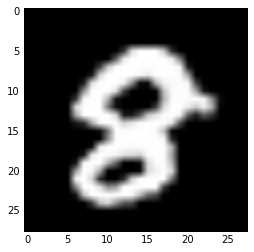

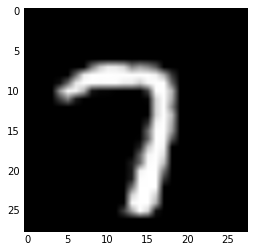

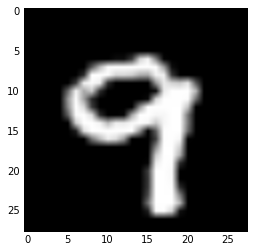

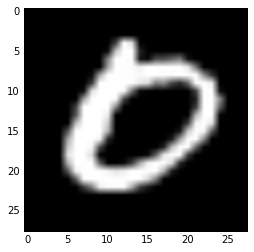

Iter: 2000
D loss: 1.059
G_loss: 1.606
()


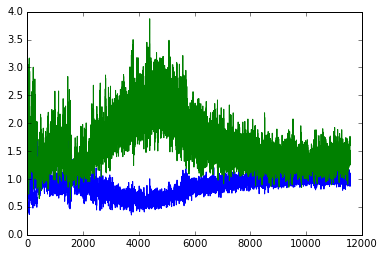

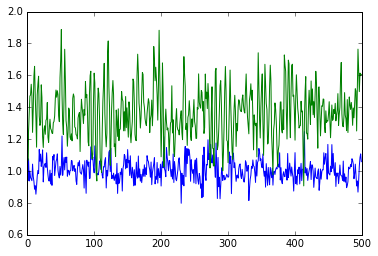

(128, 28, 28, 1)


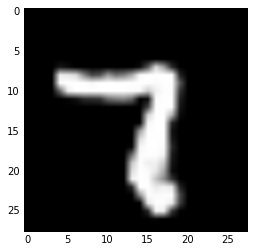

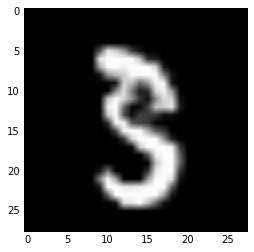

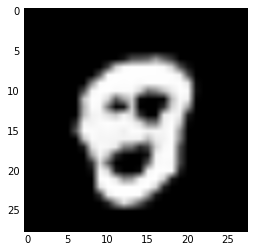

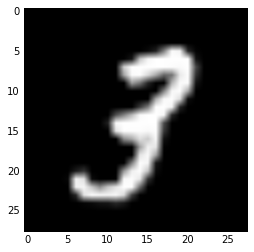

Iter: 3000
D loss: 1.04
G_loss: 1.206
()


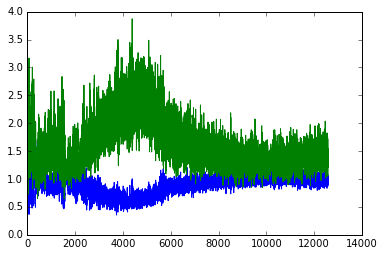

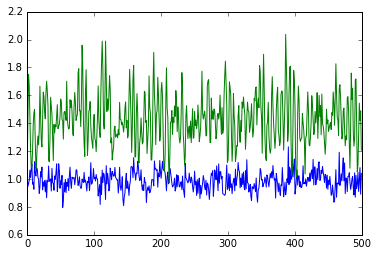

(128, 28, 28, 1)


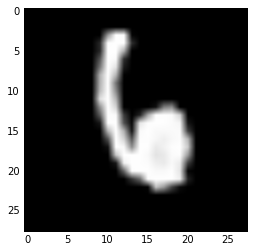

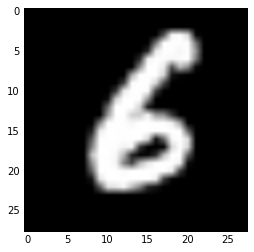

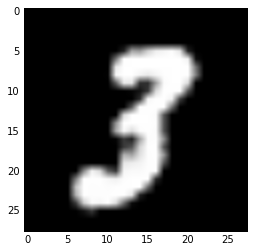

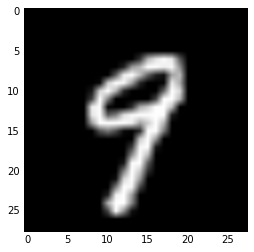

Iter: 4000
D loss: 0.959
G_loss: 1.357
()


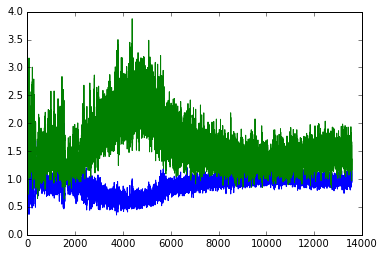

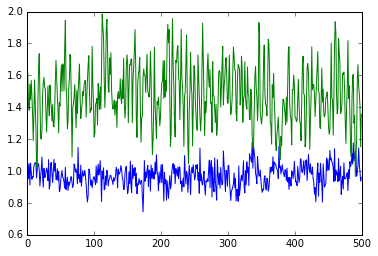

(128, 28, 28, 1)


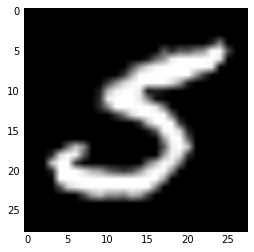

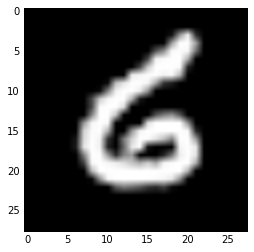

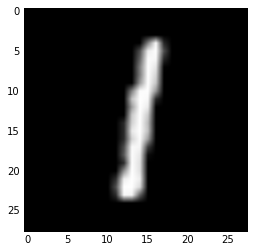

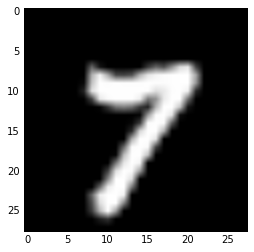

Iter: 5000
D loss: 0.8848
G_loss: 1.731
()


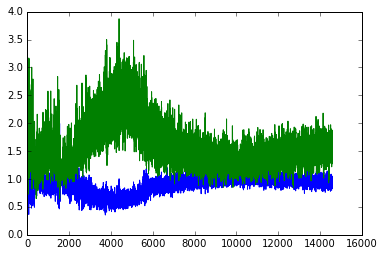

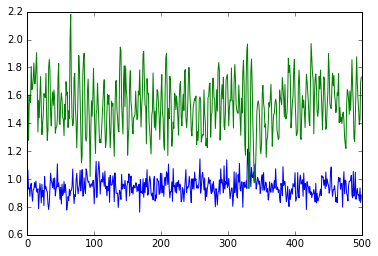

(128, 28, 28, 1)


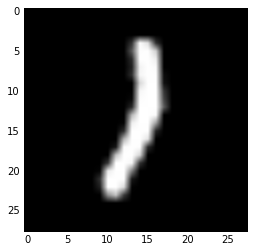

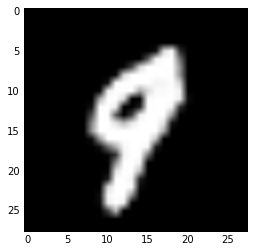

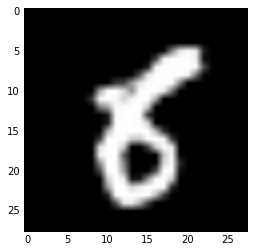

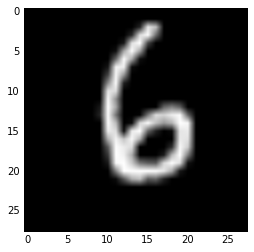

Iter: 6000
D loss: 0.9812
G_loss: 1.441
()


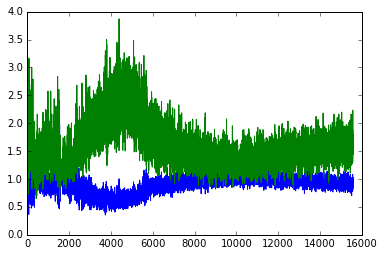

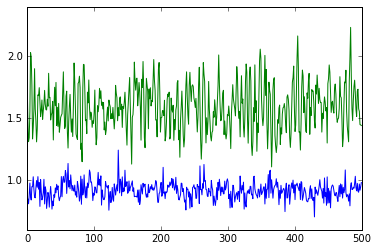

(128, 28, 28, 1)


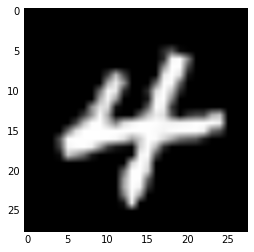

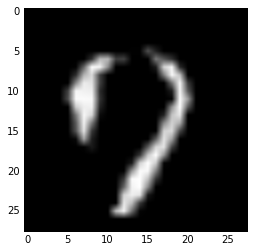

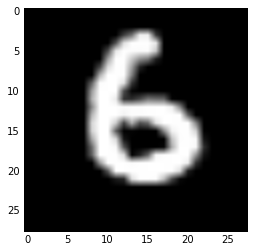

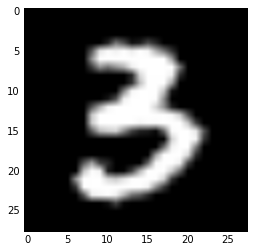

Iter: 7000
D loss: 0.8775
G_loss: 1.704
()


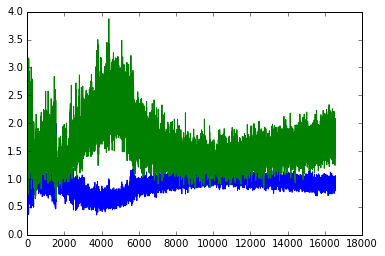

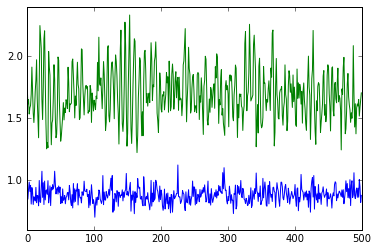

(128, 28, 28, 1)


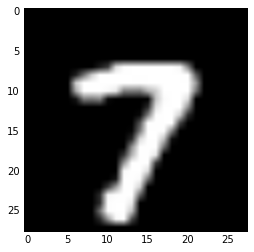

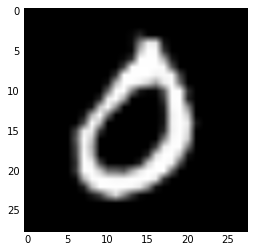

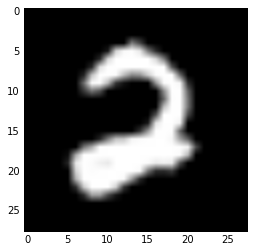

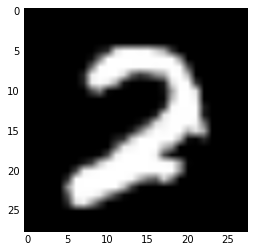

Iter: 8000
D loss: 0.7853
G_loss: 1.979
()


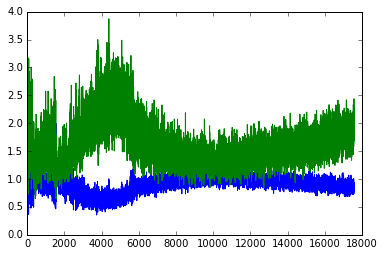

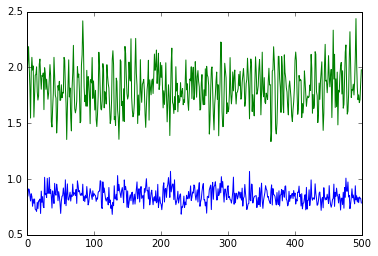

(128, 28, 28, 1)


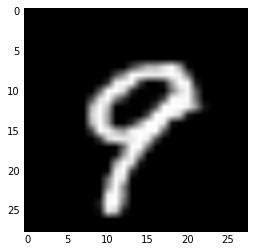

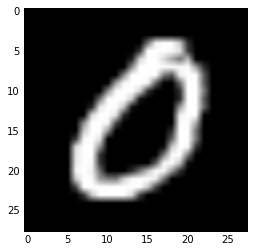

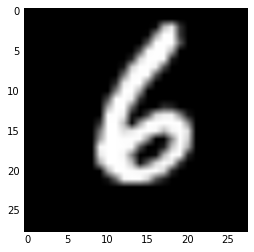

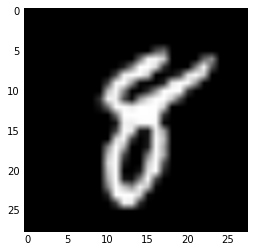

Iter: 9000
D loss: 0.7683
G_loss: 2.025
()


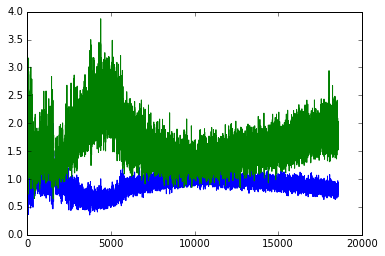

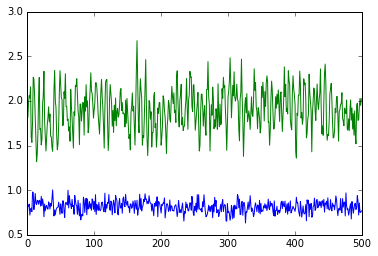

(128, 28, 28, 1)


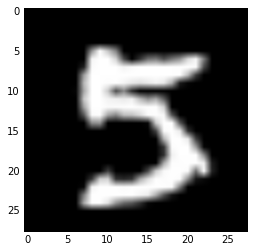

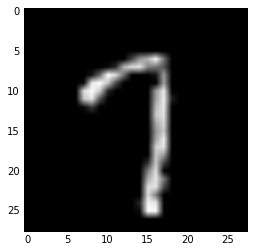

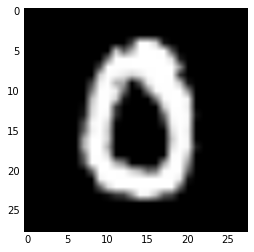

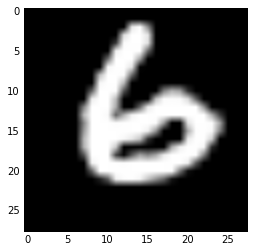

Iter: 10000
D loss: 0.8128
G_loss: 1.826
()


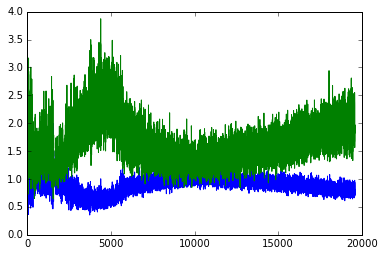

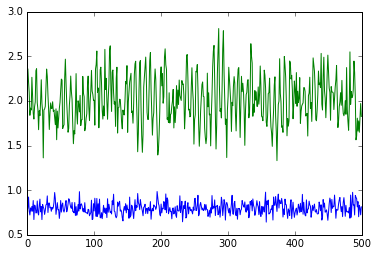

(128, 28, 28, 1)


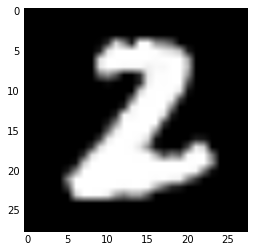

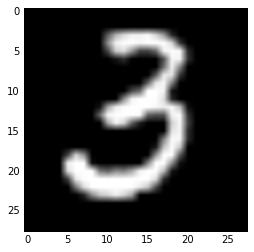

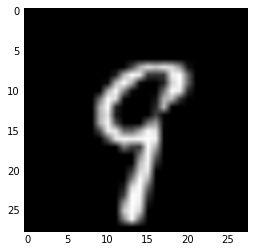

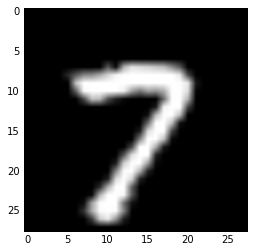

Iter: 11000
D loss: 0.6828
G_loss: 2.476
()


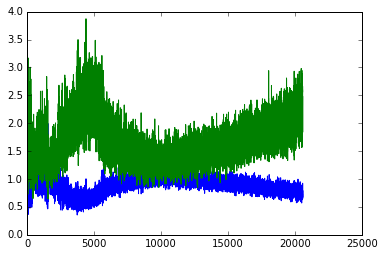

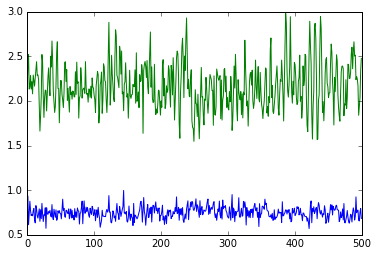

(128, 28, 28, 1)


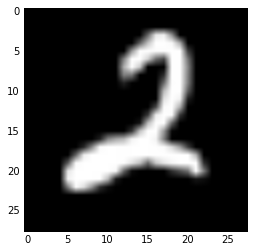

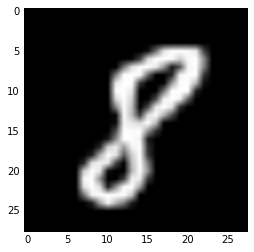

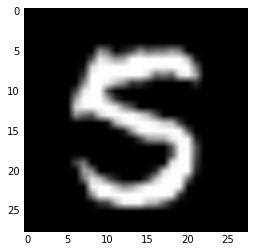

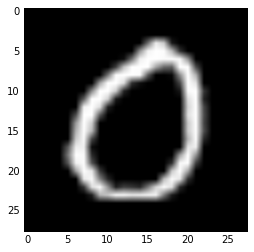

Iter: 12000
D loss: 0.7028
G_loss: 2.224
()


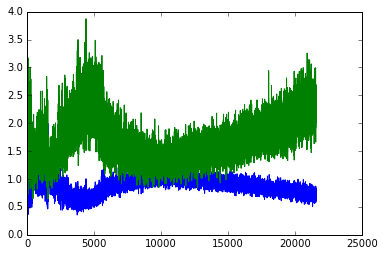

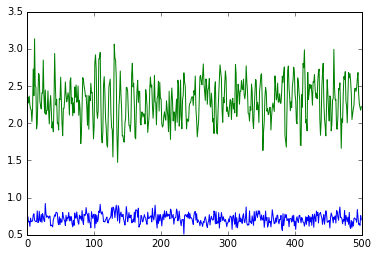

(128, 28, 28, 1)


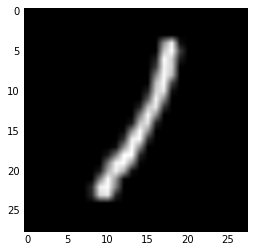

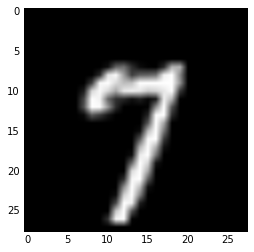

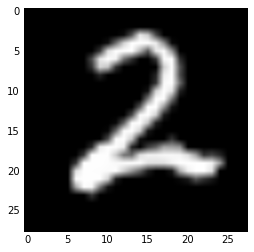

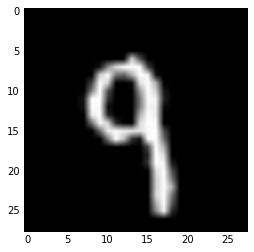

Iter: 13000
D loss: 0.6284
G_loss: 2.731
()


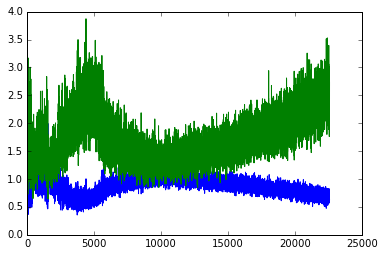

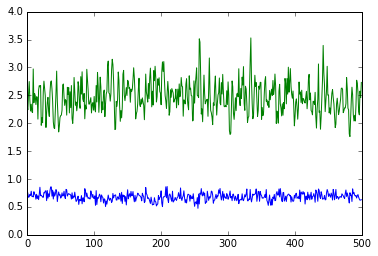

(128, 28, 28, 1)


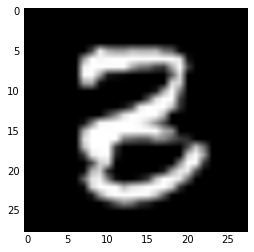

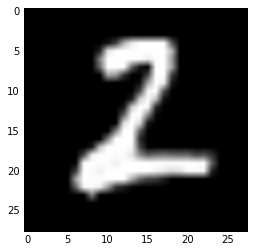

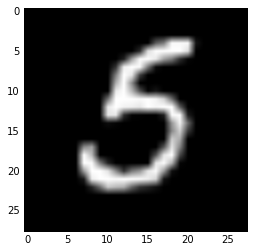

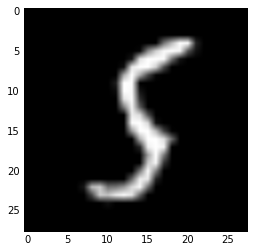

Iter: 14000
D loss: 0.6482
G_loss: 2.226
()


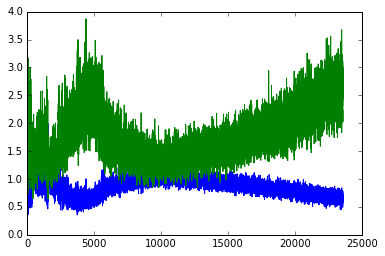

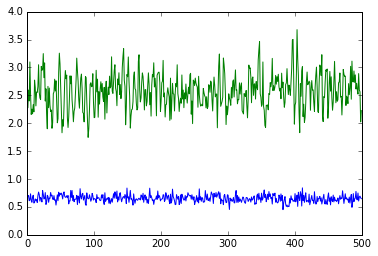

(128, 28, 28, 1)


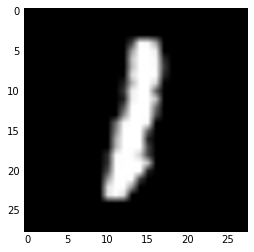

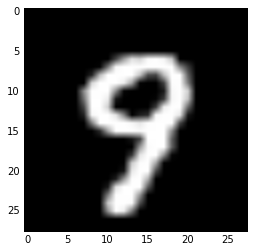

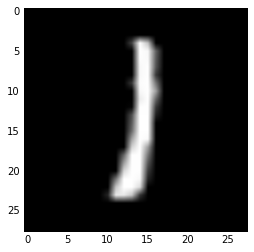

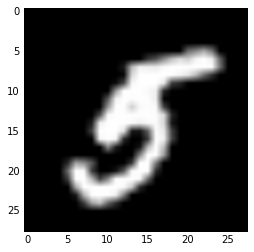

Iter: 15000
D loss: 0.8234
G_loss: 2.875
()


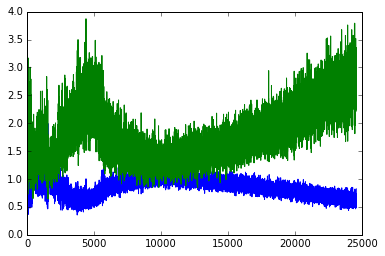

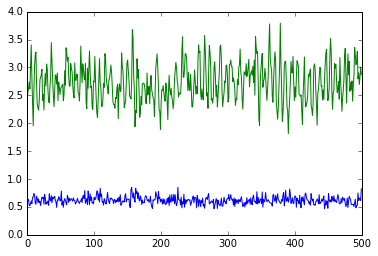

(128, 28, 28, 1)


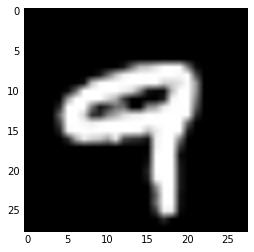

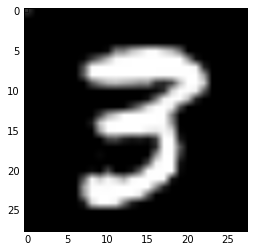

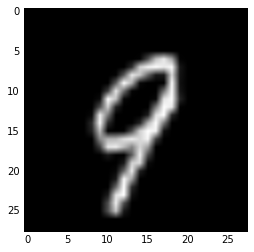

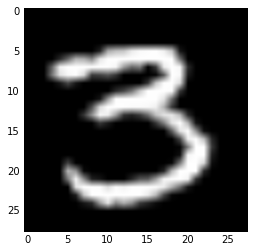

Iter: 16000
D loss: 0.583
G_loss: 2.87
()


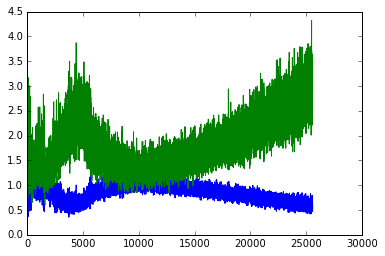

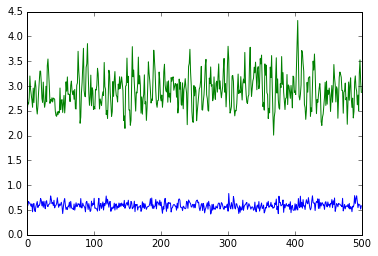

(128, 28, 28, 1)


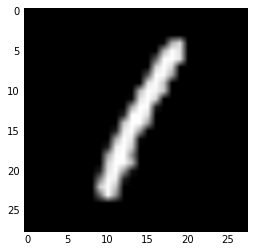

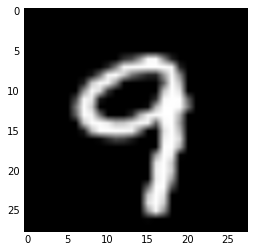

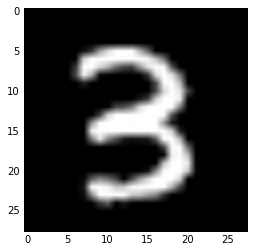

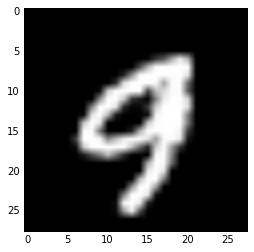

Iter: 17000
D loss: 0.5029
G_loss: 2.629
()


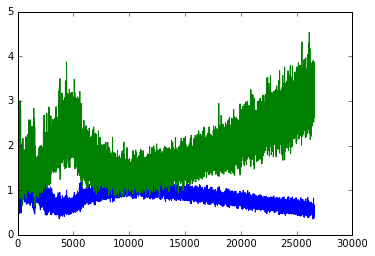

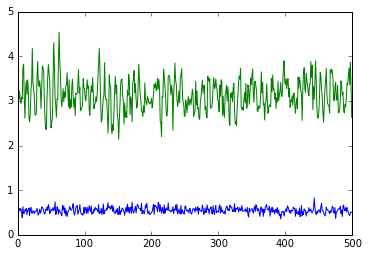

(128, 28, 28, 1)


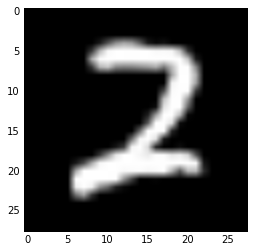

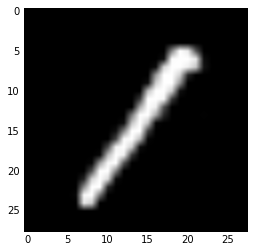

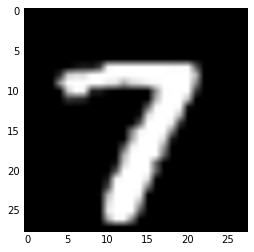

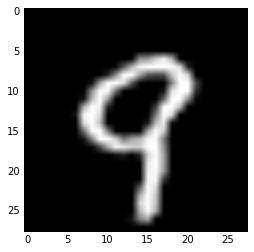

Iter: 18000
D loss: 0.4732
G_loss: 3.614
()


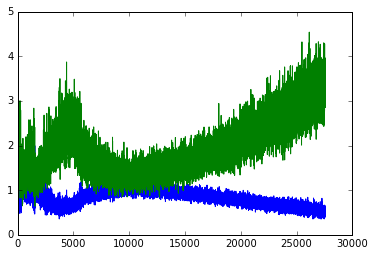

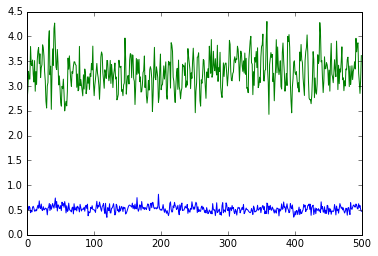

(128, 28, 28, 1)


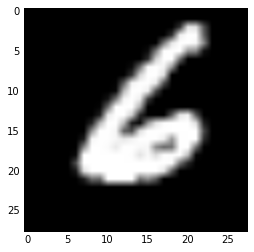

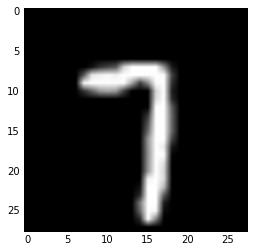

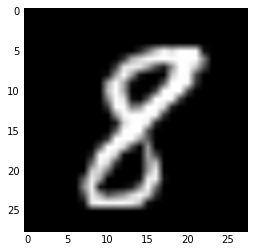

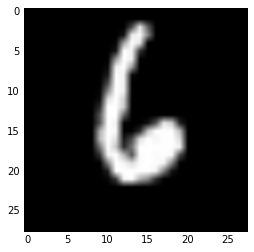

Iter: 19000
D loss: 0.6294
G_loss: 3.289
()


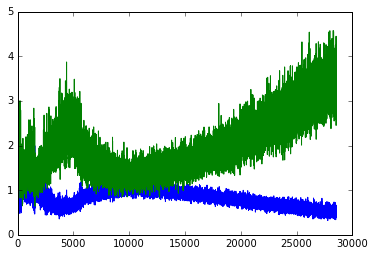

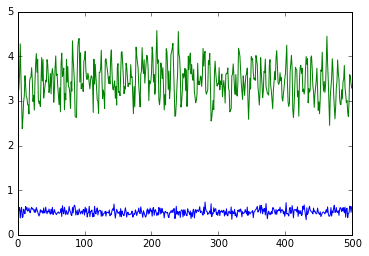

(128, 28, 28, 1)


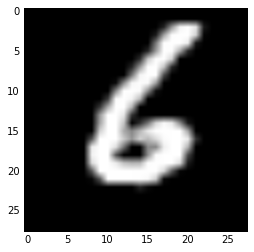

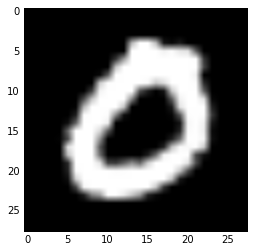

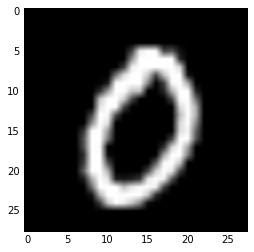

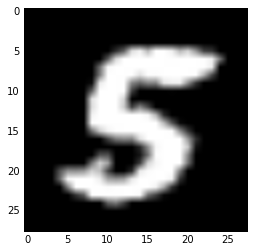

Iter: 20000
D loss: 0.3917
G_loss: 3.303
()


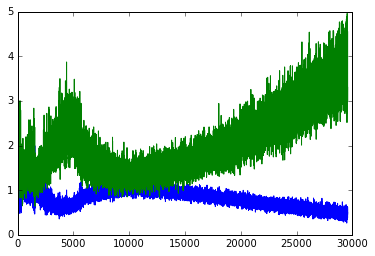

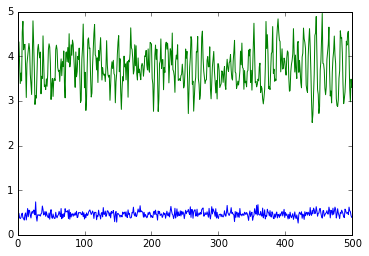

(128, 28, 28, 1)


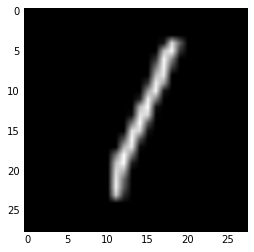

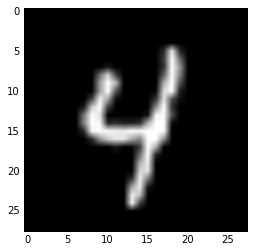

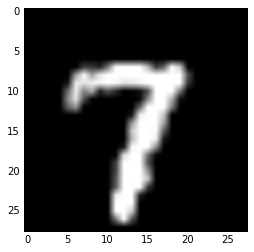

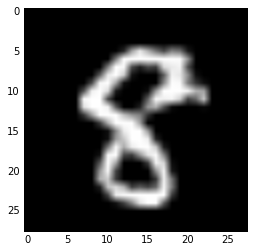

Iter: 21000
D loss: 0.4052
G_loss: 3.722
()


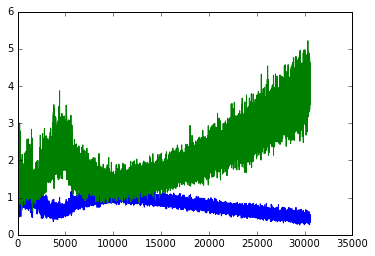

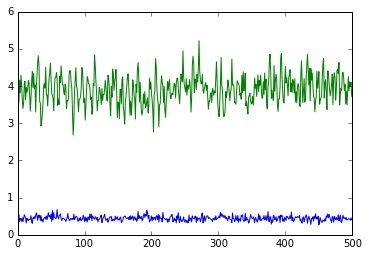

(128, 28, 28, 1)


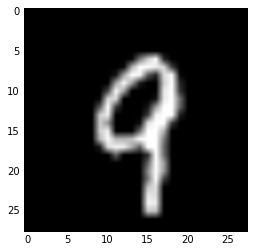

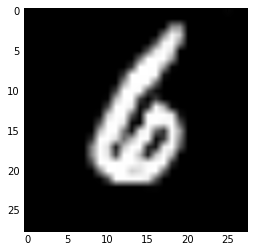

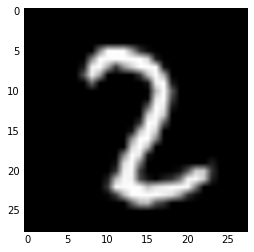

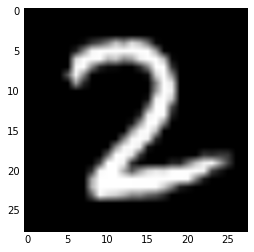

Iter: 22000
D loss: 0.483
G_loss: 3.915
()


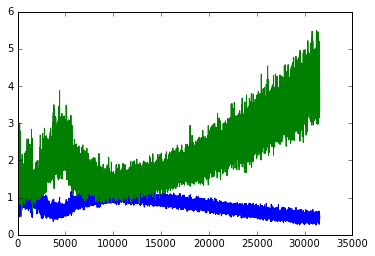

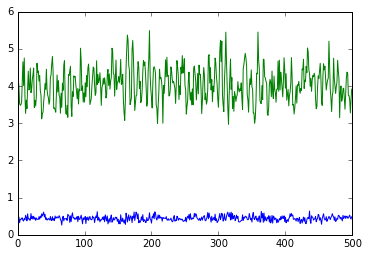

(128, 28, 28, 1)


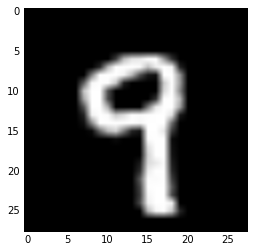

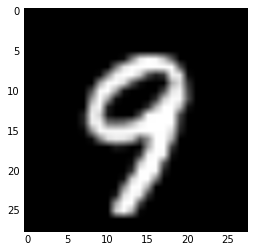

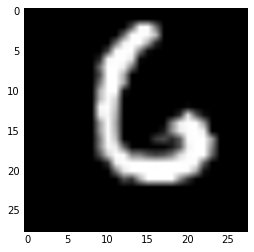

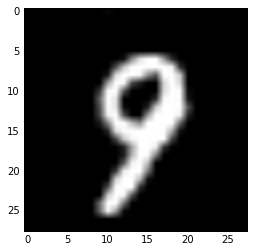

Iter: 23000
D loss: 0.3666
G_loss: 4.478
()


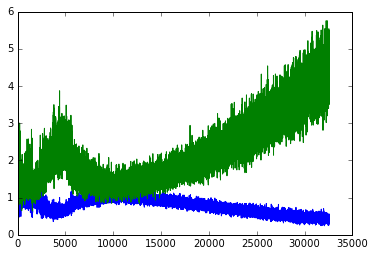

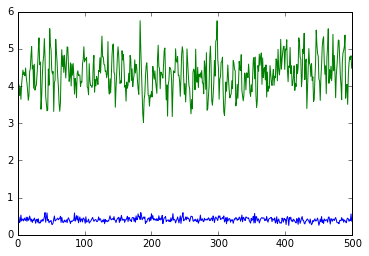

(128, 28, 28, 1)


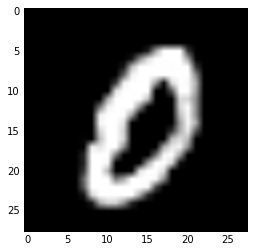

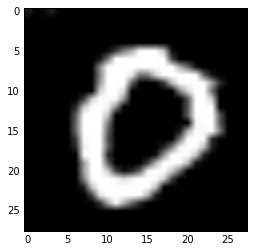

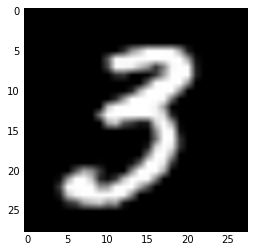

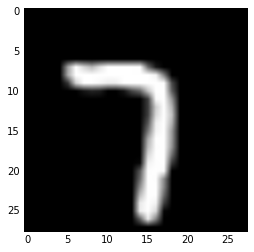

Iter: 24000
D loss: 0.3048
G_loss: 3.949
()


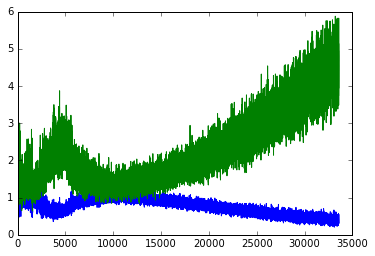

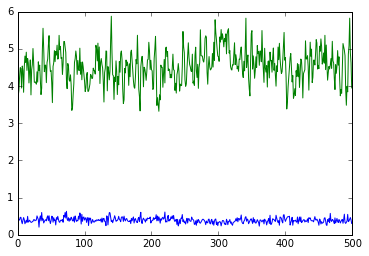

(128, 28, 28, 1)


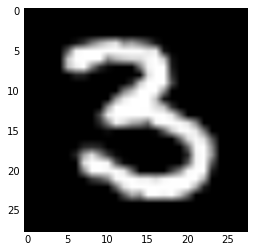

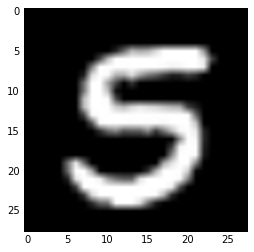

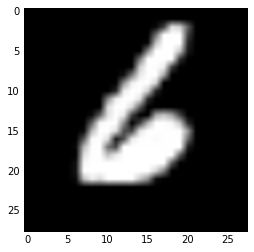

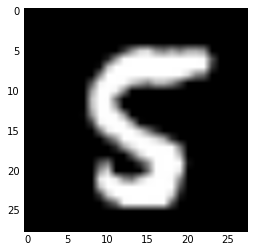

Iter: 25000
D loss: 0.4118
G_loss: 4.634
()


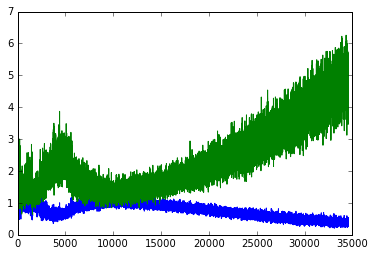

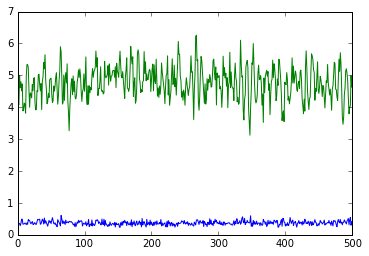

(128, 28, 28, 1)


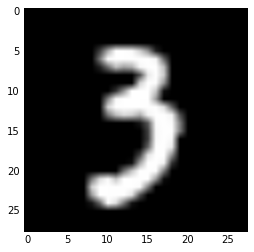

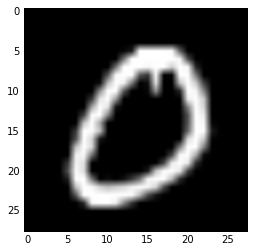

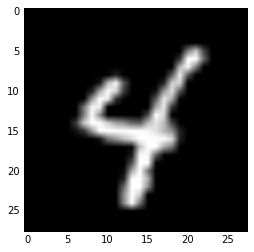

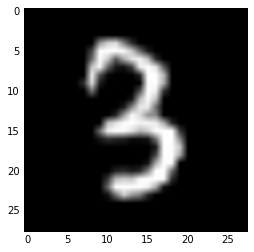

Iter: 26000
D loss: 0.2916
G_loss: 5.587
()


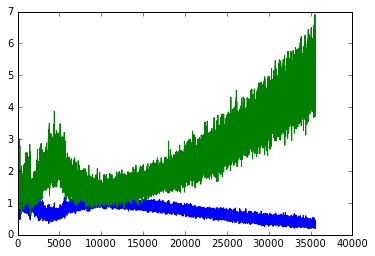

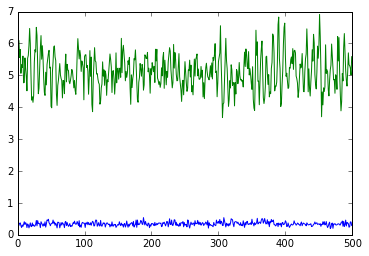

(128, 28, 28, 1)


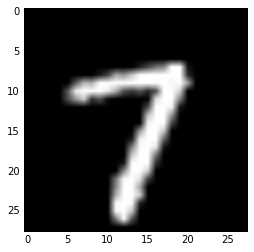

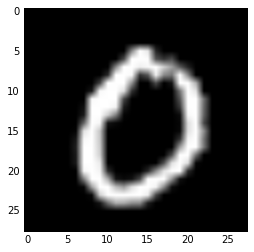

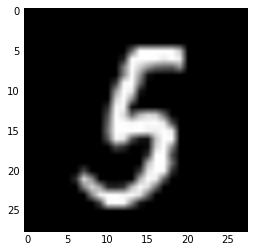

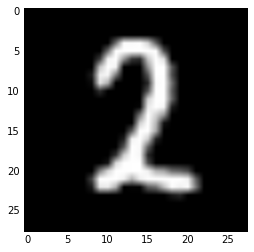

Iter: 27000
D loss: 0.3806
G_loss: 5.667
()


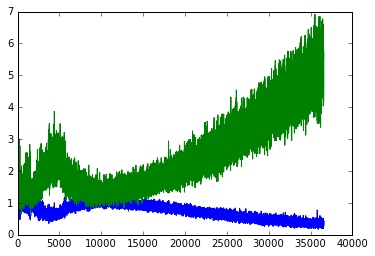

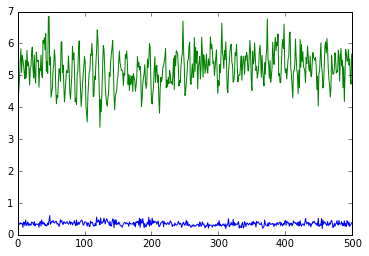

(128, 28, 28, 1)


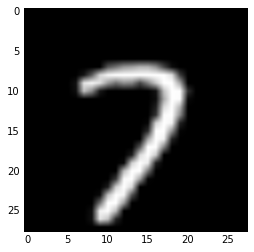

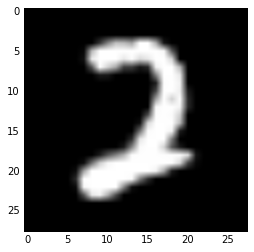

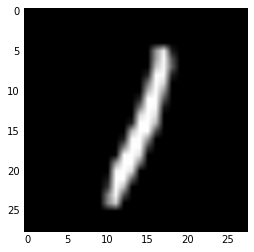

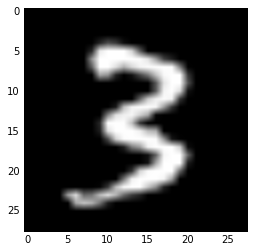

Iter: 28000
D loss: 0.3068
G_loss: 5.724
()


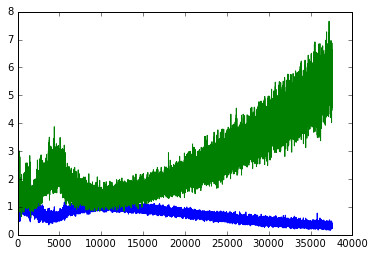

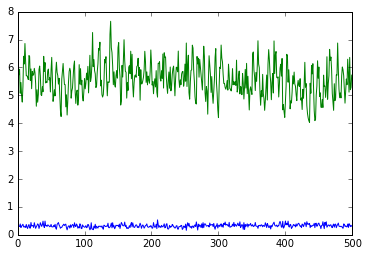

(128, 28, 28, 1)


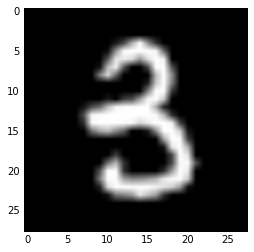

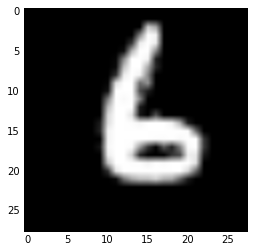

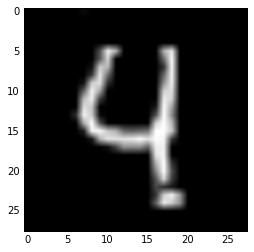

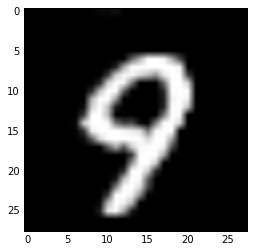

Iter: 29000
D loss: 0.2698
G_loss: 6.033
()


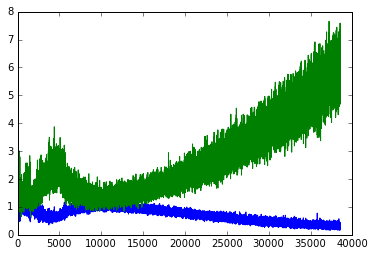

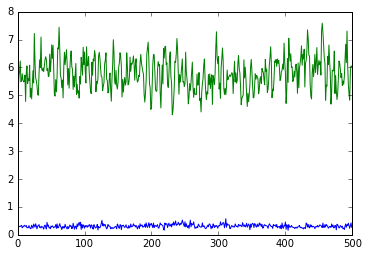

(128, 28, 28, 1)


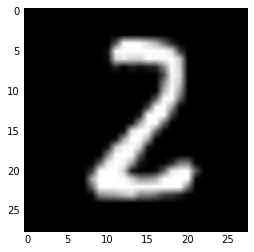

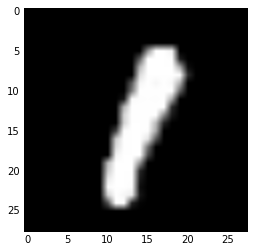

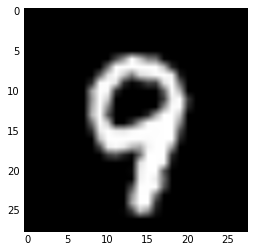

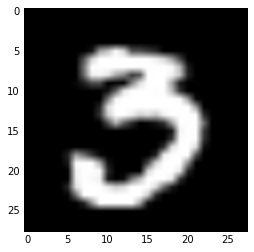

Iter: 30000
D loss: 0.3715
G_loss: 5.773
()


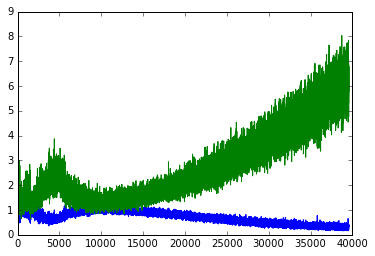

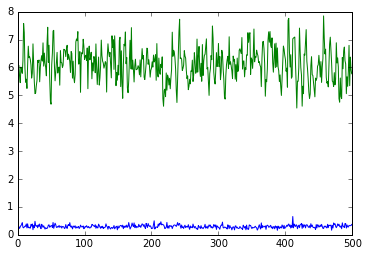

(128, 28, 28, 1)


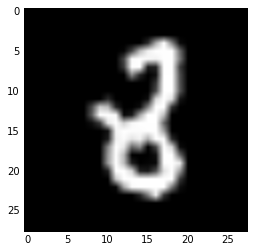

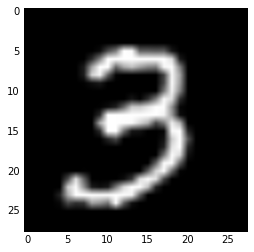

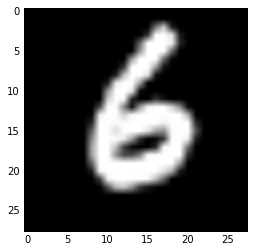

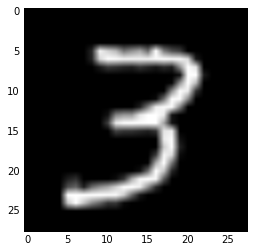

Iter: 31000
D loss: 0.3027
G_loss: 5.86
()


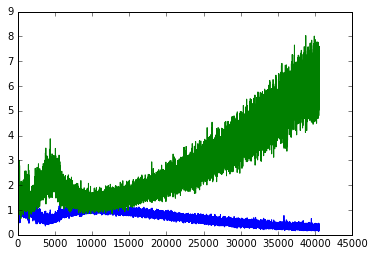

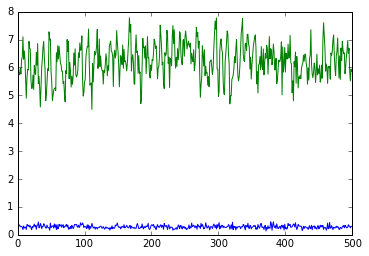

(128, 28, 28, 1)


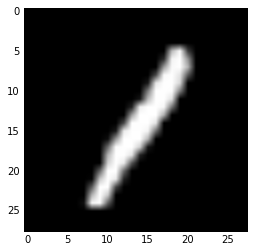

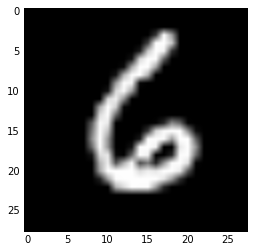

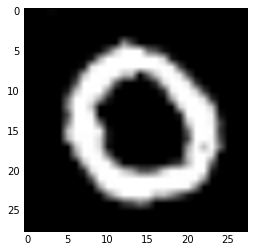

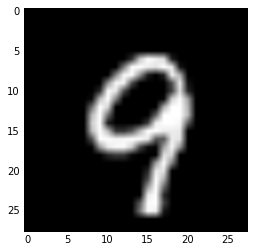

Iter: 32000
D loss: 0.2214
G_loss: 6.665
()


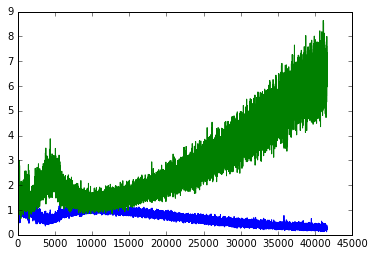

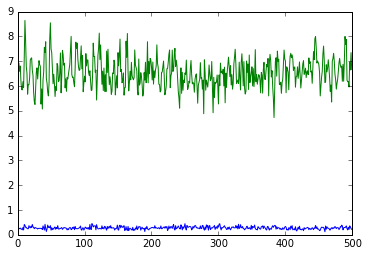

(128, 28, 28, 1)


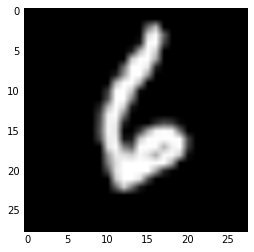

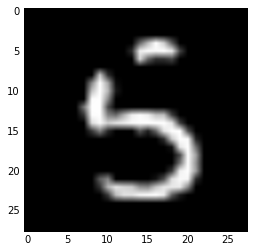

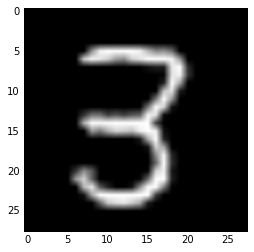

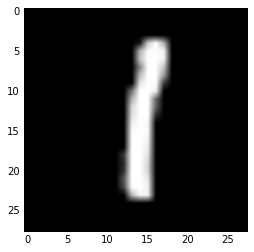

Iter: 33000
D loss: 0.2993
G_loss: 6.071
()


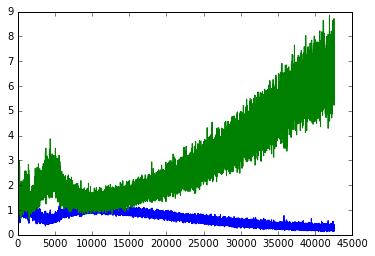

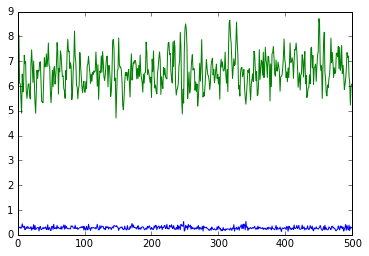

(128, 28, 28, 1)


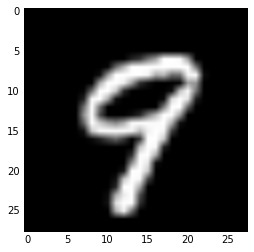

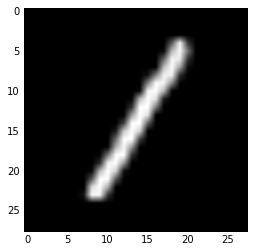

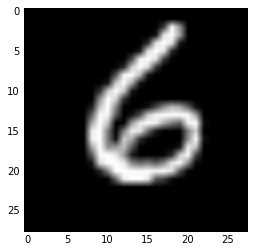

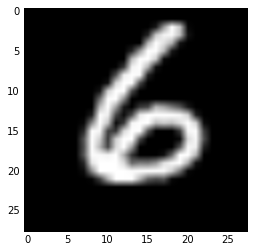

Iter: 34000
D loss: 0.256
G_loss: 6.565
()


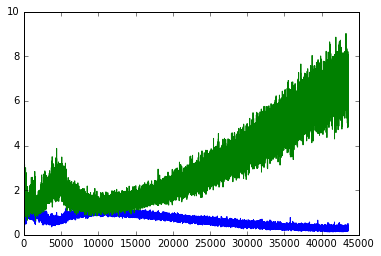

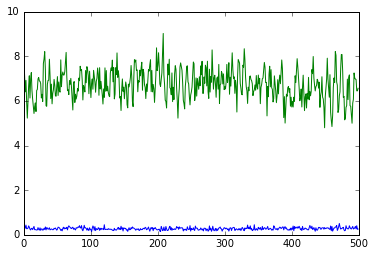

(128, 28, 28, 1)


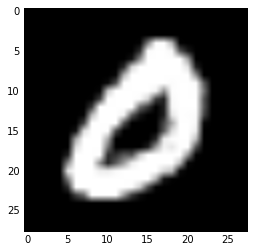

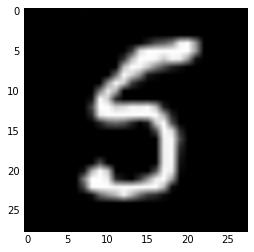

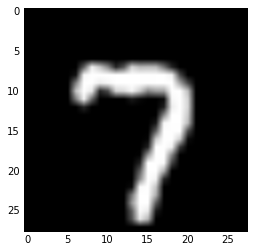

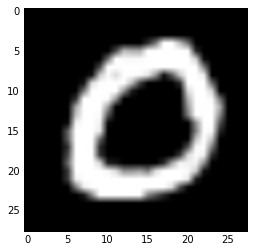

Iter: 35000
D loss: 0.2761
G_loss: 7.162
()


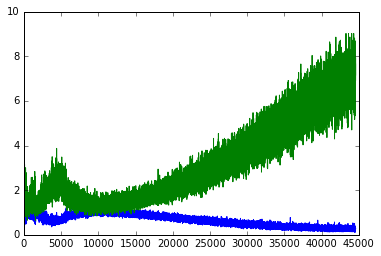

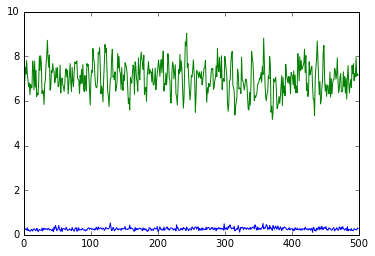

(128, 28, 28, 1)


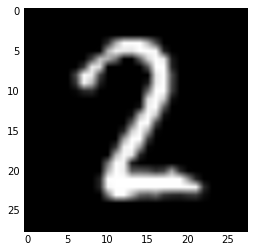

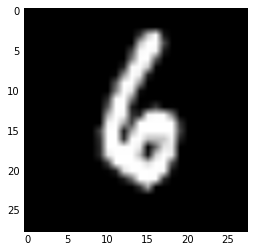

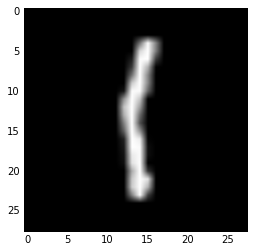

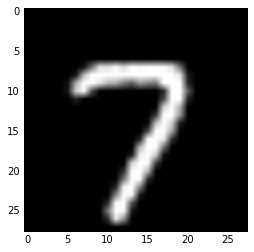

Iter: 36000
D loss: 0.1662
G_loss: 7.152
()


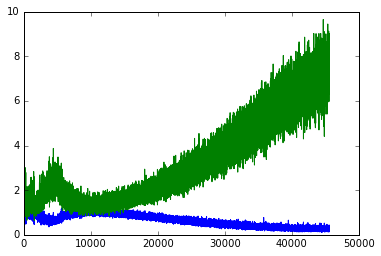

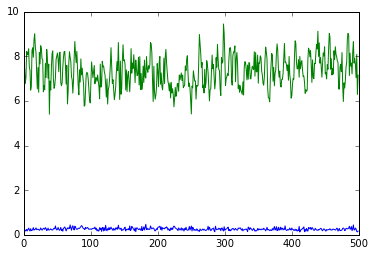

(128, 28, 28, 1)


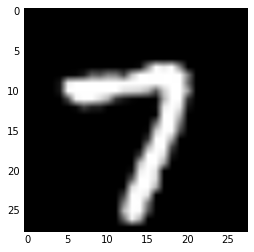

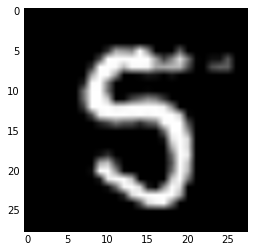

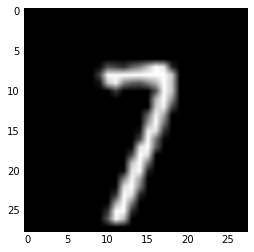

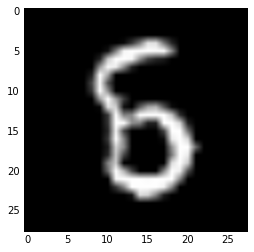

Iter: 37000
D loss: 0.2454
G_loss: 7.334
()


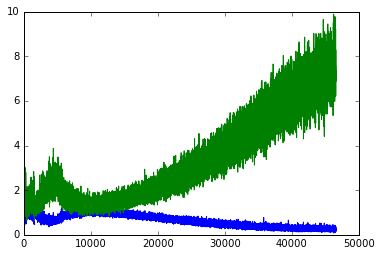

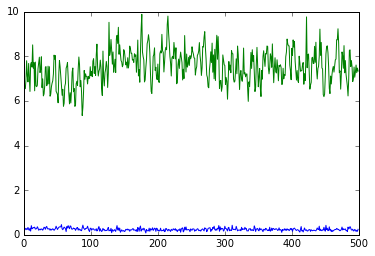

(128, 28, 28, 1)


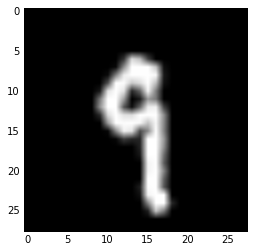

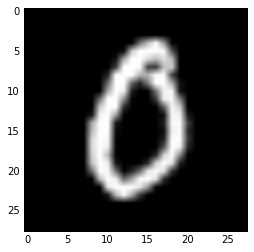

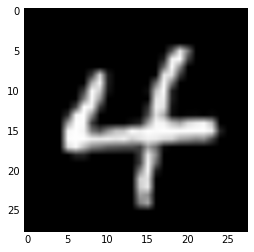

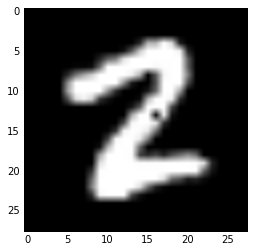

Iter: 38000
D loss: 0.1693
G_loss: 8.354
()


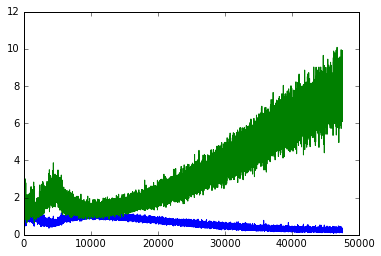

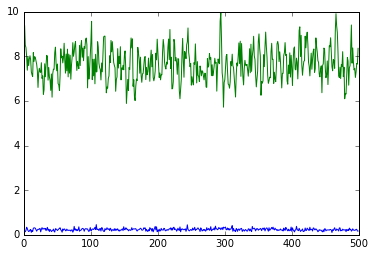

(128, 28, 28, 1)


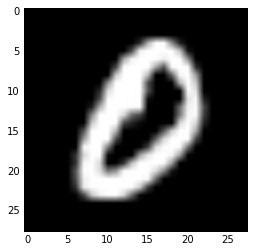

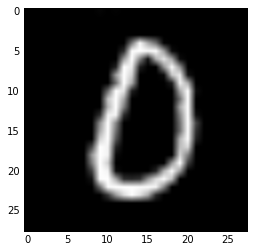

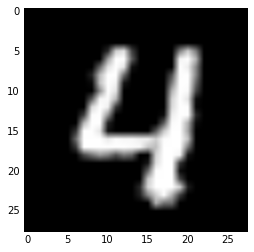

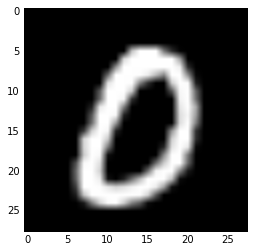

Iter: 39000
D loss: 0.2338
G_loss: 8.413
()


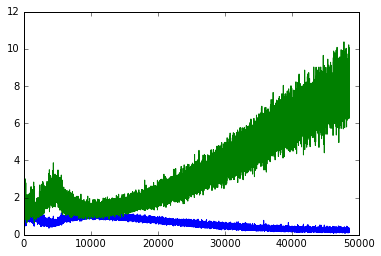

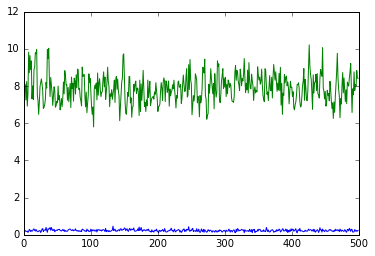

(128, 28, 28, 1)


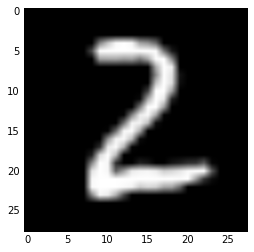

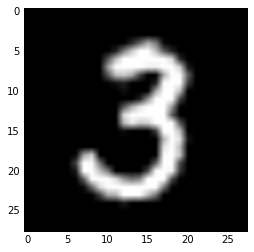

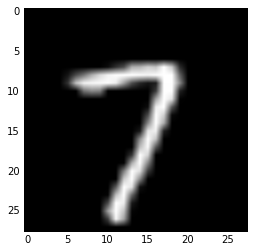

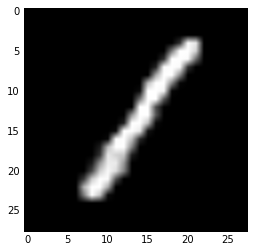

Iter: 40000
D loss: 0.2384
G_loss: 7.73
()


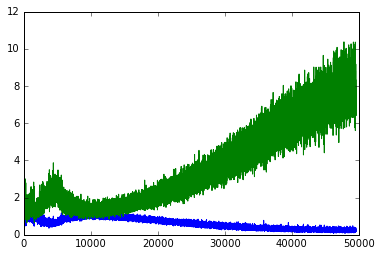

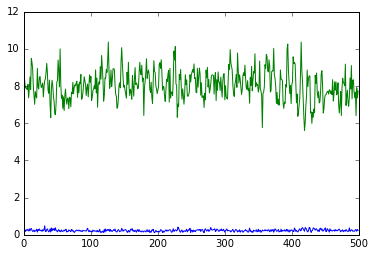

(128, 28, 28, 1)


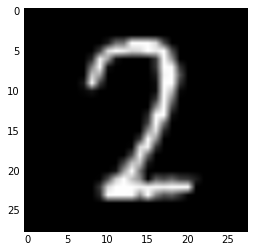

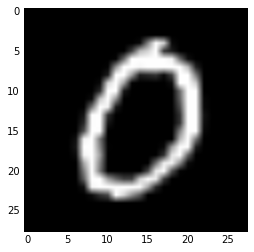

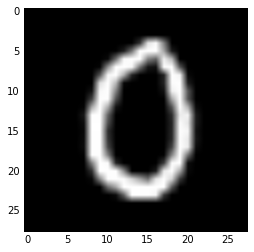

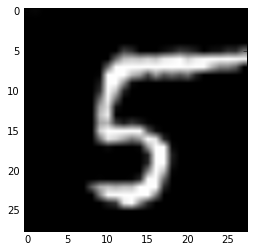

Iter: 41000
D loss: 0.2966
G_loss: 8.563
()


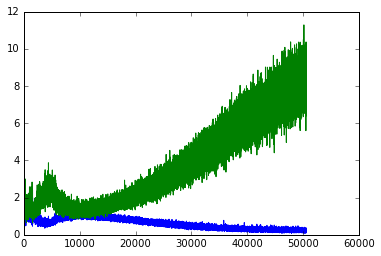

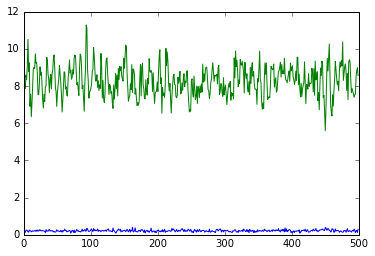

(128, 28, 28, 1)


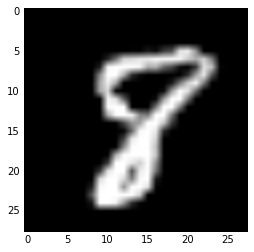

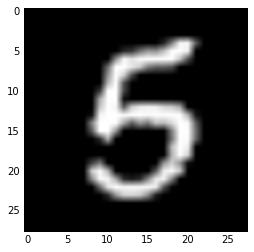

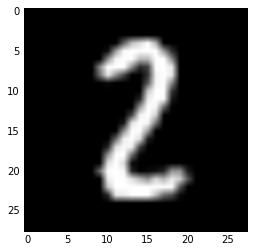

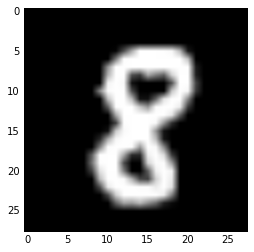

Iter: 42000
D loss: 0.318
G_loss: 8.495
()


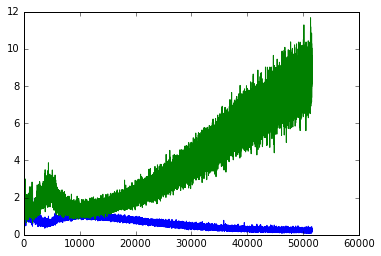

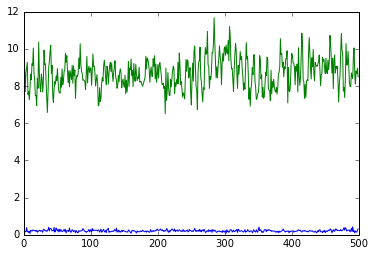

(128, 28, 28, 1)


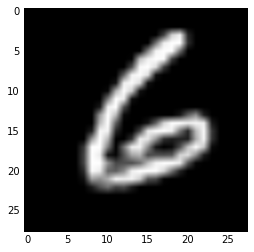

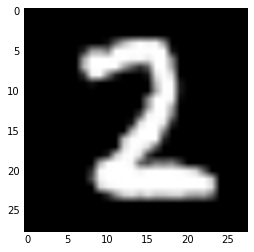

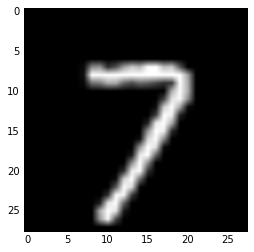

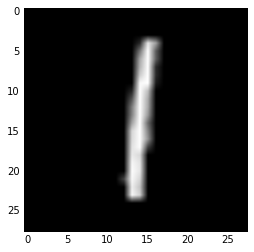

Iter: 43000
D loss: 0.2947
G_loss: 8.228
()


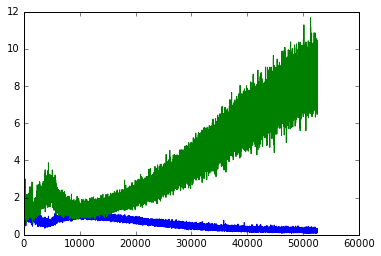

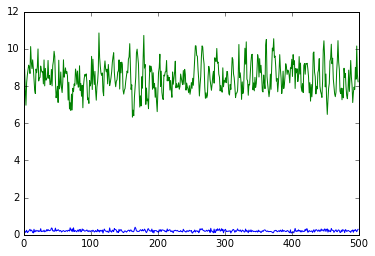

(128, 28, 28, 1)


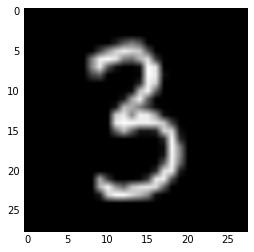

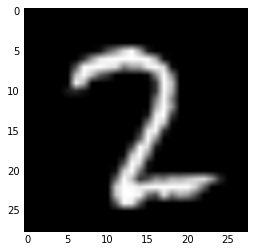

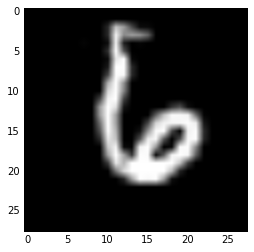

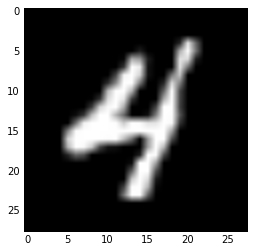

Iter: 44000
D loss: 0.1897
G_loss: 9.13
()


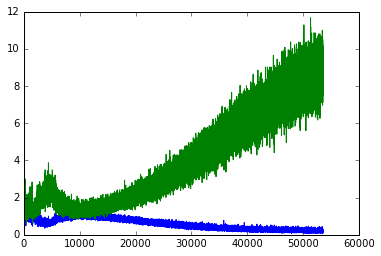

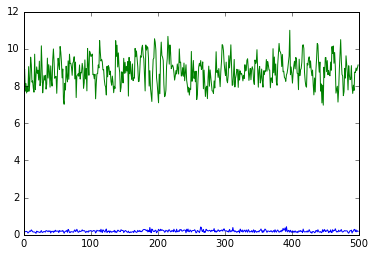

(128, 28, 28, 1)


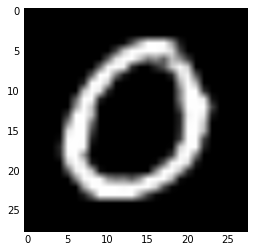

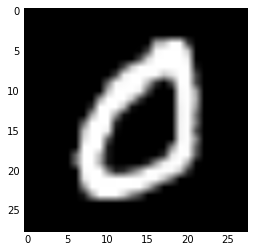

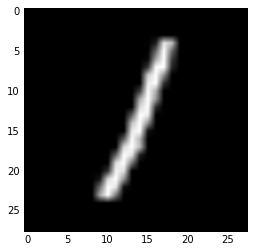

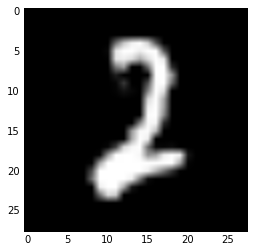

Iter: 45000
D loss: 0.3029
G_loss: 7.573
()


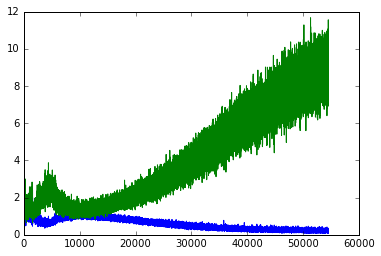

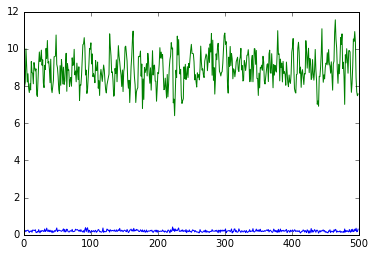

(128, 28, 28, 1)


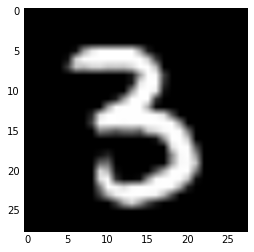

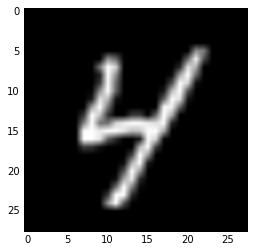

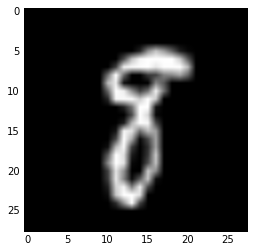

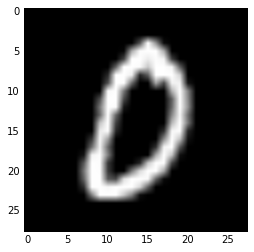

Iter: 46000
D loss: 0.1316
G_loss: 9.304
()


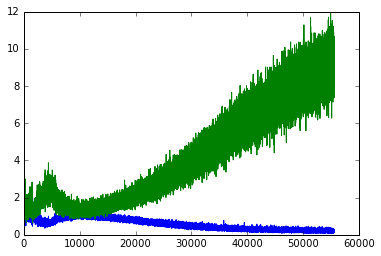

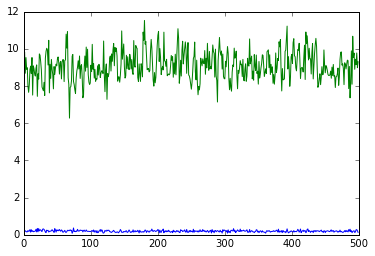

(128, 28, 28, 1)


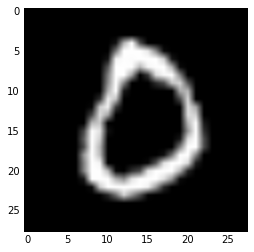

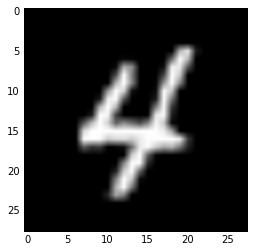

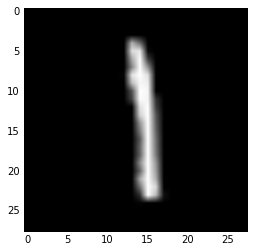

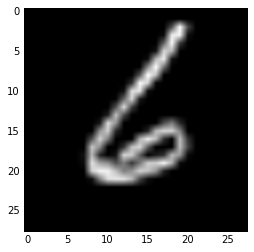

Iter: 47000
D loss: 0.1825
G_loss: 11.11
()


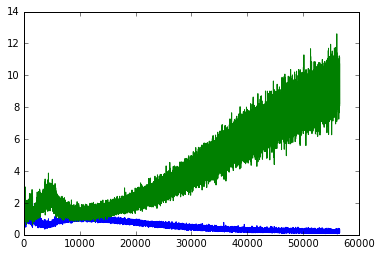

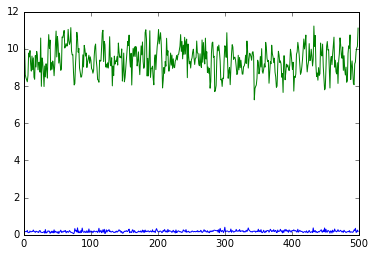

(128, 28, 28, 1)


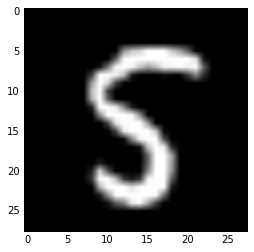

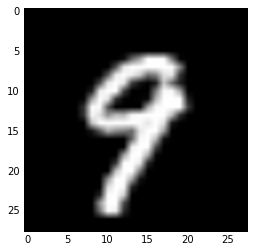

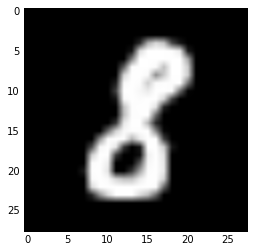

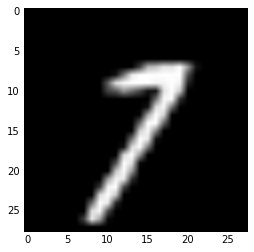

Iter: 48000
D loss: 0.2461
G_loss: 9.423
()


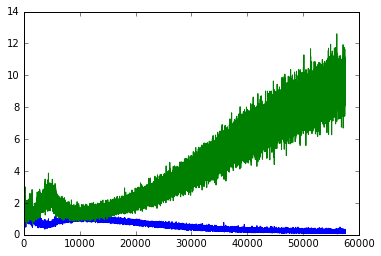

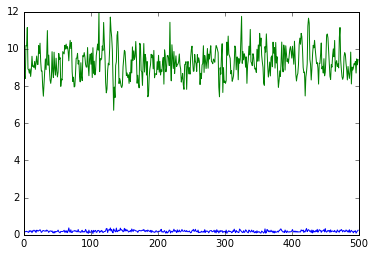

(128, 28, 28, 1)


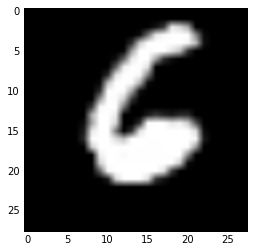

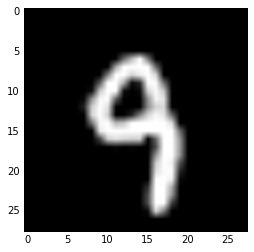

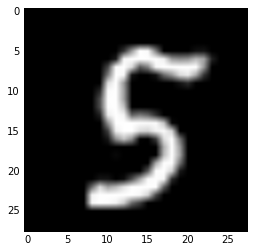

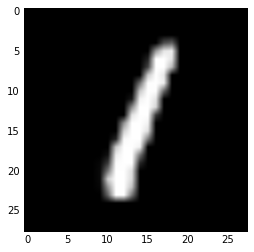

Iter: 49000
D loss: 0.1978
G_loss: 10.49
()


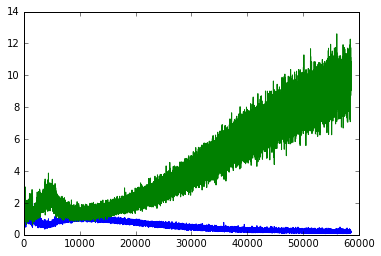

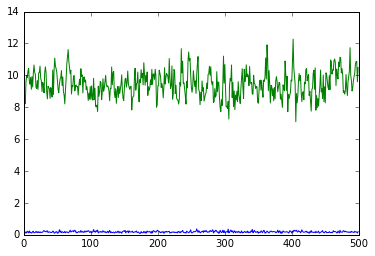

(128, 28, 28, 1)


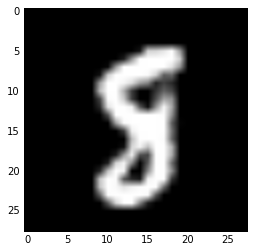

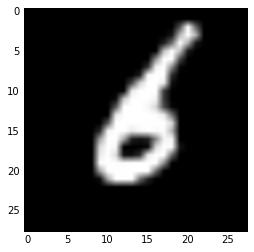

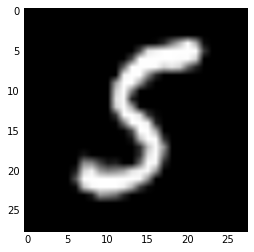

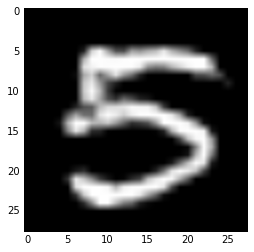

Iter: 50000
D loss: 0.1704
G_loss: 9.411
()


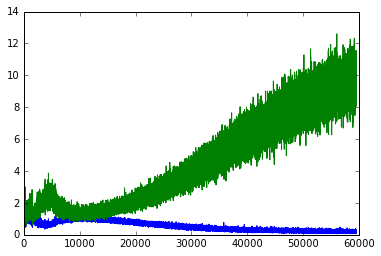

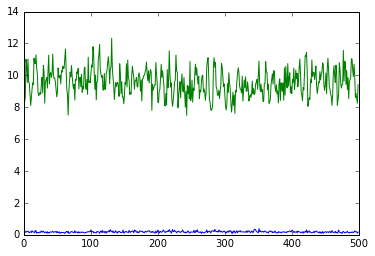

(128, 28, 28, 1)


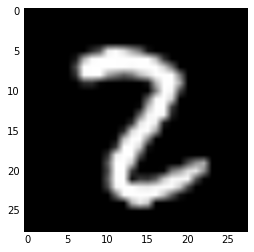

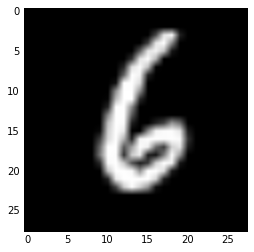

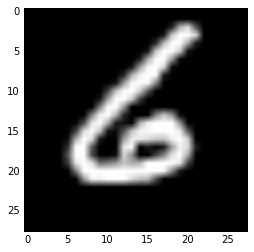

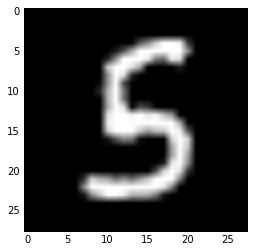

Iter: 51000
D loss: 0.1848
G_loss: 10.37
()


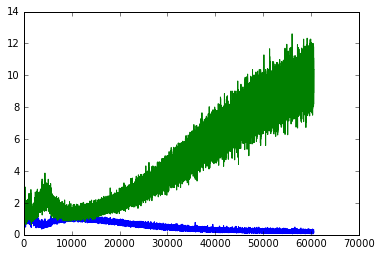

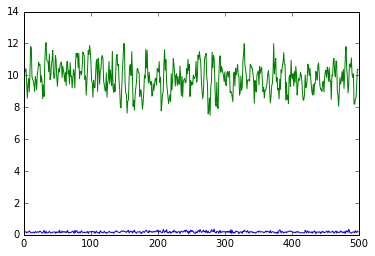

(128, 28, 28, 1)


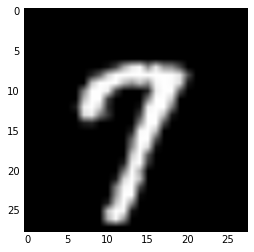

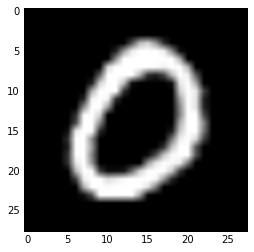

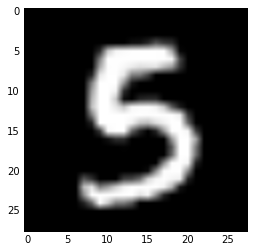

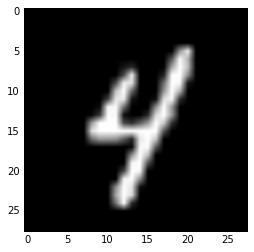

Iter: 52000
D loss: 0.2557
G_loss: 9.638
()


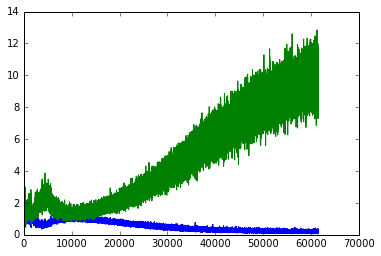

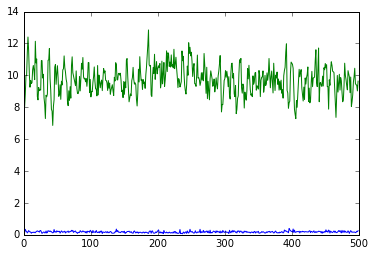

(128, 28, 28, 1)


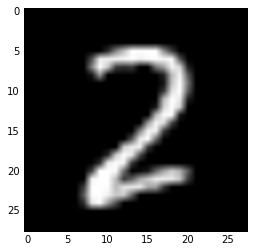

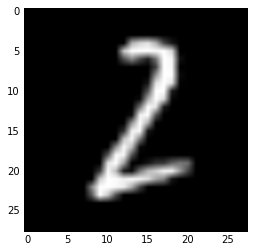

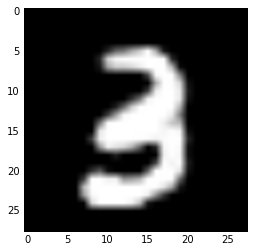

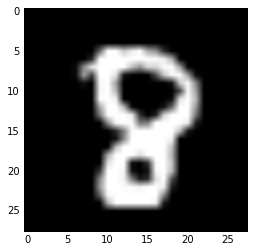

Iter: 53000
D loss: 0.2162
G_loss: 9.742
()


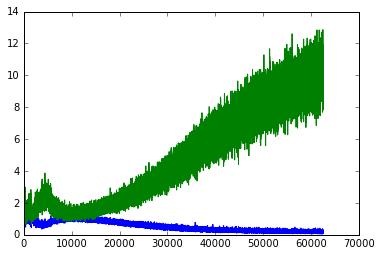

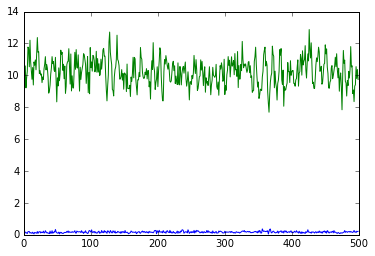

(128, 28, 28, 1)


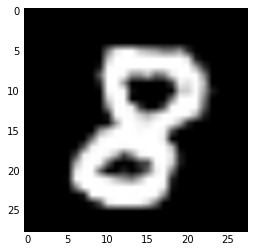

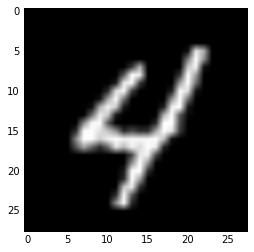

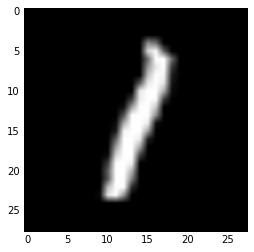

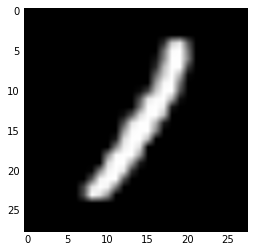

Iter: 54000
D loss: 0.2369
G_loss: 9.301
()


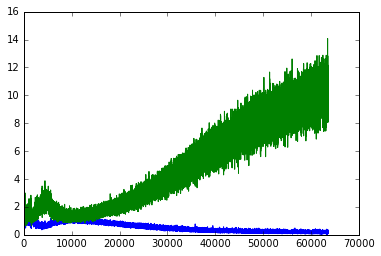

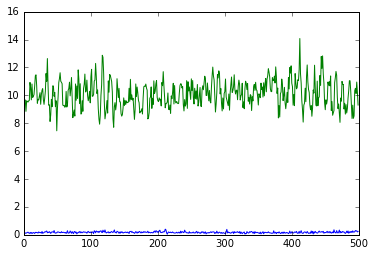

(128, 28, 28, 1)


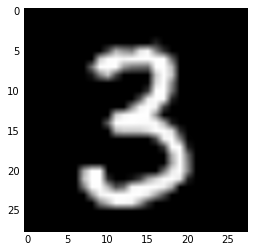

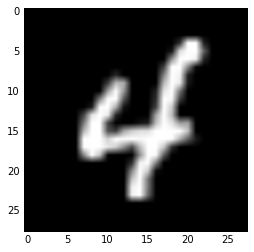

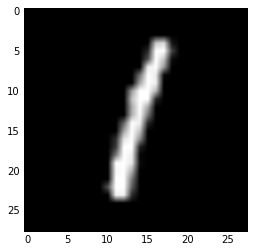

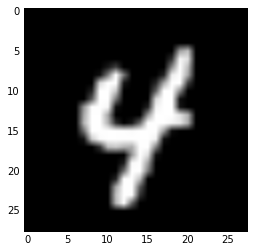

Iter: 55000
D loss: 0.08108
G_loss: 10.6
()


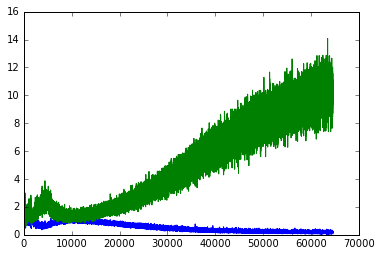

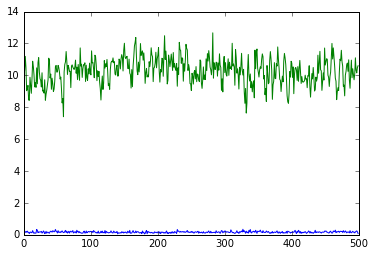

(128, 28, 28, 1)


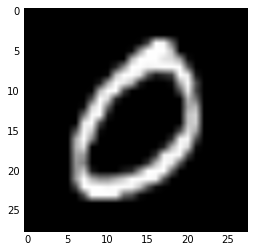

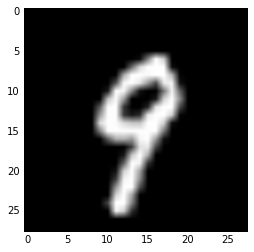

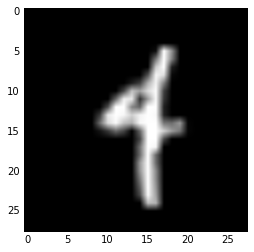

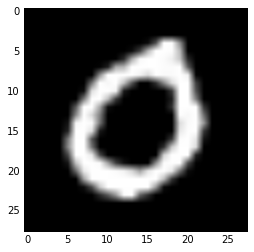

Iter: 56000
D loss: 0.2751
G_loss: 10.54
()


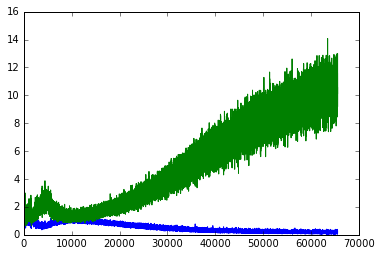

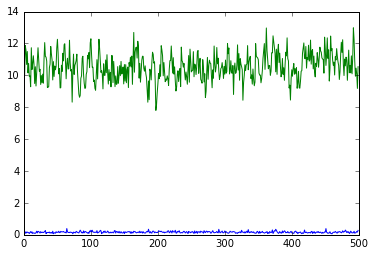

(128, 28, 28, 1)


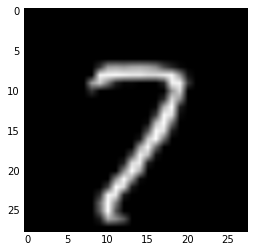

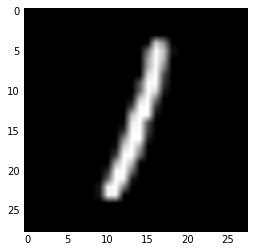

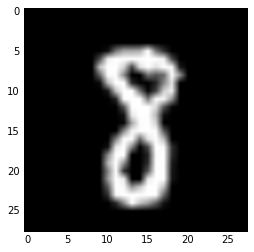

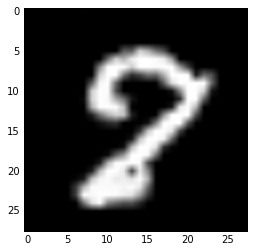

Iter: 57000
D loss: 0.1712
G_loss: 9.839
()


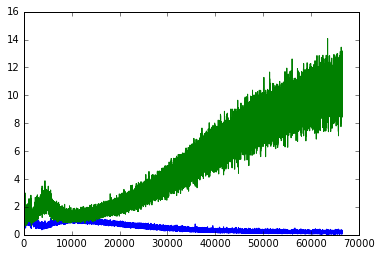

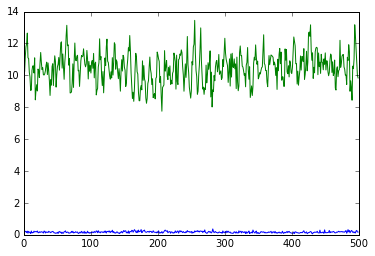

(128, 28, 28, 1)


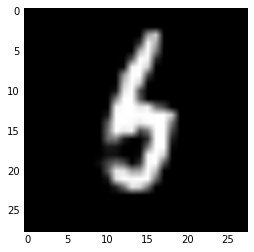

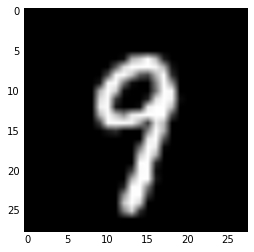

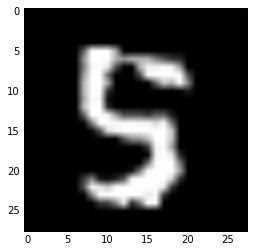

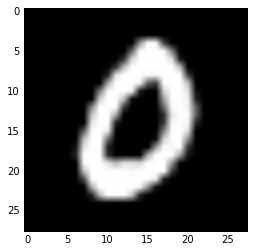

Iter: 58000
D loss: 0.1353
G_loss: 11.93
()


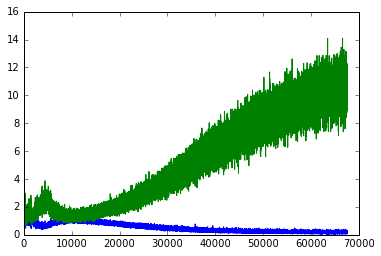

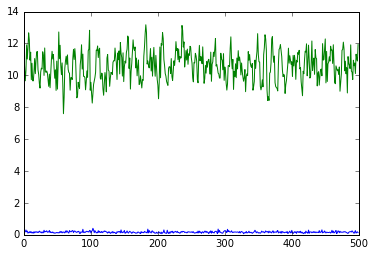

(128, 28, 28, 1)


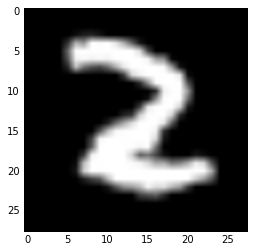

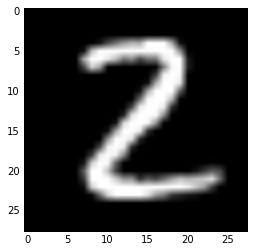

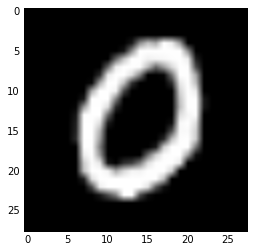

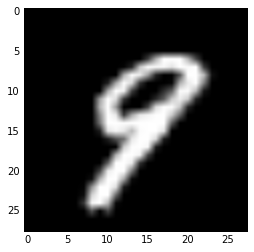

Iter: 59000
D loss: 0.07243
G_loss: 11.63
()


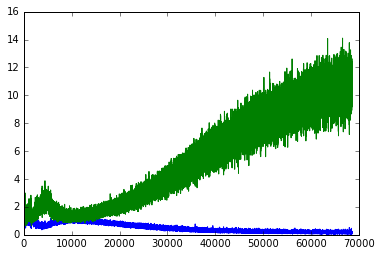

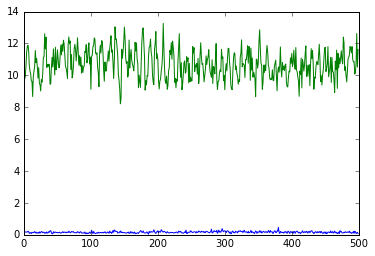

(128, 28, 28, 1)


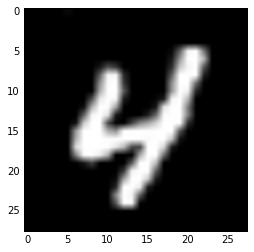

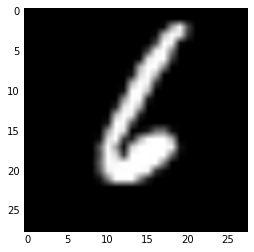

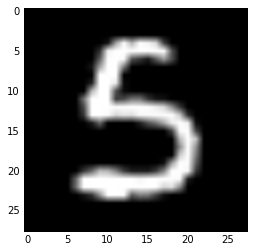

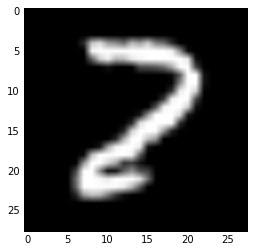

Iter: 60000
D loss: 0.1945
G_loss: 11.22
()


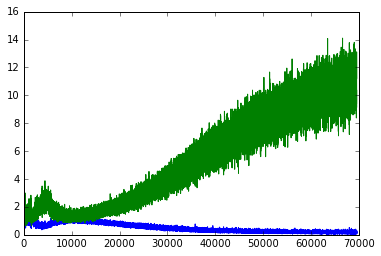

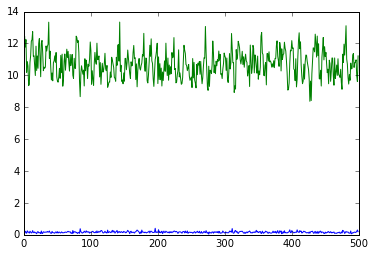

(128, 28, 28, 1)


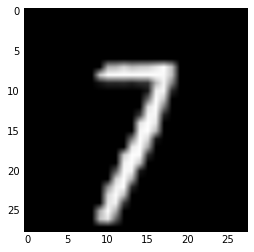

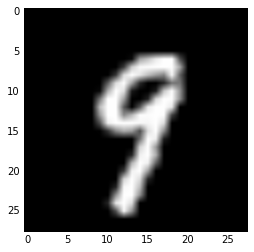

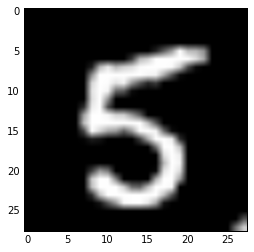

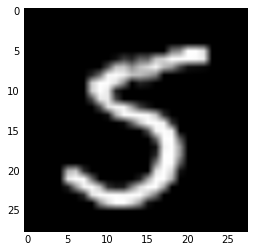

Iter: 61000
D loss: 0.2041
G_loss: 10.55
()


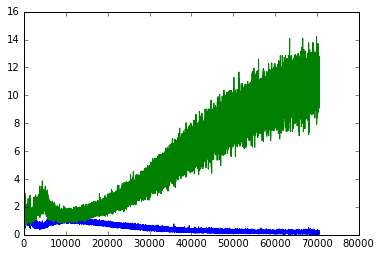

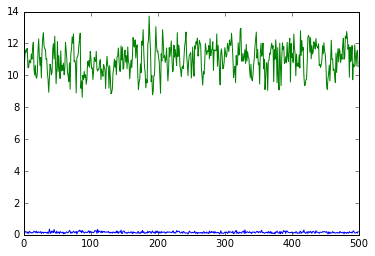

(128, 28, 28, 1)


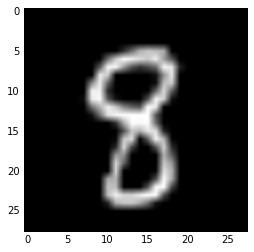

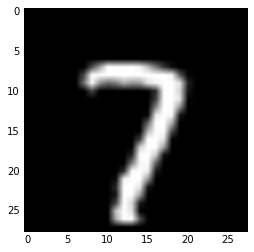

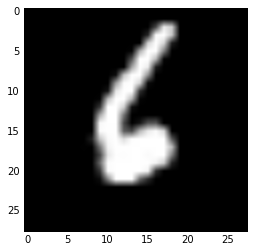

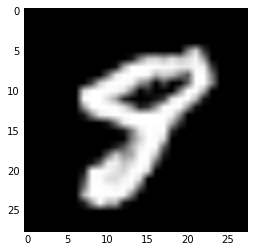

Iter: 62000
D loss: 0.1369
G_loss: 9.475
()


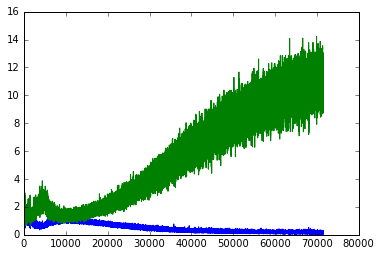

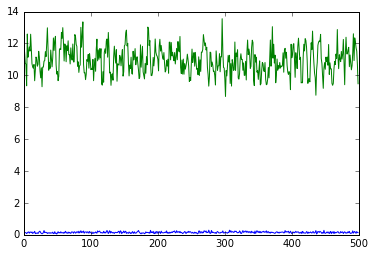

(128, 28, 28, 1)


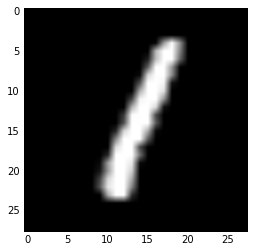

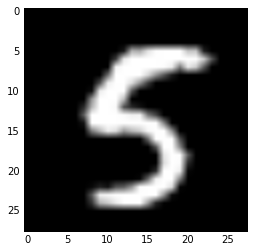

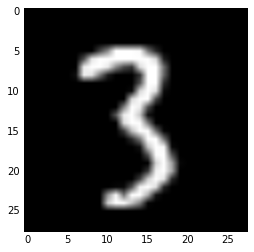

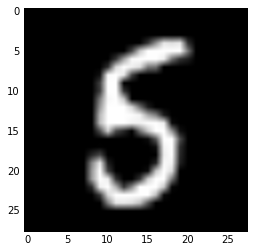

Iter: 63000
D loss: 0.09976
G_loss: 12.21
()


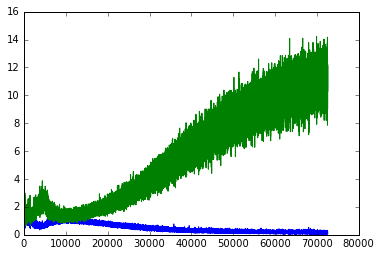

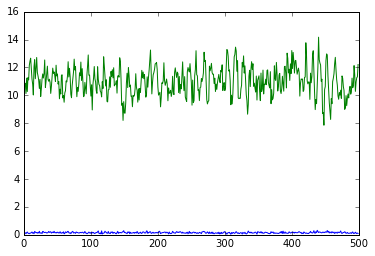

(128, 28, 28, 1)


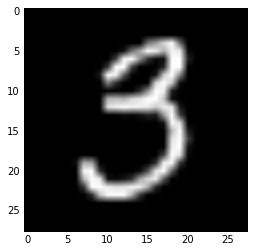

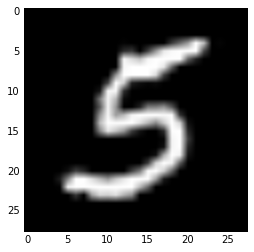

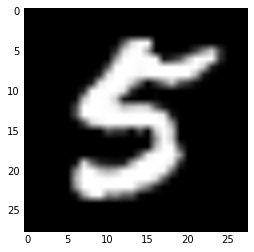

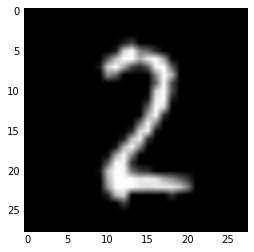

Iter: 64000
D loss: 0.1052
G_loss: 10.88
()


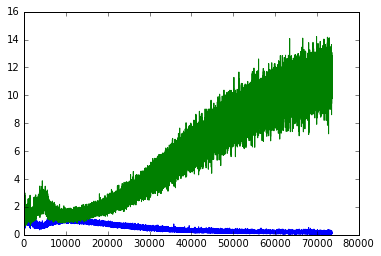

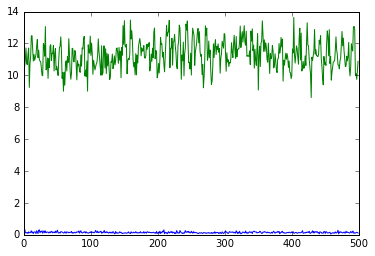

(128, 28, 28, 1)


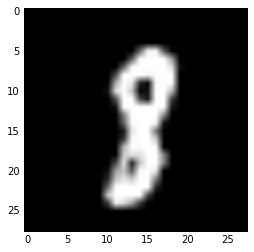

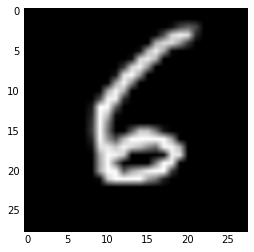

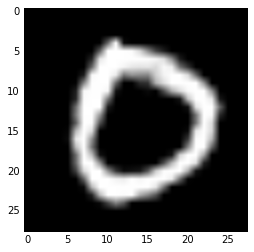

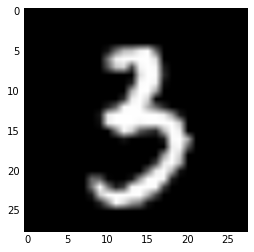

Iter: 65000
D loss: 0.121
G_loss: 12.88
()


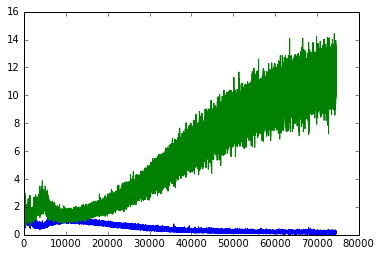

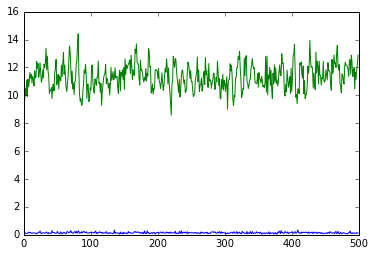

(128, 28, 28, 1)


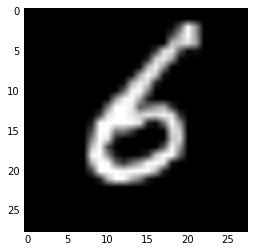

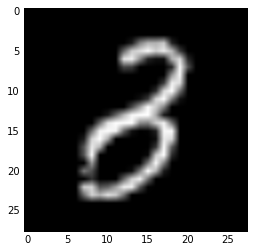

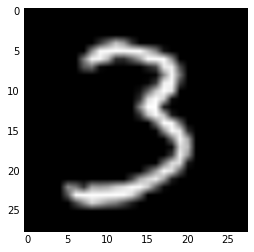

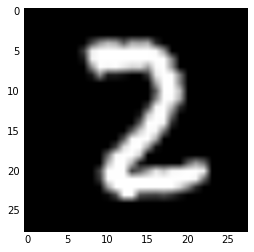

Iter: 66000
D loss: 0.1483
G_loss: 12.7
()


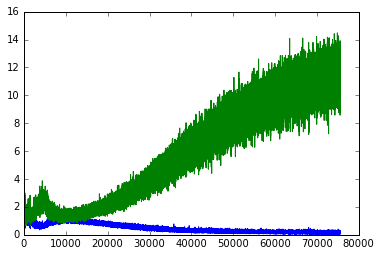

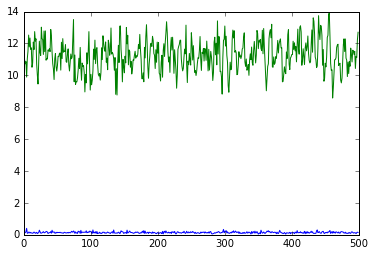

(128, 28, 28, 1)


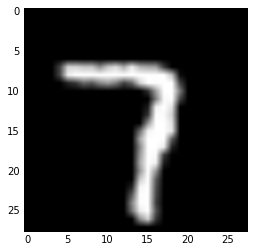

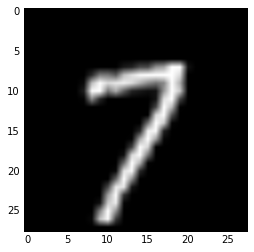

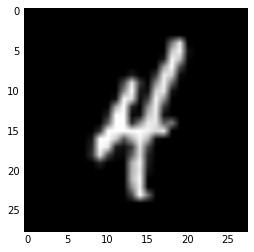

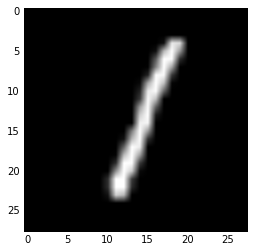

Iter: 67000
D loss: 0.1514
G_loss: 10.77
()


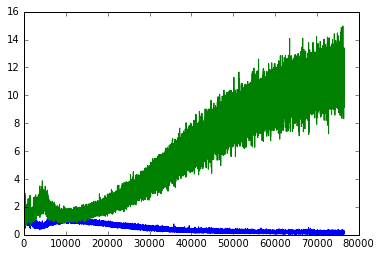

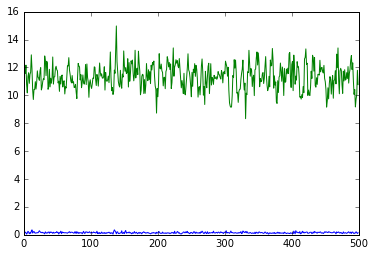

(128, 28, 28, 1)


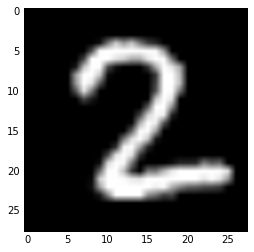

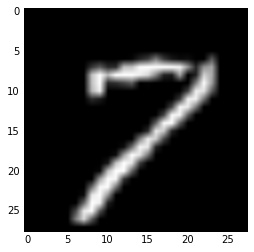

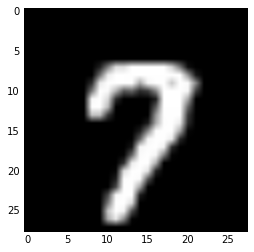

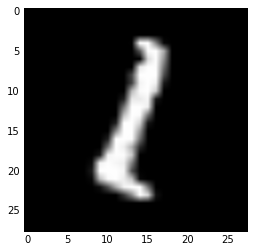

Iter: 68000
D loss: 0.09717
G_loss: 11.75
()


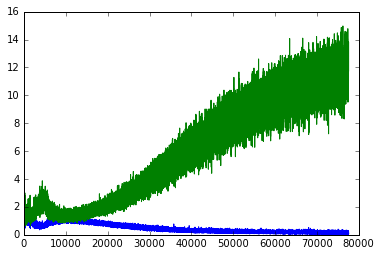

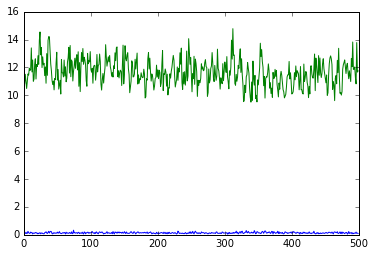

(128, 28, 28, 1)


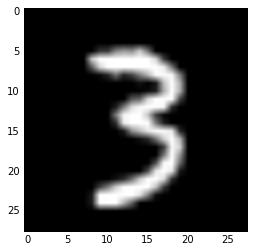

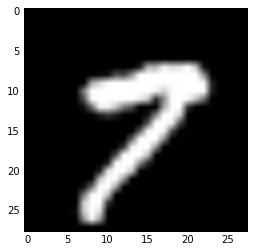

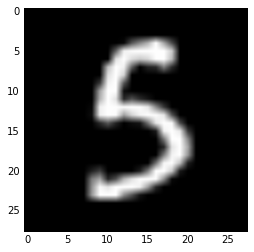

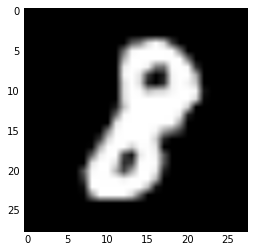

Iter: 69000
D loss: 0.09139
G_loss: 11.3
()


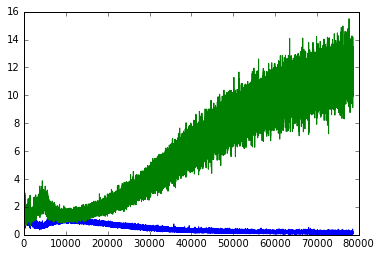

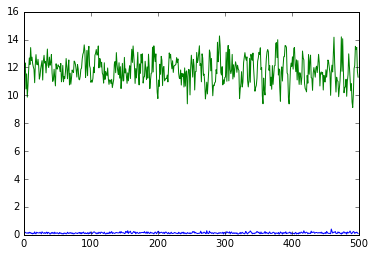

(128, 28, 28, 1)


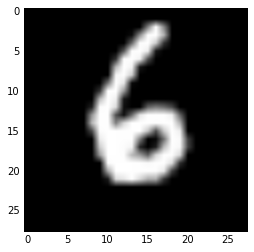

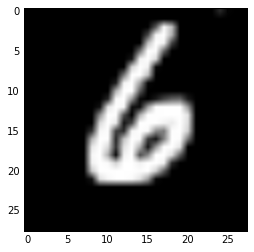

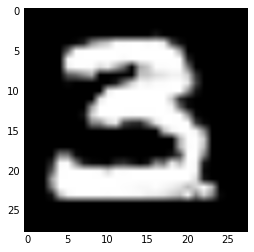

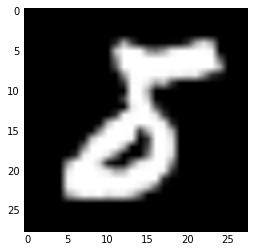

Iter: 70000
D loss: 0.1319
G_loss: 11.78
()


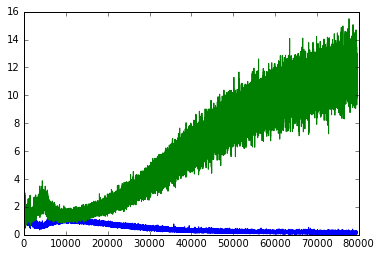

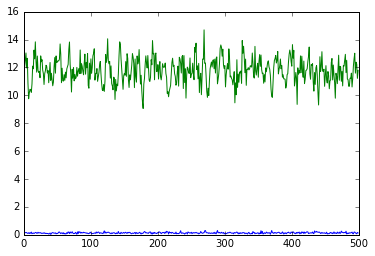

(128, 28, 28, 1)


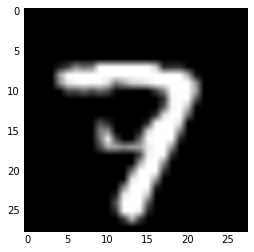

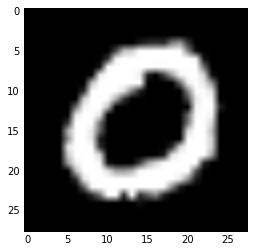

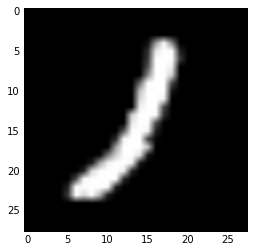

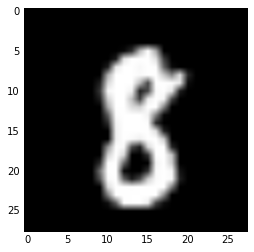

Iter: 71000
D loss: 0.1655
G_loss: 12.63
()


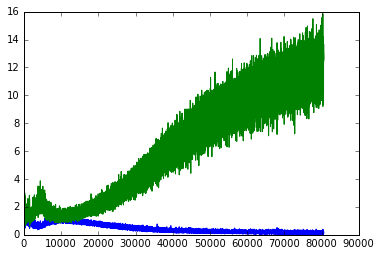

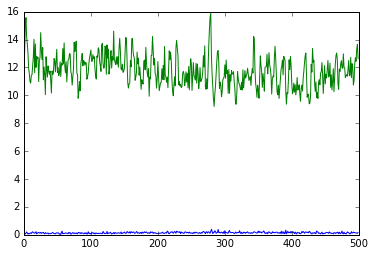

(128, 28, 28, 1)


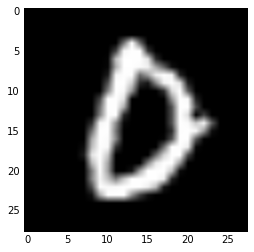

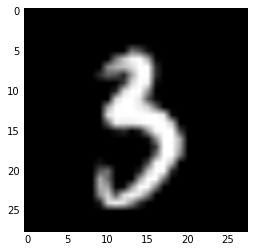

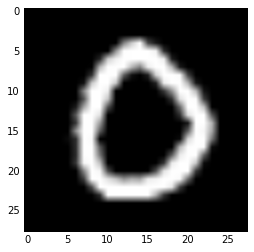

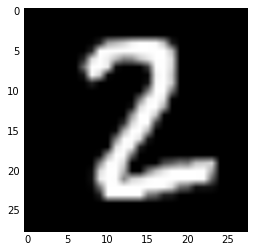

Iter: 72000
D loss: 0.1077
G_loss: 12.45
()


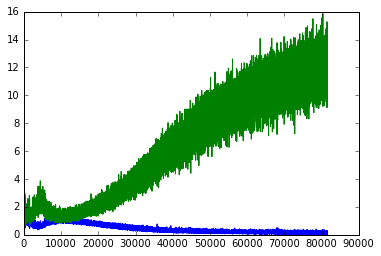

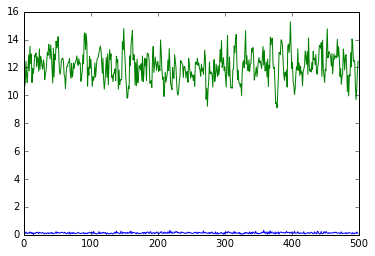

(128, 28, 28, 1)


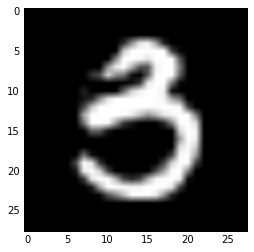

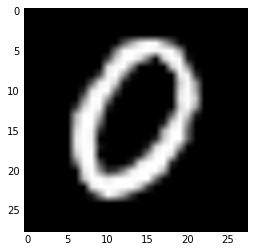

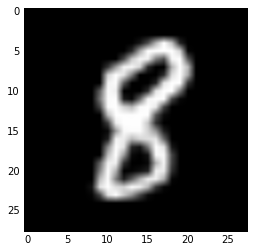

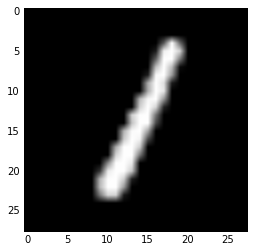

Iter: 73000
D loss: 0.08724
G_loss: 13.09
()


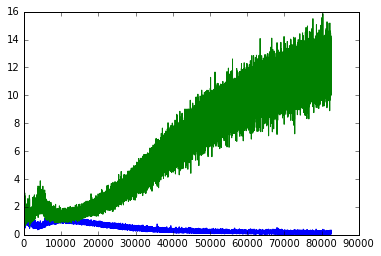

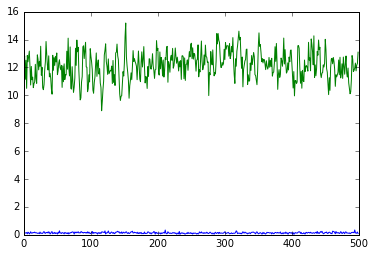

(128, 28, 28, 1)


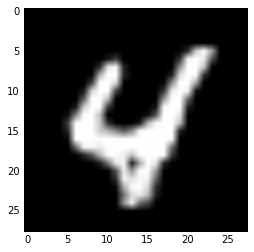

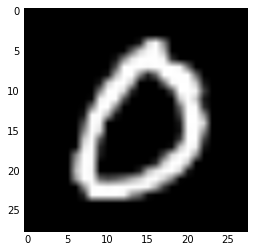

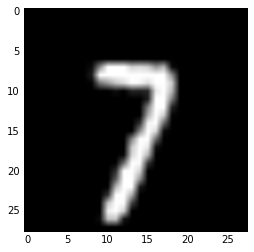

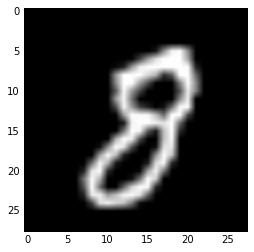

Iter: 74000
D loss: 0.2224
G_loss: 12.53
()


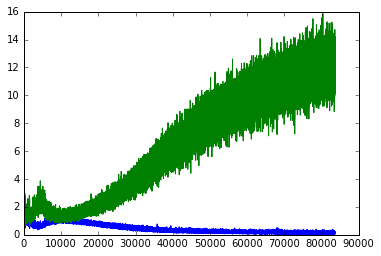

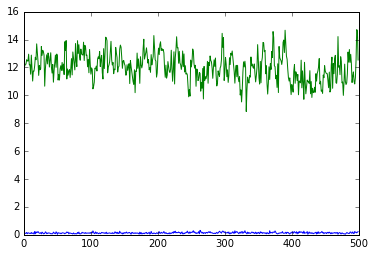

(128, 28, 28, 1)


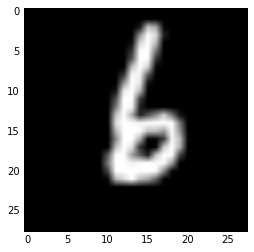

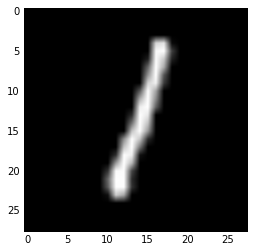

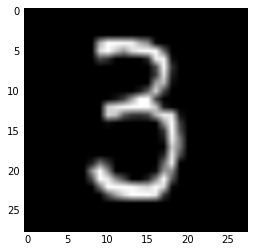

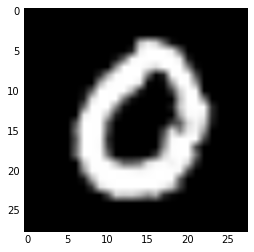

Iter: 75000
D loss: 0.06746
G_loss: 11.96
()


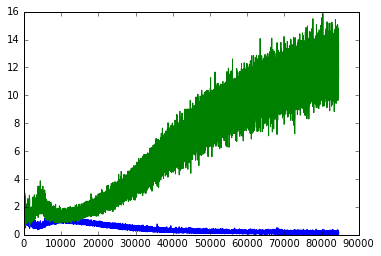

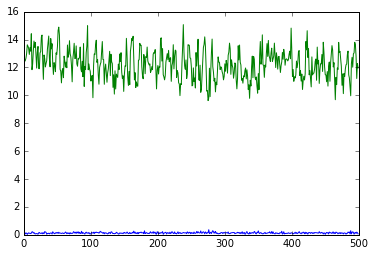

(128, 28, 28, 1)


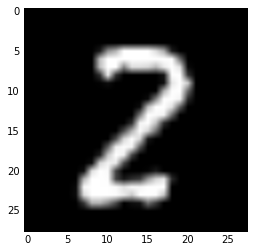

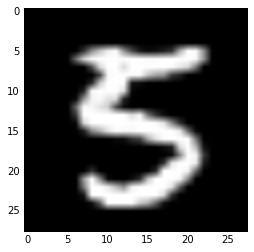

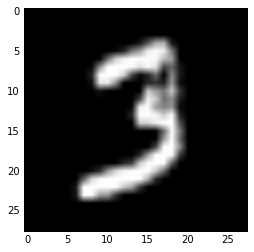

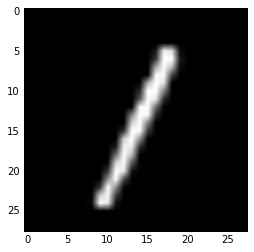

Iter: 76000
D loss: 0.2616
G_loss: 11.84
()


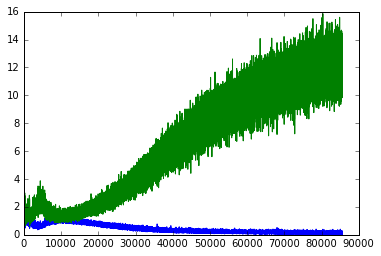

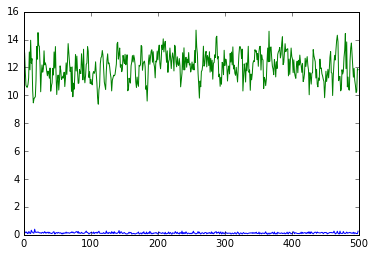

(128, 28, 28, 1)


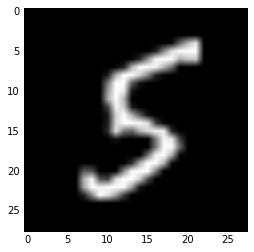

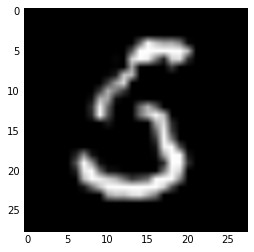

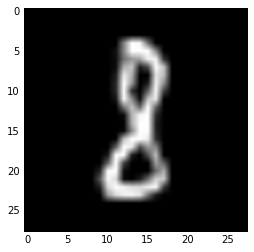

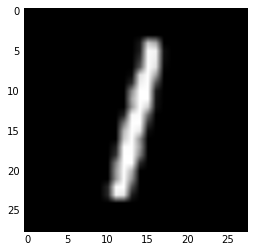

Iter: 77000
D loss: 0.05843
G_loss: 12.04
()


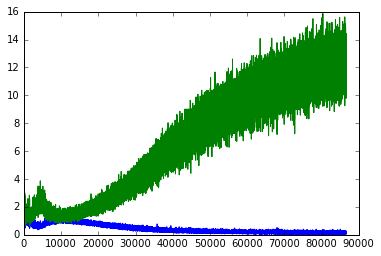

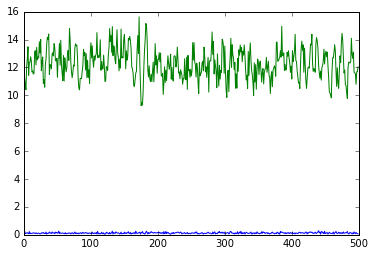

(128, 28, 28, 1)


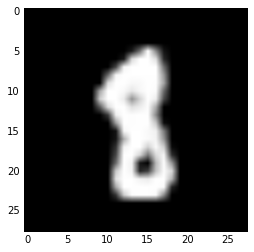

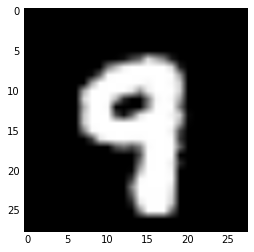

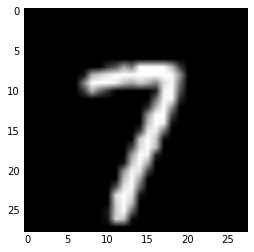

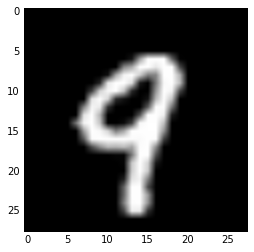

Iter: 78000
D loss: 0.163
G_loss: 11.3
()


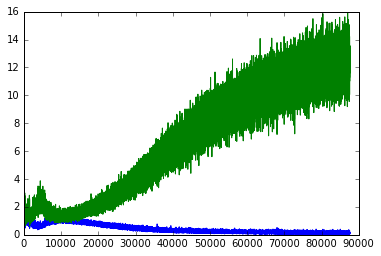

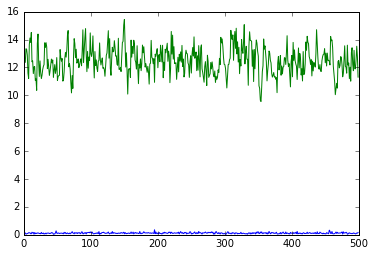

(128, 28, 28, 1)


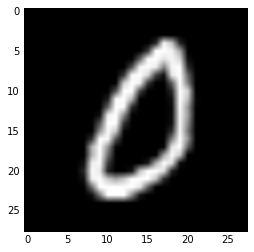

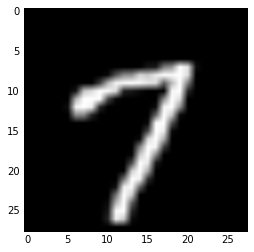

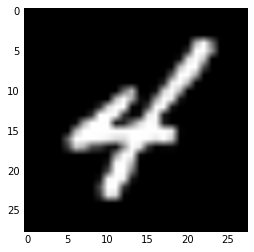

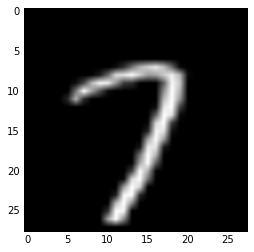

Iter: 79000
D loss: 0.1683
G_loss: 13.69
()


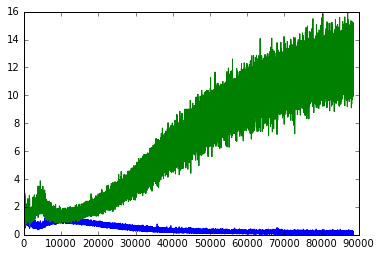

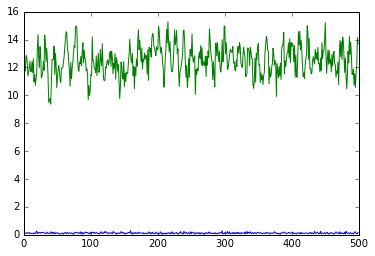

(128, 28, 28, 1)


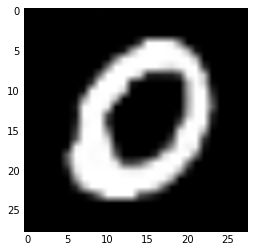

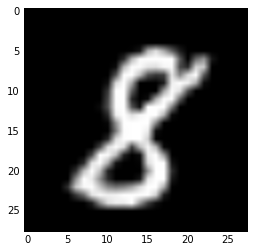

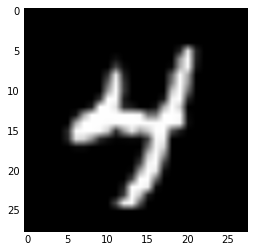

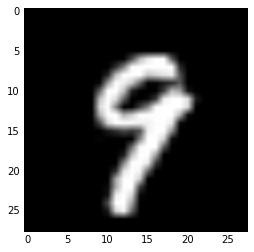

Iter: 80000
D loss: 0.08851
G_loss: 13.31
()


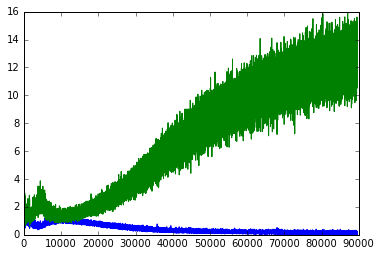

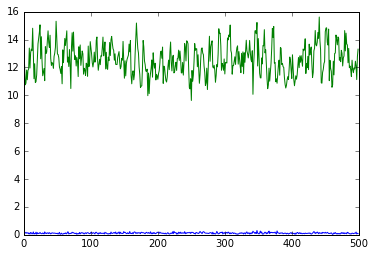

(128, 28, 28, 1)


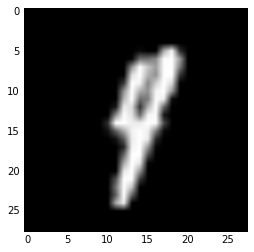

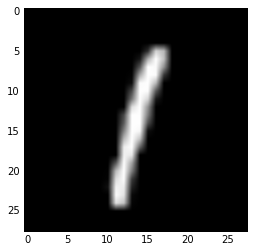

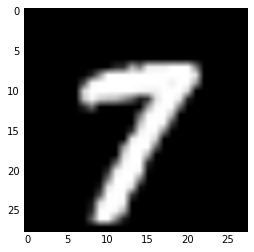

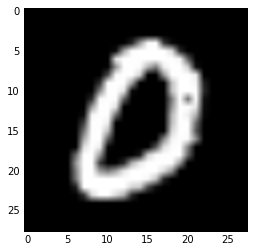

Iter: 81000
D loss: 0.1305
G_loss: 11.64
()


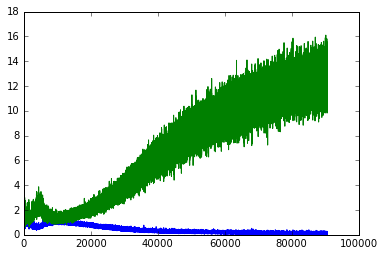

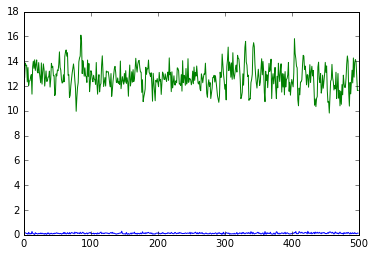

(128, 28, 28, 1)


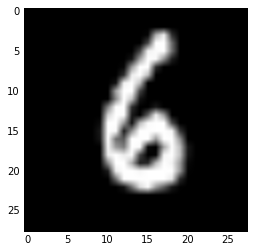

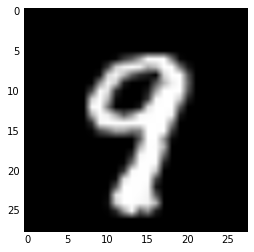

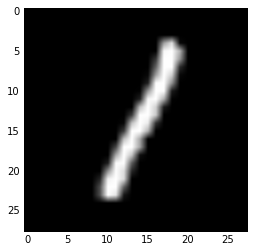

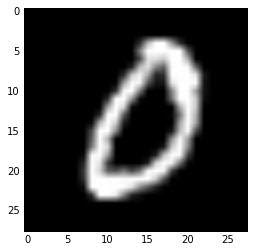

Iter: 82000
D loss: 0.04603
G_loss: 13.03
()


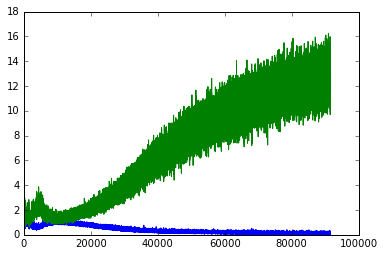

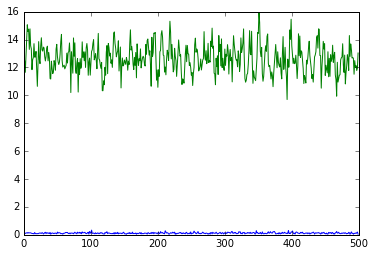

(128, 28, 28, 1)


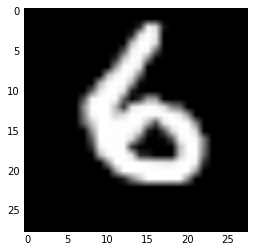

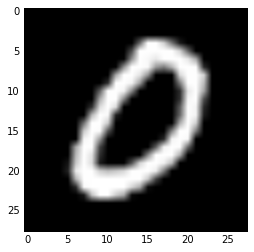

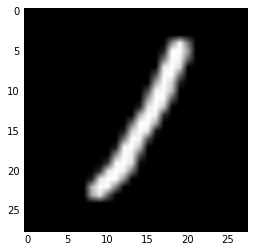

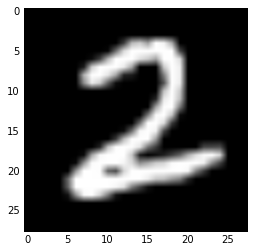

Iter: 83000
D loss: 0.06699
G_loss: 11.68
()


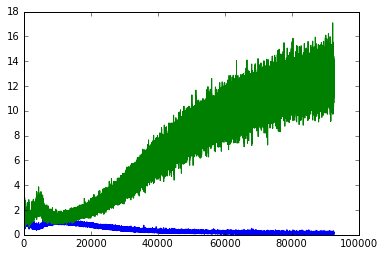

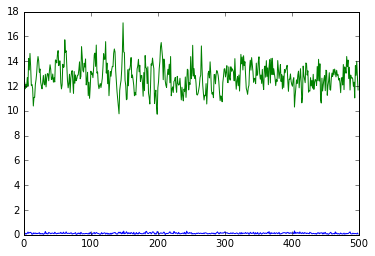

(128, 28, 28, 1)


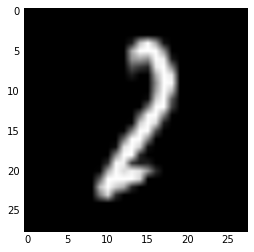

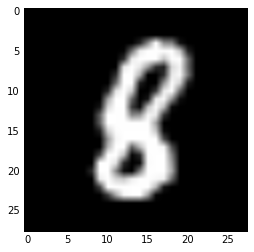

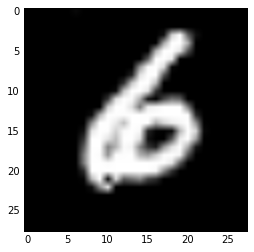

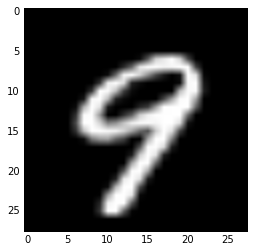

Iter: 84000
D loss: 0.1187
G_loss: 15.68
()


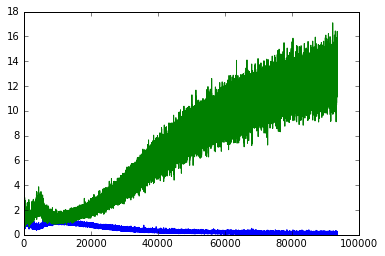

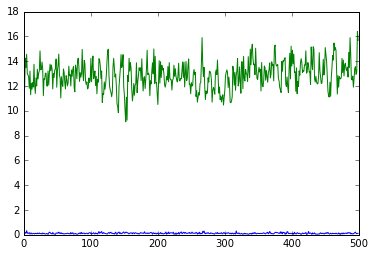

(128, 28, 28, 1)


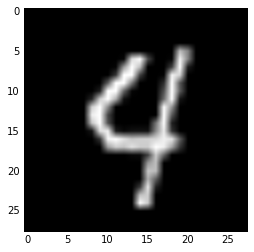

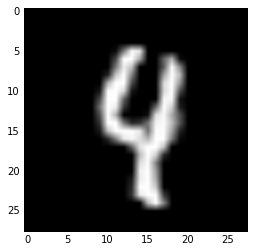

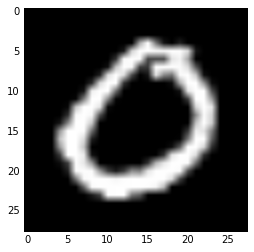

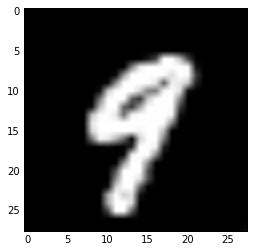

Iter: 85000
D loss: 0.104
G_loss: 13.38
()


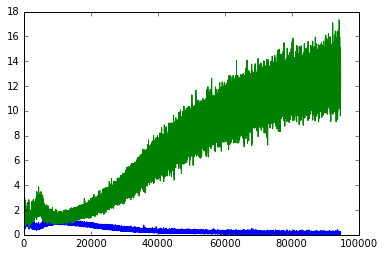

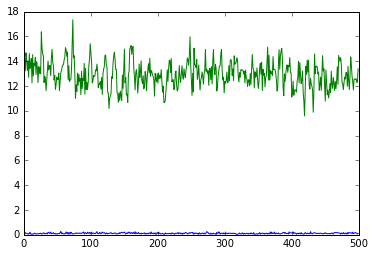

(128, 28, 28, 1)


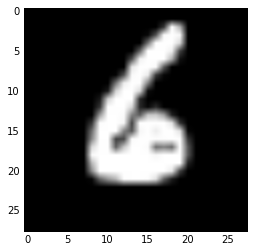

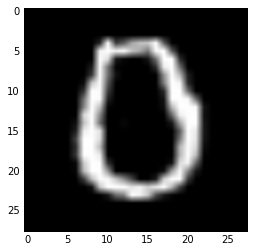

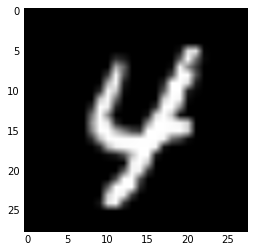

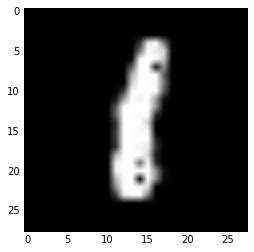

Iter: 86000
D loss: 0.07725
G_loss: 12.52
()


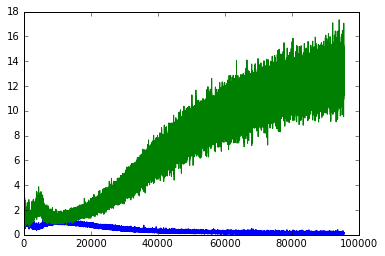

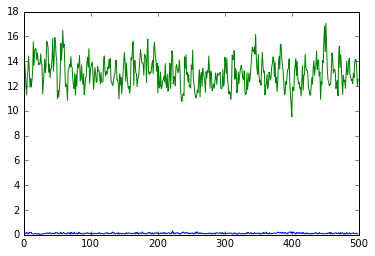

(128, 28, 28, 1)


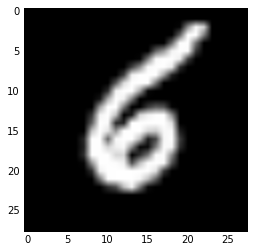

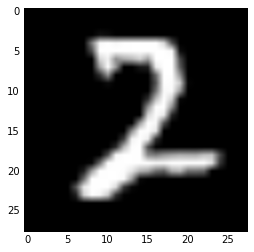

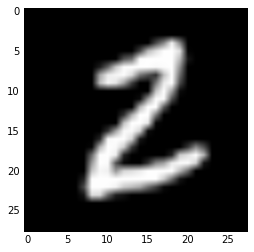

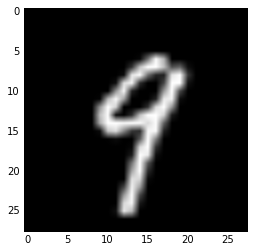

Iter: 87000
D loss: 0.1958
G_loss: 12.71
()


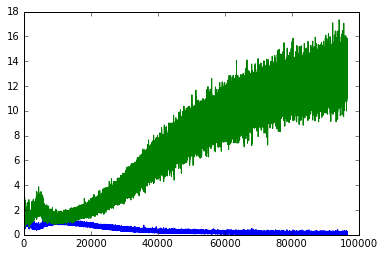

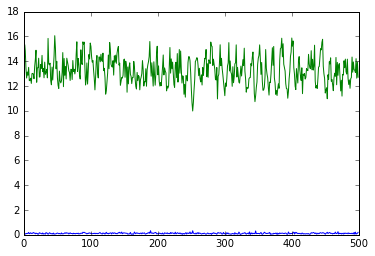

(128, 28, 28, 1)


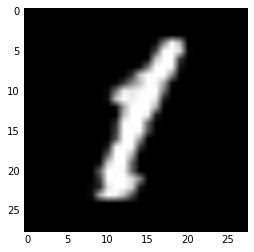

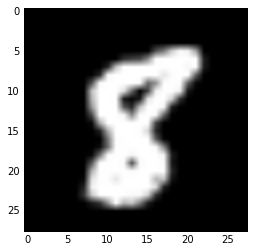

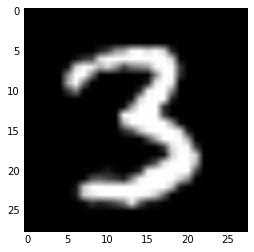

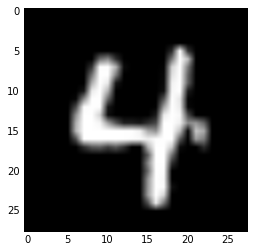

Iter: 88000
D loss: 0.1016
G_loss: 13.58
()


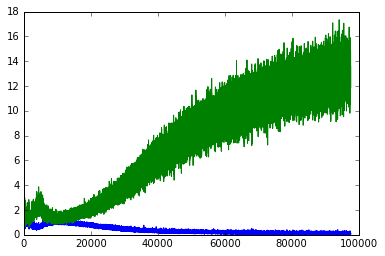

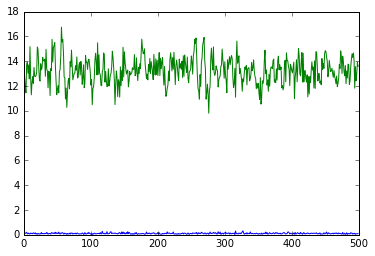

(128, 28, 28, 1)


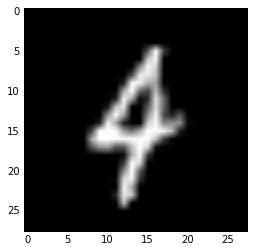

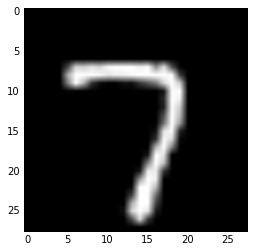

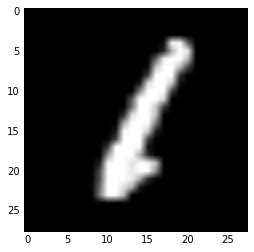

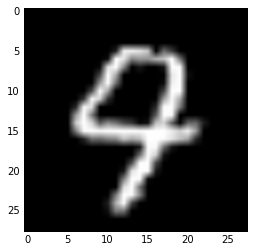

Iter: 89000
D loss: 0.05864
G_loss: 12.91
()


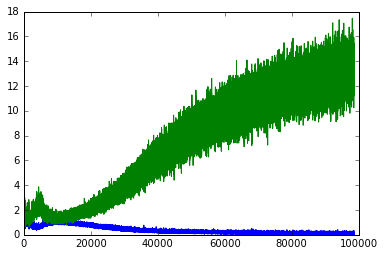

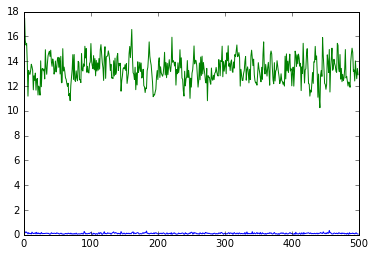

(128, 28, 28, 1)


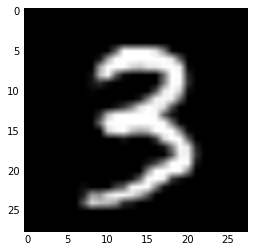

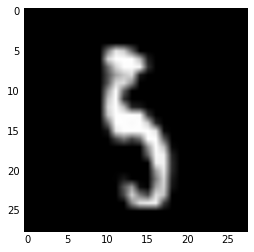

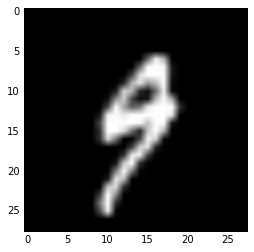

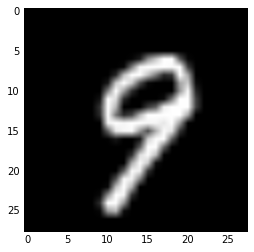

Iter: 90000
D loss: 0.0752
G_loss: 13.14
()


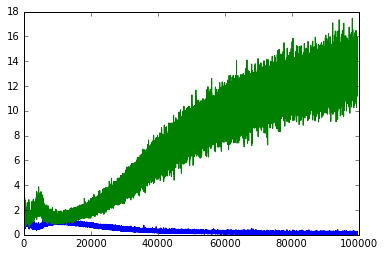

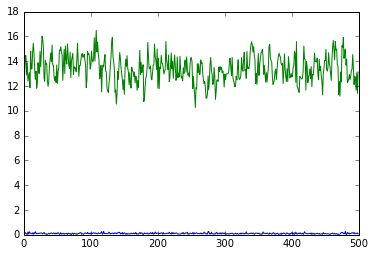

(128, 28, 28, 1)


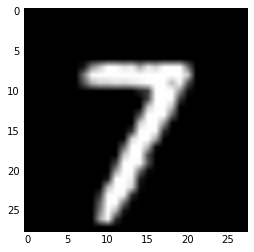

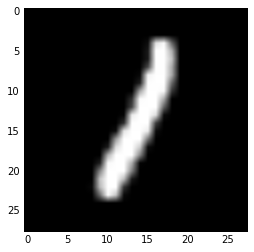

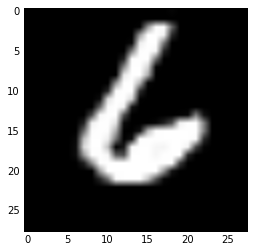

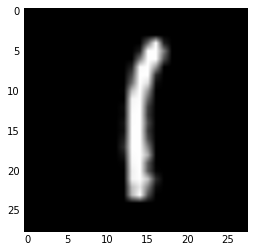

Iter: 91000
D loss: 0.06598
G_loss: 13.95
()


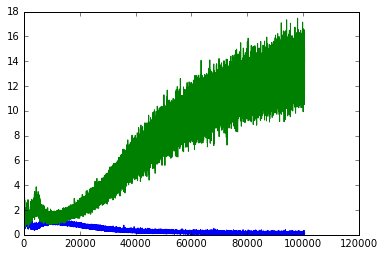

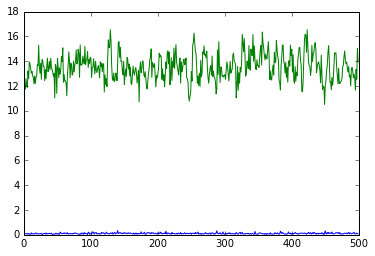

(128, 28, 28, 1)


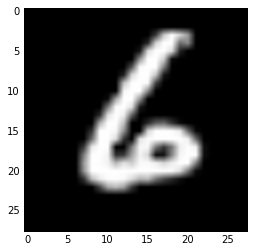

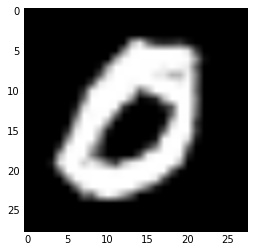

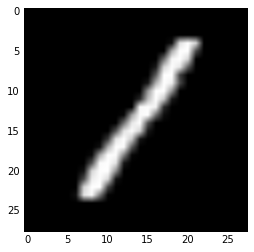

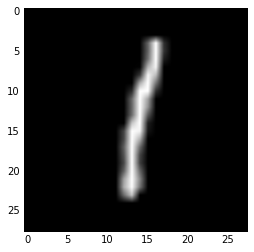

Iter: 92000
D loss: 0.07039
G_loss: 13.21
()


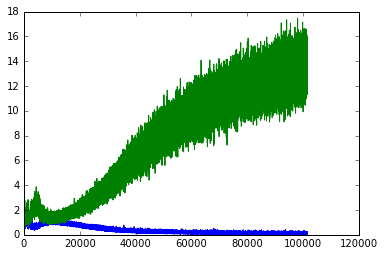

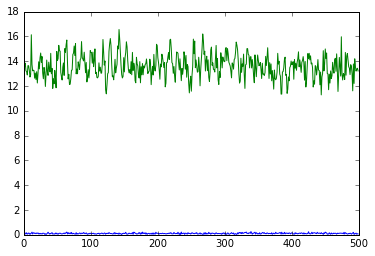

(128, 28, 28, 1)


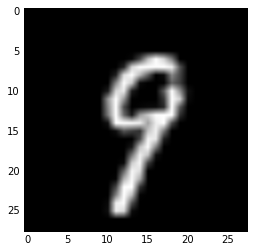

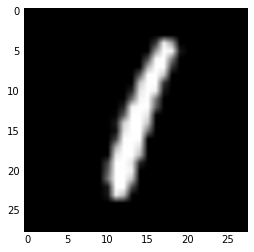

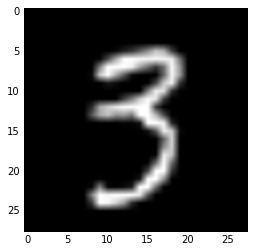

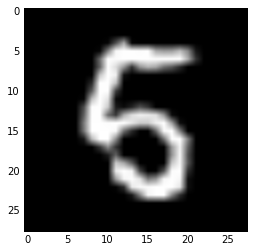

Iter: 93000
D loss: 0.1893
G_loss: 15.0
()


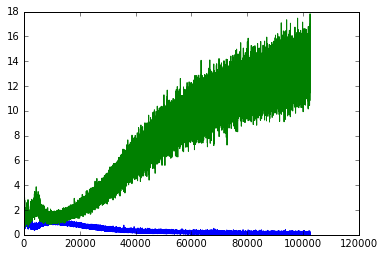

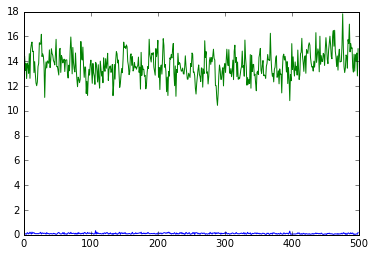

(128, 28, 28, 1)


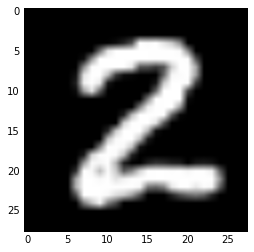

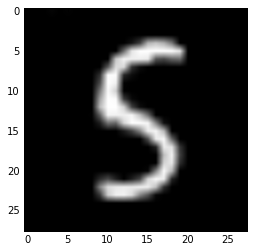

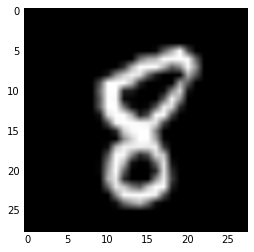

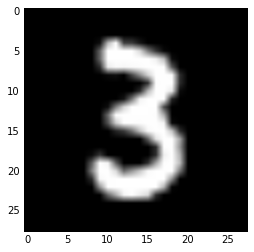

Iter: 94000
D loss: 0.09179
G_loss: 15.5
()


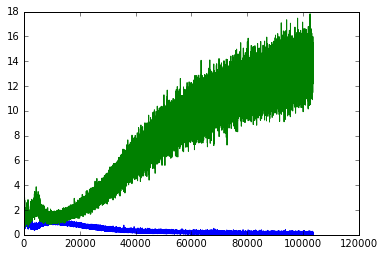

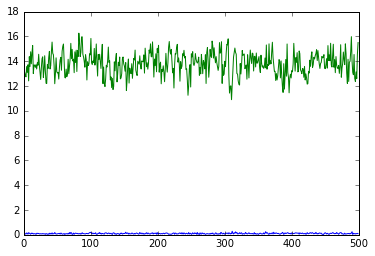

(128, 28, 28, 1)


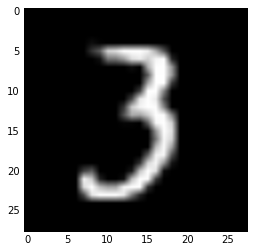

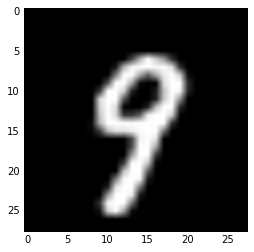

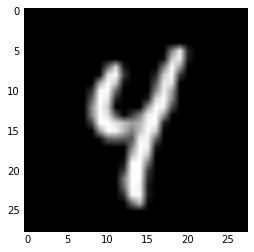

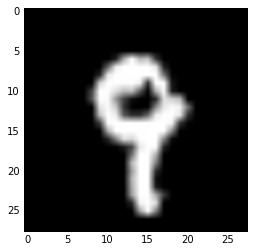

Iter: 95000
D loss: 0.07827
G_loss: 15.08
()


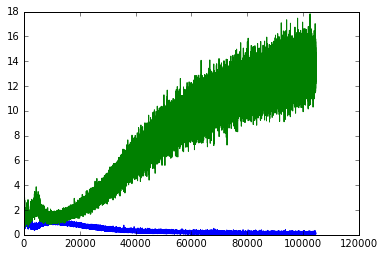

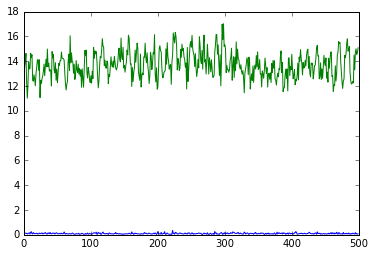

(128, 28, 28, 1)


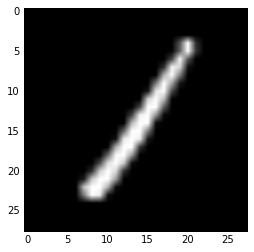

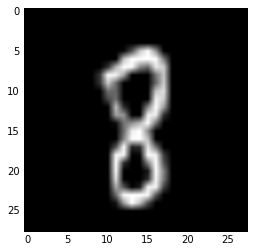

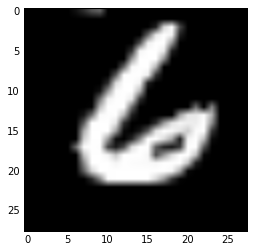

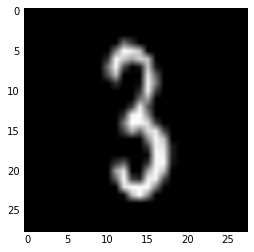

Iter: 96000
D loss: 0.1014
G_loss: 14.01
()


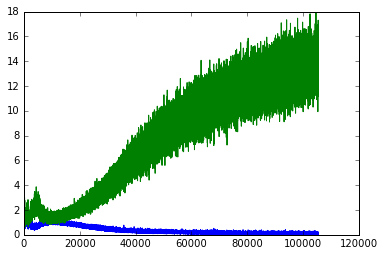

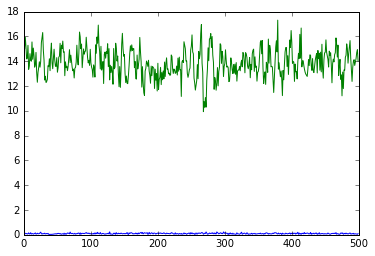

(128, 28, 28, 1)


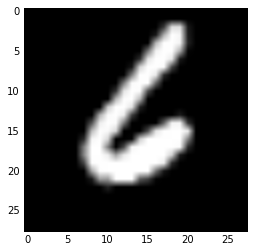

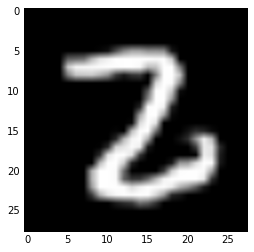

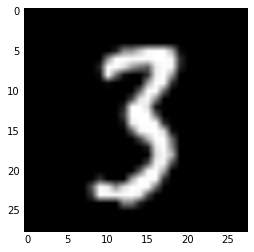

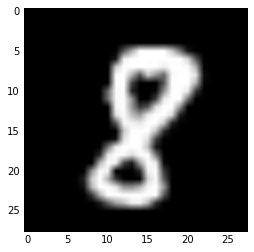

Iter: 97000
D loss: 0.0844
G_loss: 14.57
()


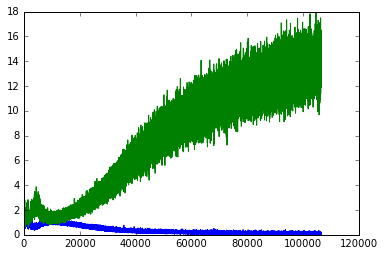

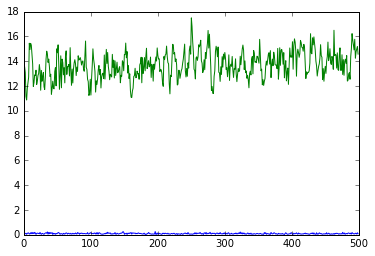

(128, 28, 28, 1)


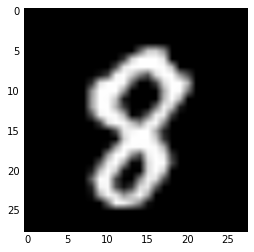

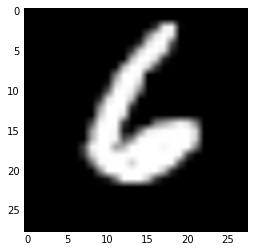

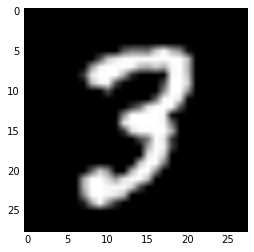

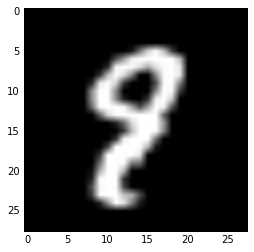

Iter: 98000
D loss: 0.2441
G_loss: 13.9
()


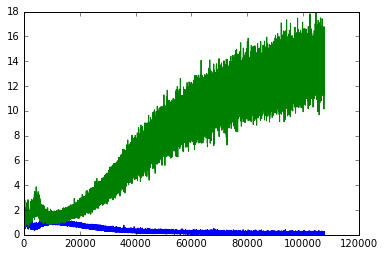

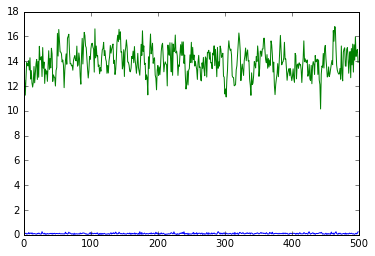

(128, 28, 28, 1)


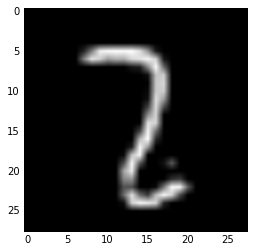

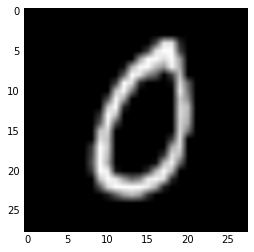

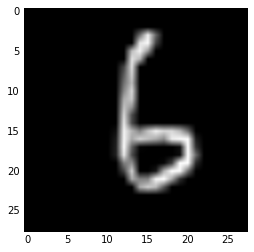

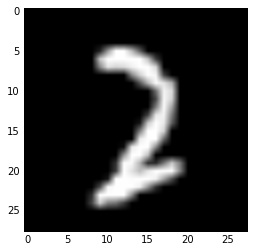

Iter: 99000
D loss: 0.08426
G_loss: 14.45
()


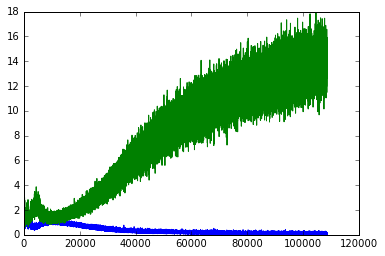

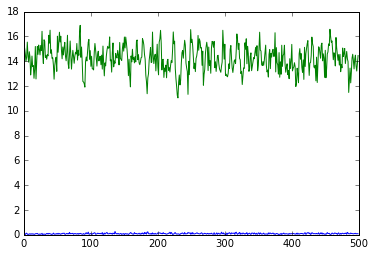

(128, 28, 28, 1)


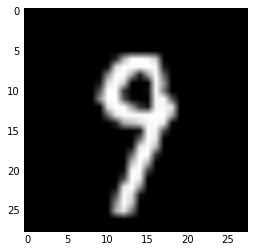

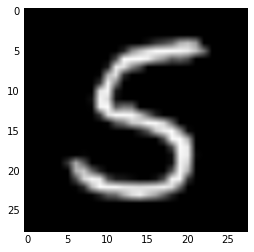

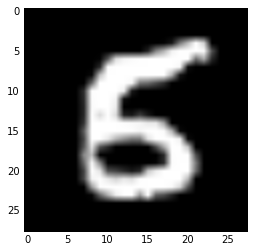

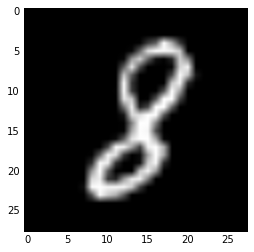

Iter: 100000
D loss: 0.1466
G_loss: 13.02
()


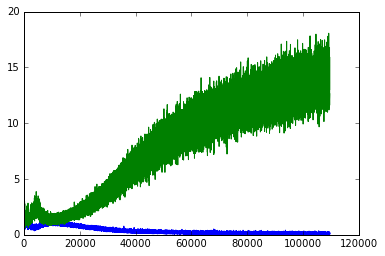

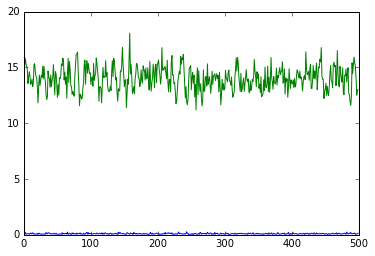

(128, 28, 28, 1)


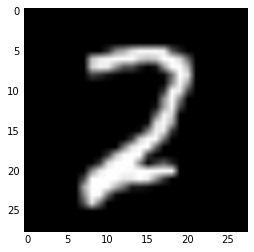

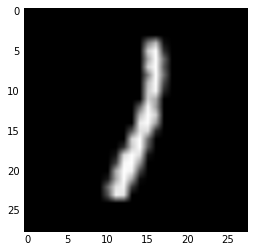

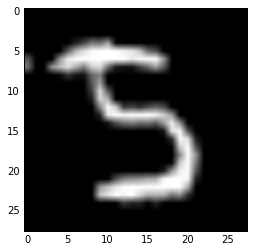

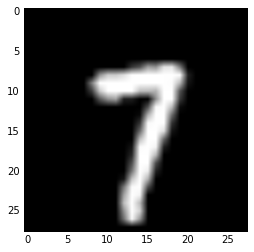

Iter: 101000
D loss: 0.08698
G_loss: 14.17
()


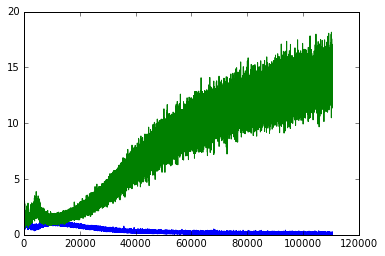

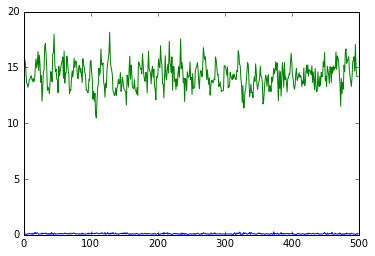

(128, 28, 28, 1)


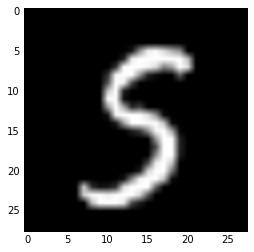

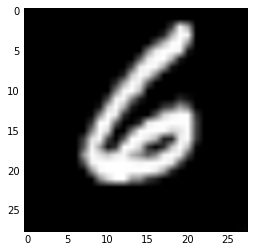

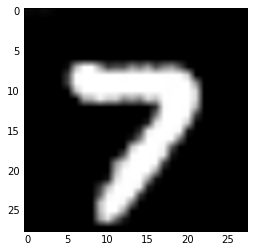

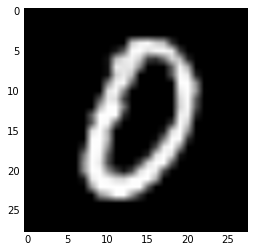

Iter: 102000
D loss: 0.1053
G_loss: 15.27
()


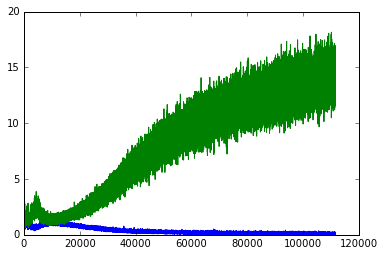

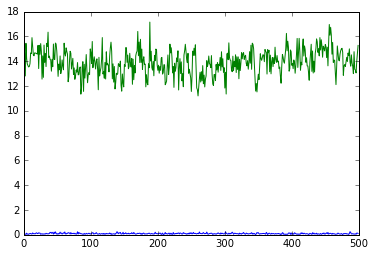

(128, 28, 28, 1)


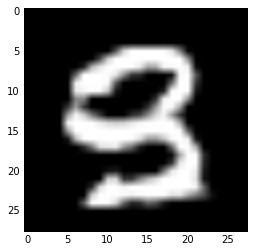

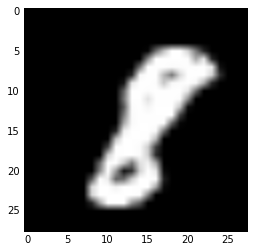

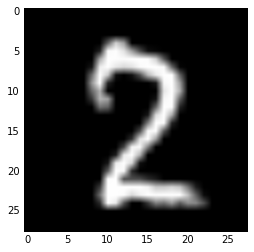

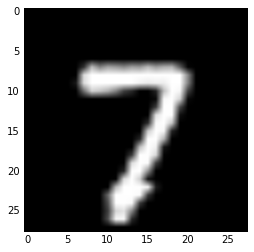

Iter: 103000
D loss: 0.09593
G_loss: 14.5
()


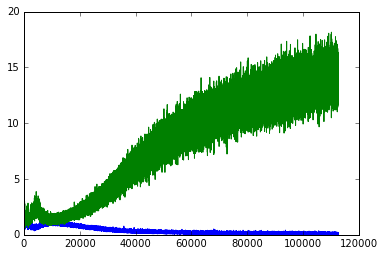

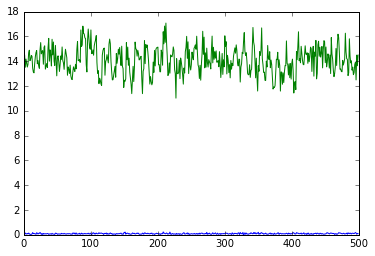

(128, 28, 28, 1)


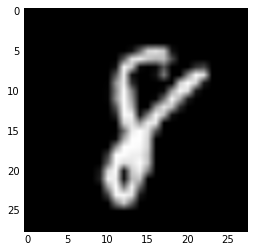

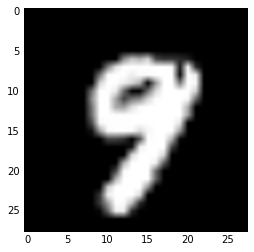

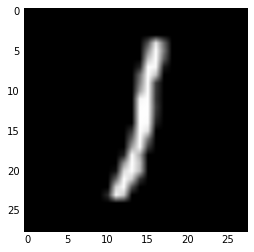

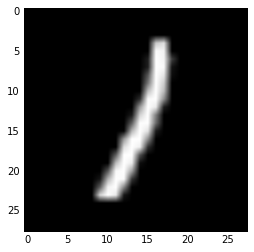

Iter: 104000
D loss: 0.05928
G_loss: 14.39
()


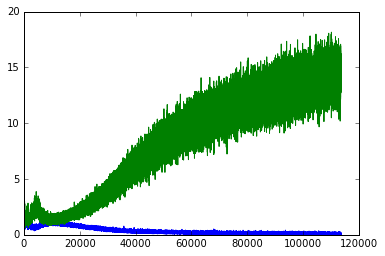

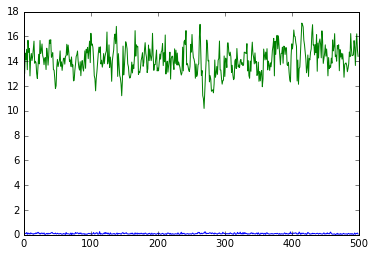

(128, 28, 28, 1)


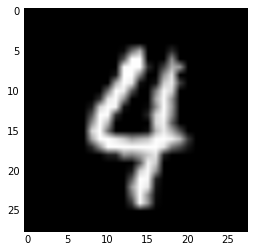

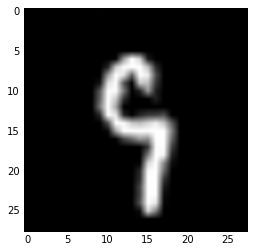

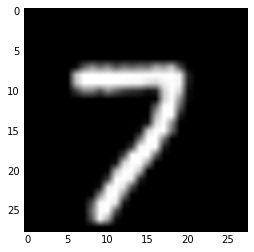

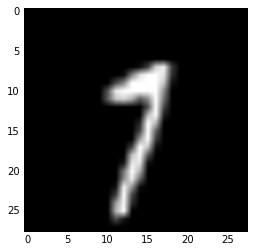

Iter: 105000
D loss: 0.04001
G_loss: 16.32
()


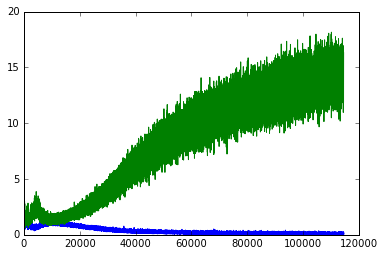

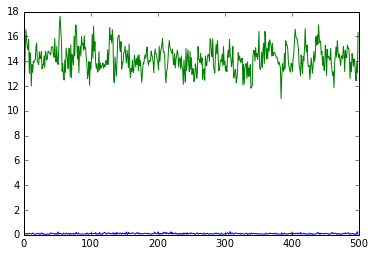

(128, 28, 28, 1)


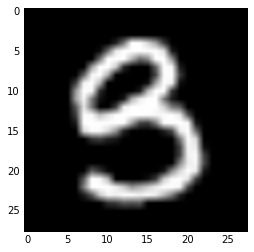

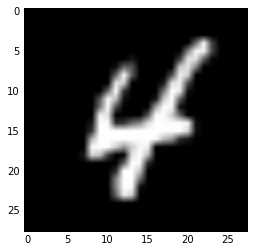

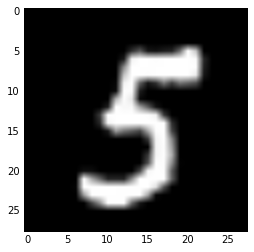

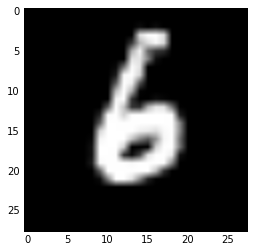

Iter: 106000
D loss: 0.1468
G_loss: 15.16
()


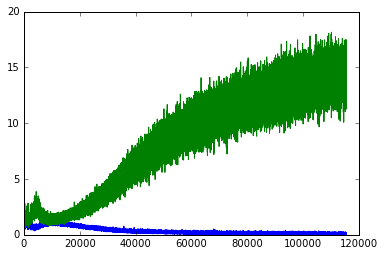

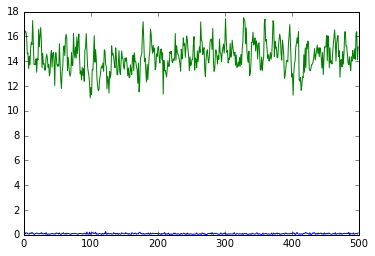

(128, 28, 28, 1)


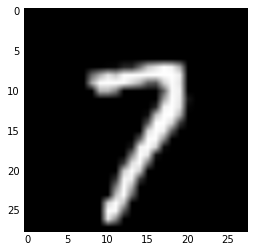

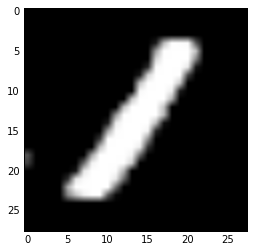

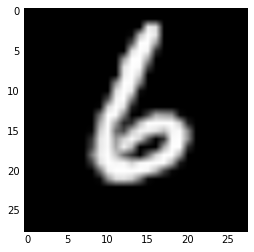

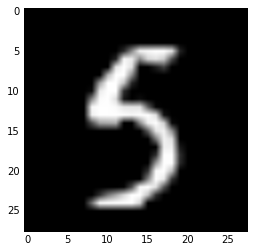

Iter: 107000
D loss: 0.05336
G_loss: 13.83
()


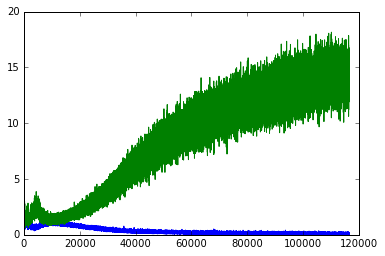

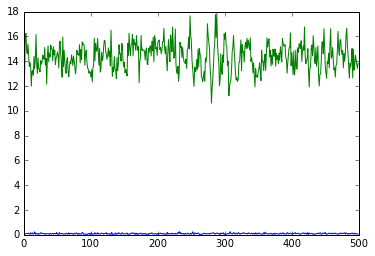

(128, 28, 28, 1)


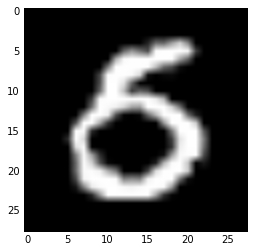

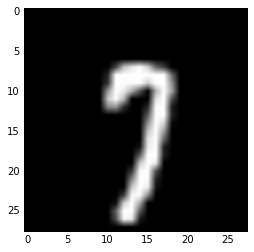

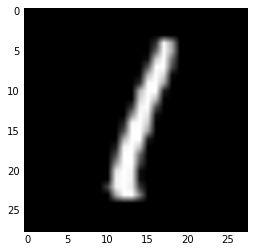

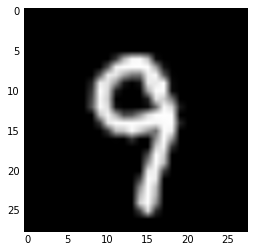

Iter: 108000
D loss: 0.1547
G_loss: 15.62
()


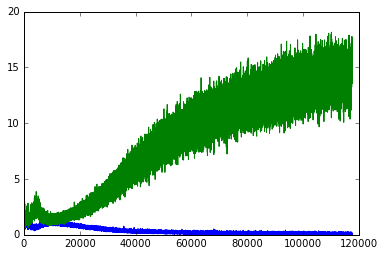

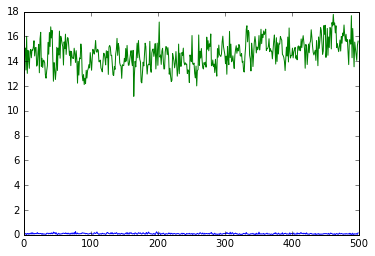

(128, 28, 28, 1)


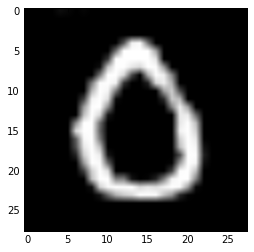

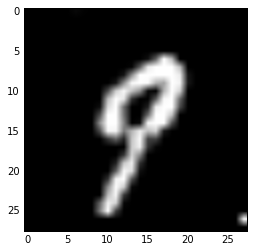

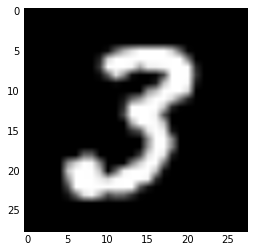

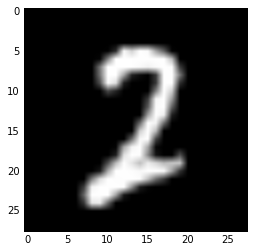

Iter: 109000
D loss: 0.08787
G_loss: 15.08
()


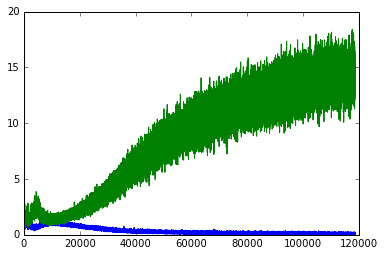

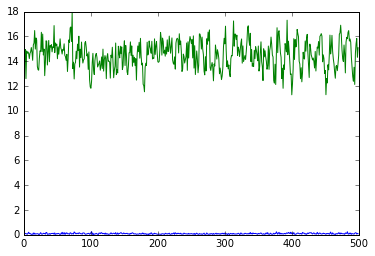

(128, 28, 28, 1)


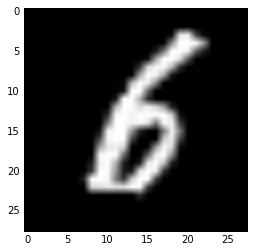

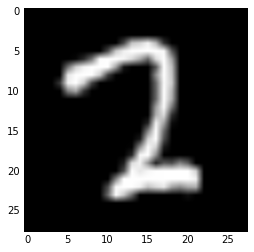

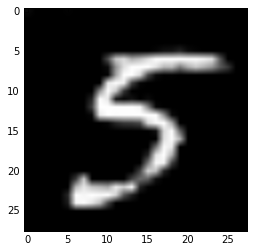

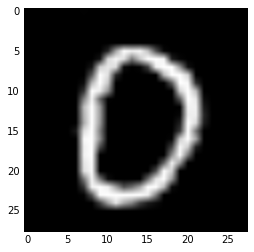

Iter: 110000
D loss: 0.05952
G_loss: 15.22
()


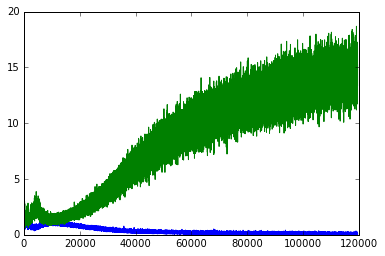

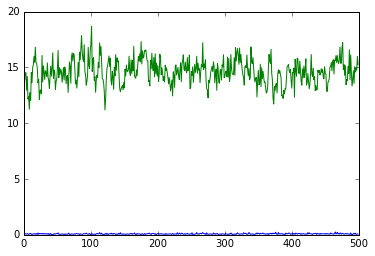

(128, 28, 28, 1)


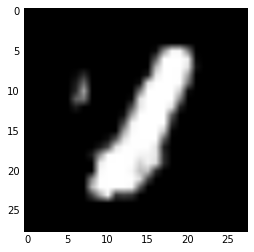

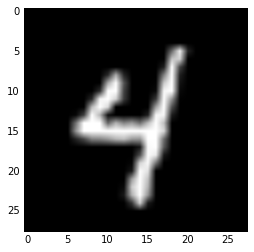

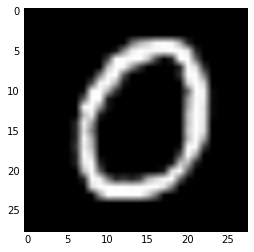

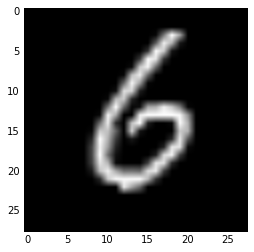

Iter: 111000
D loss: 0.08661
G_loss: 17.63
()


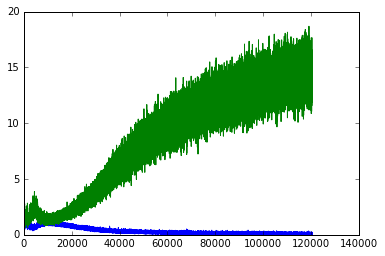

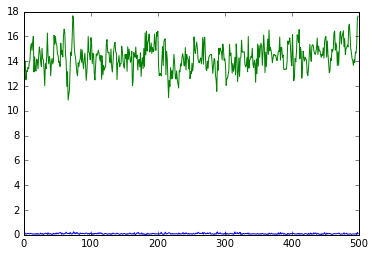

(128, 28, 28, 1)


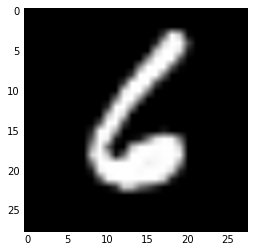

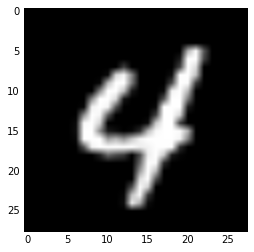

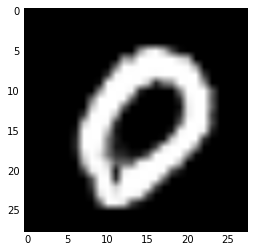

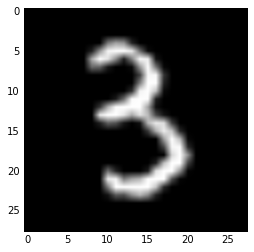

Iter: 112000
D loss: 0.1527
G_loss: 14.65
()


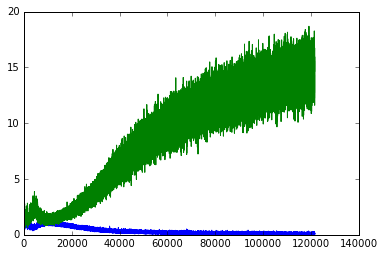

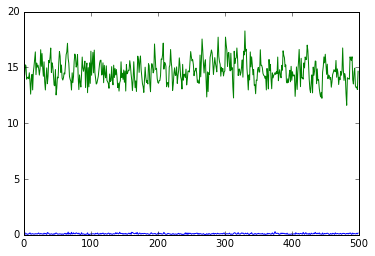

(128, 28, 28, 1)


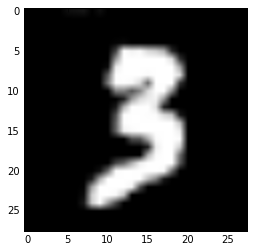

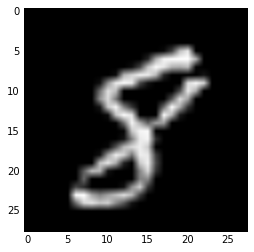

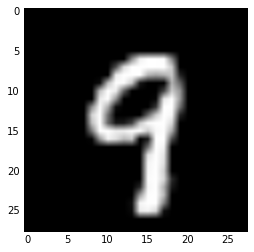

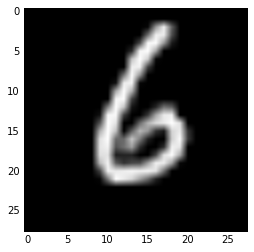

Iter: 113000
D loss: 0.127
G_loss: 12.79
()


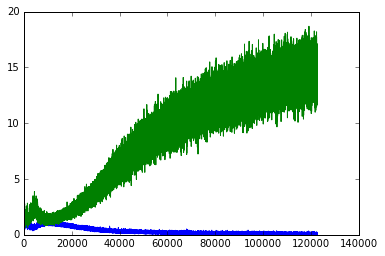

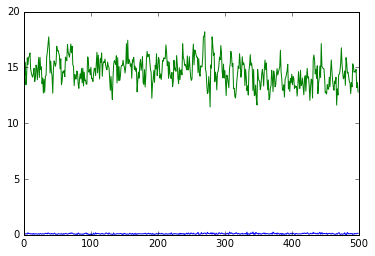

(128, 28, 28, 1)


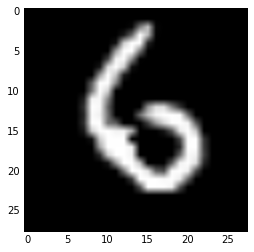

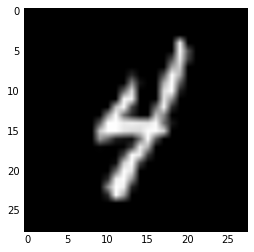

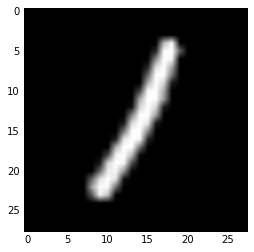

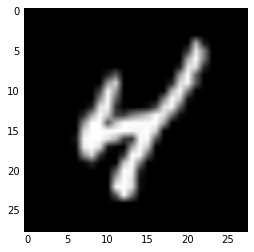

Iter: 114000
D loss: 0.06068
G_loss: 15.75
()


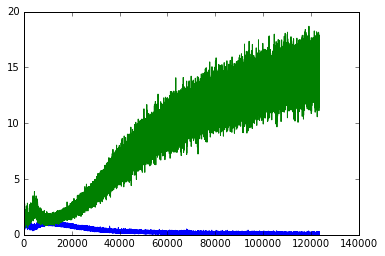

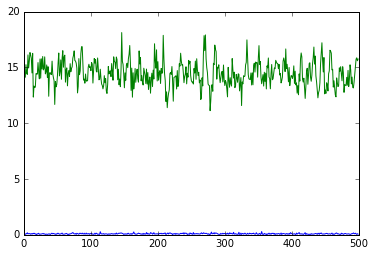

(128, 28, 28, 1)


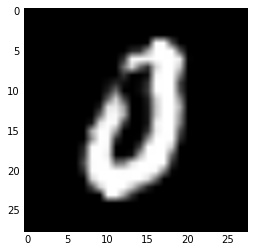

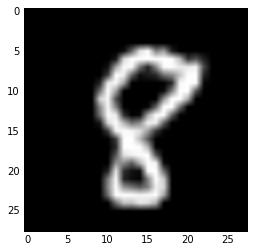

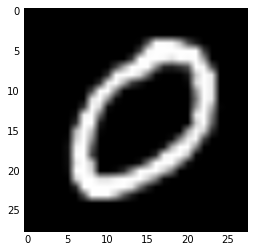

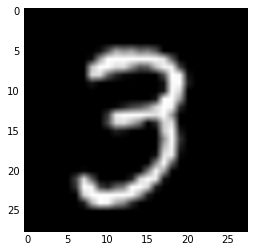

Iter: 115000
D loss: 0.04649
G_loss: 15.13
()


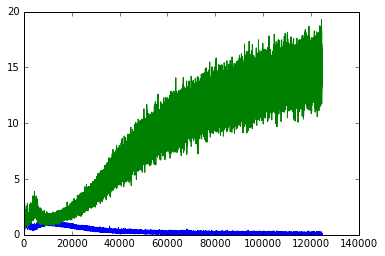

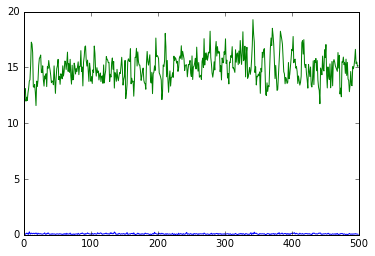

(128, 28, 28, 1)


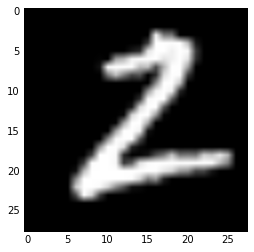

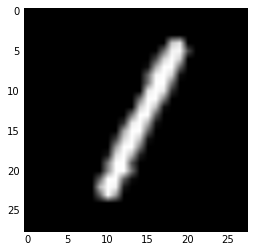

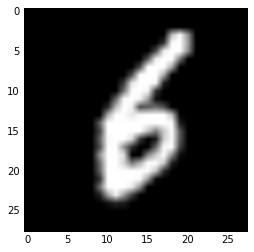

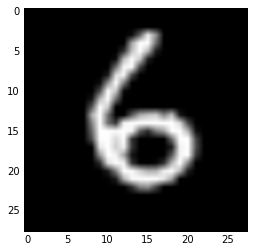

Iter: 116000
D loss: 0.07396
G_loss: 15.95
()


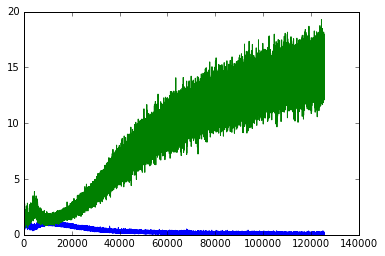

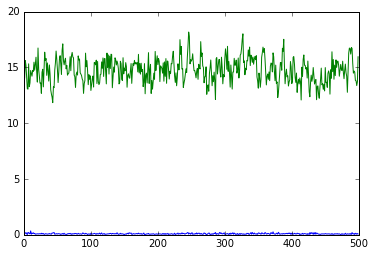

(128, 28, 28, 1)


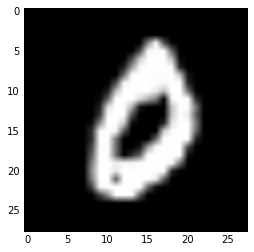

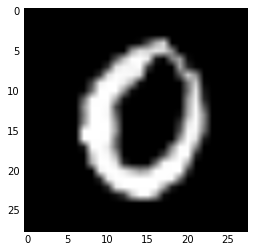

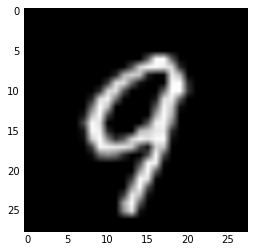

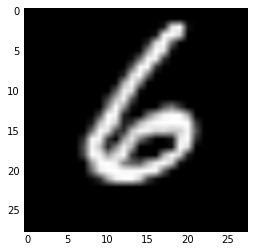

Iter: 117000
D loss: 0.1211
G_loss: 15.11
()


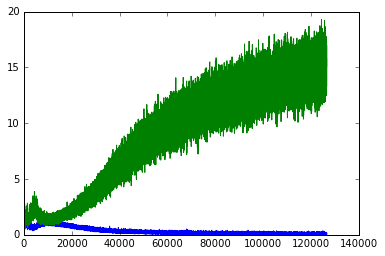

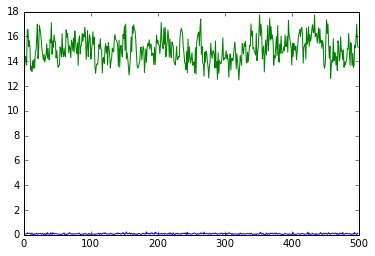

(128, 28, 28, 1)


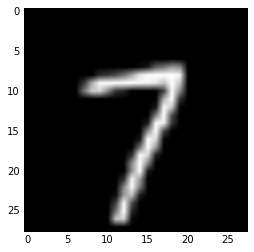

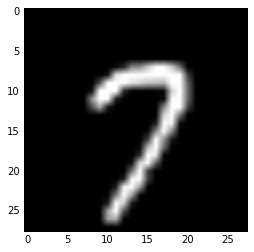

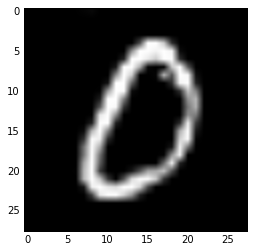

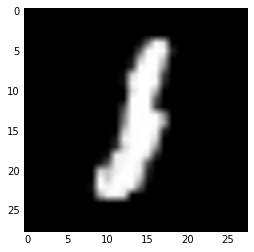

Iter: 118000
D loss: 0.07695
G_loss: 15.46
()


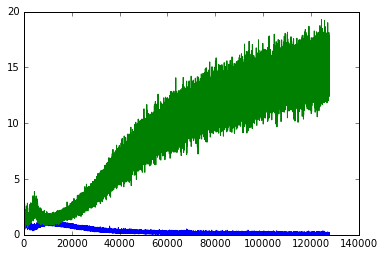

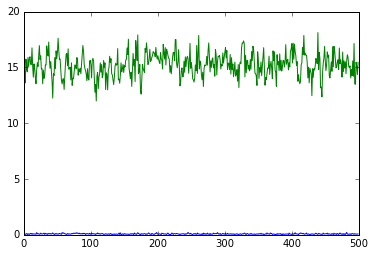

(128, 28, 28, 1)


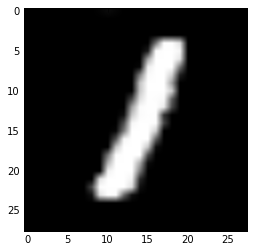

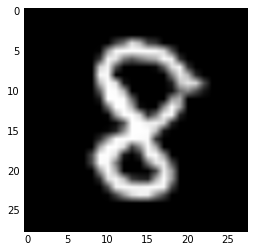

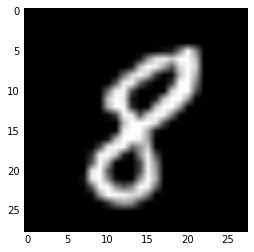

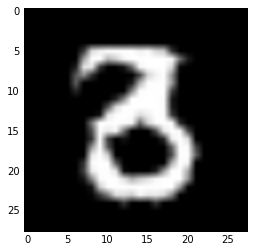

Iter: 119000
D loss: 0.02664
G_loss: 14.52
()


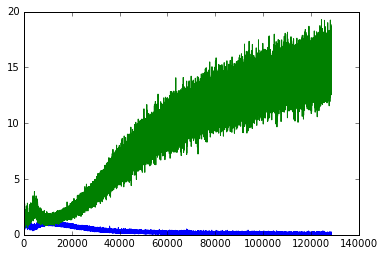

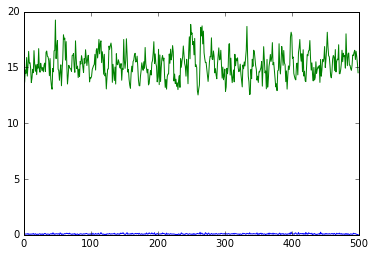

(128, 28, 28, 1)


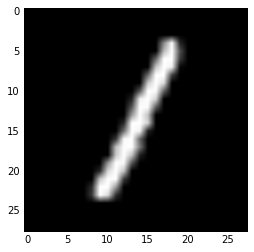

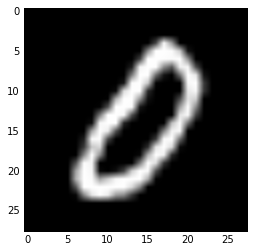

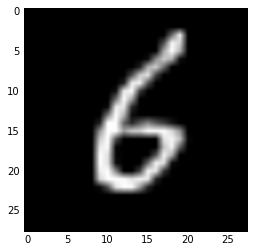

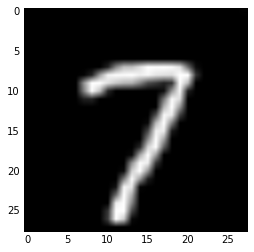

Iter: 120000
D loss: 0.0687
G_loss: 15.05
()


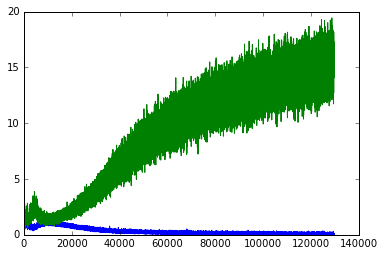

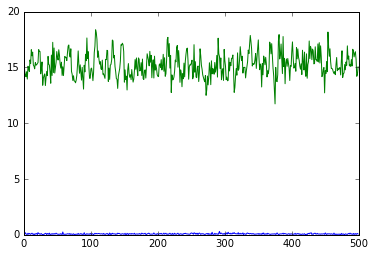

(128, 28, 28, 1)


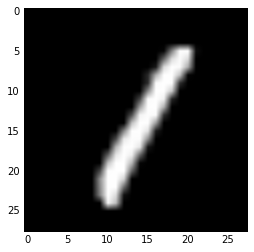

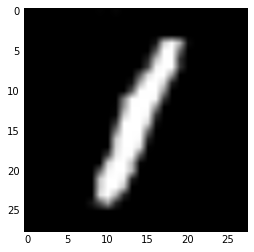

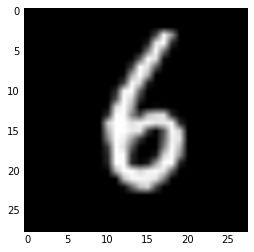

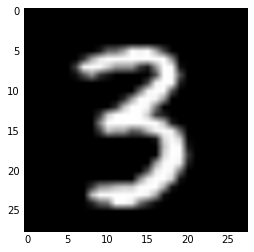

Iter: 121000
D loss: 0.1456
G_loss: 12.44
()


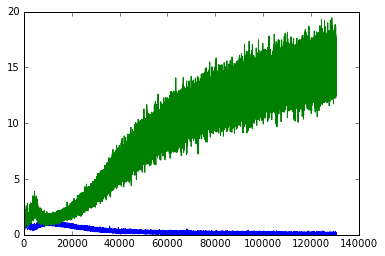

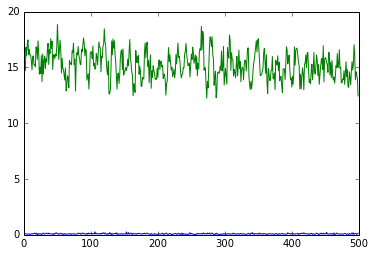

(128, 28, 28, 1)


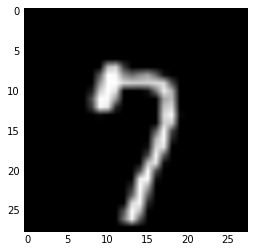

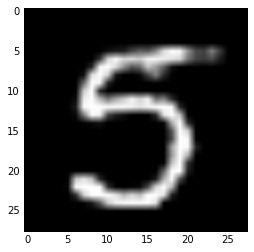

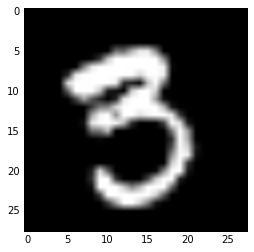

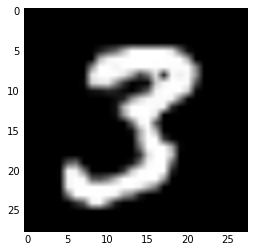

Iter: 122000
D loss: 0.07045
G_loss: 14.07
()


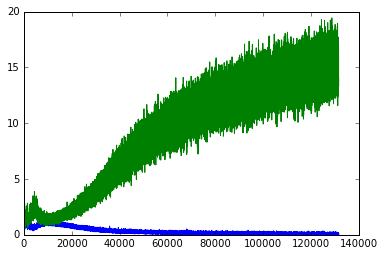

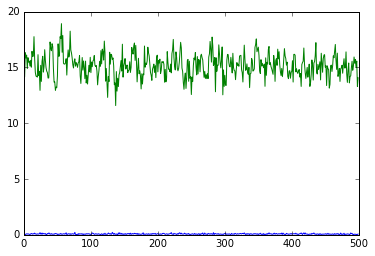

(128, 28, 28, 1)


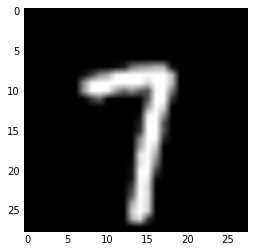

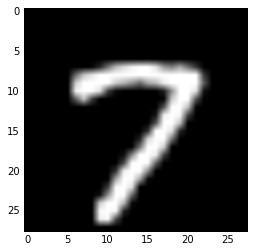

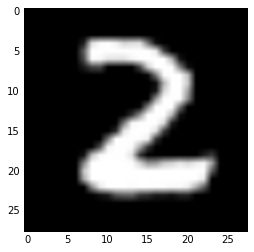

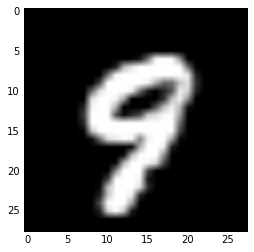

Iter: 123000
D loss: 0.03054
G_loss: 14.54
()


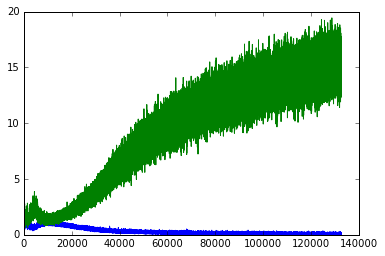

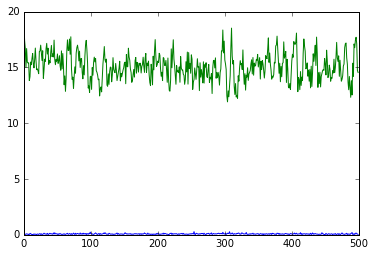

(128, 28, 28, 1)


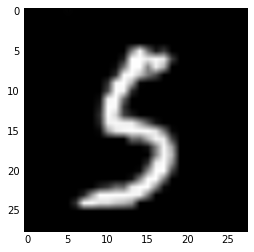

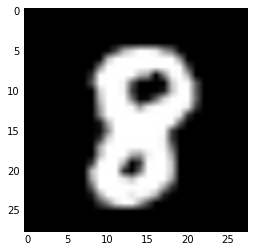

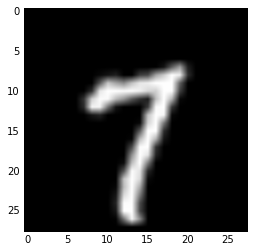

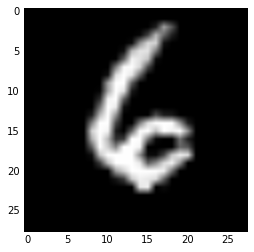

Iter: 124000
D loss: 0.01877
G_loss: 16.2
()


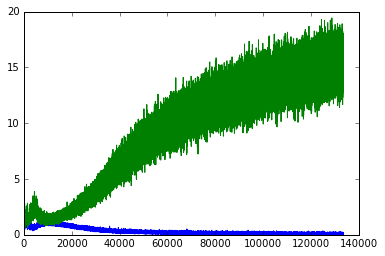

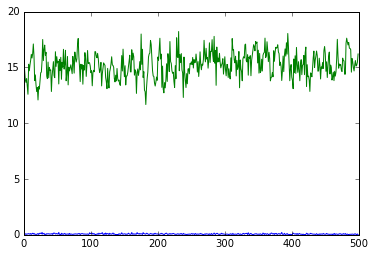

(128, 28, 28, 1)


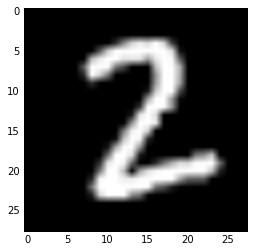

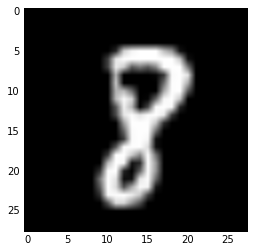

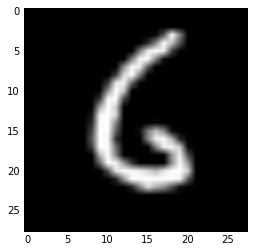

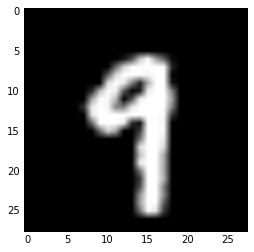

Iter: 125000
D loss: 0.1005
G_loss: 14.57
()


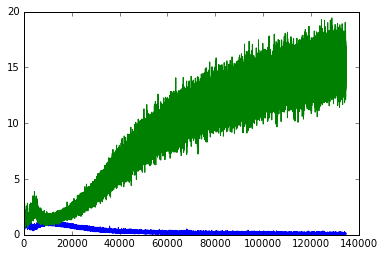

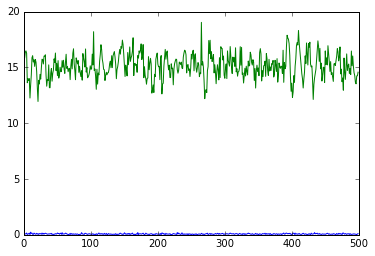

(128, 28, 28, 1)


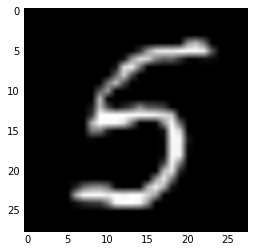

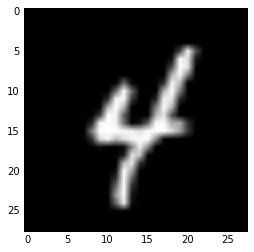

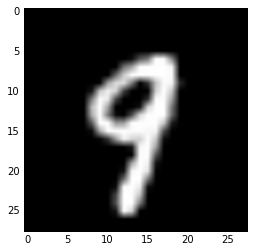

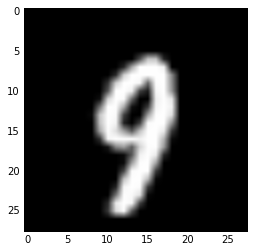

Iter: 126000
D loss: 0.1076
G_loss: 16.29
()


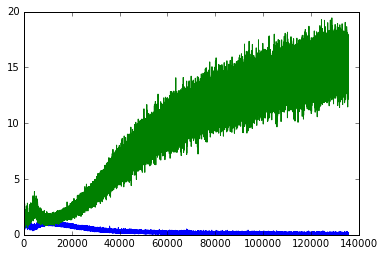

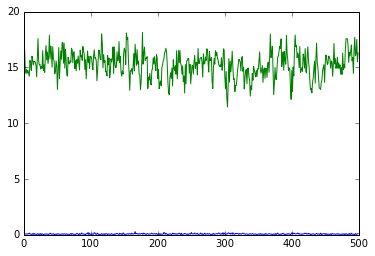

(128, 28, 28, 1)


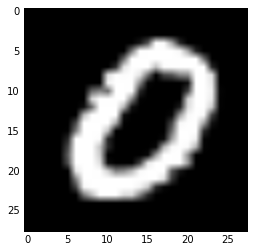

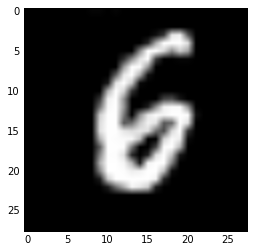

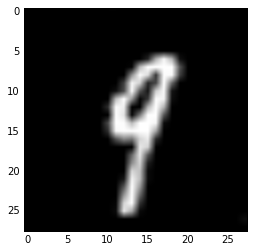

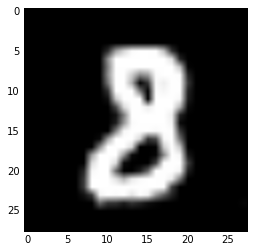

Iter: 127000
D loss: 0.05319
G_loss: 15.08
()


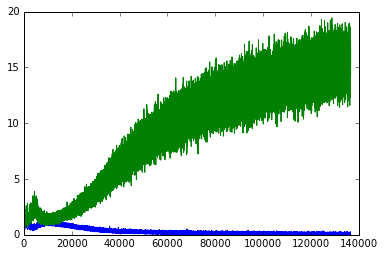

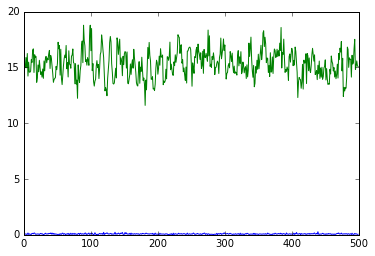

(128, 28, 28, 1)


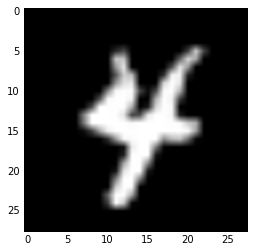

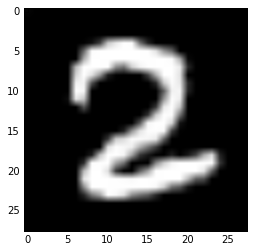

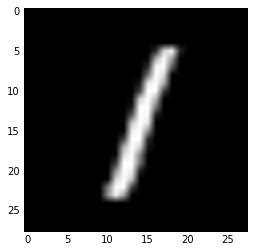

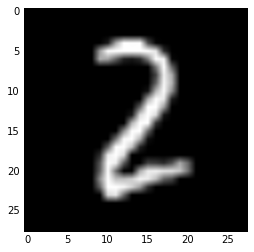

Iter: 128000
D loss: 0.06376
G_loss: 14.4
()


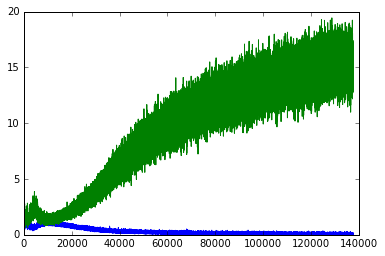

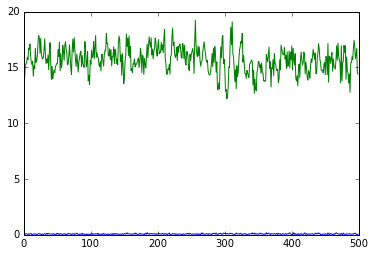

(128, 28, 28, 1)


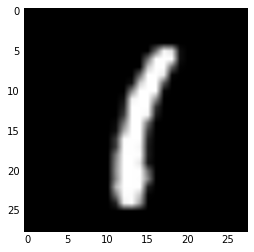

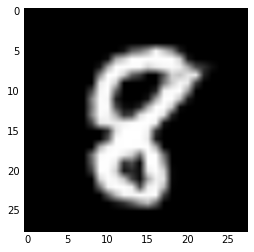

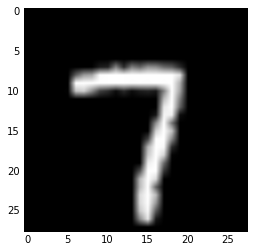

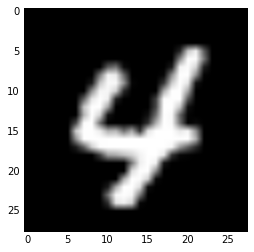

Iter: 129000
D loss: 0.05424
G_loss: 14.43
()


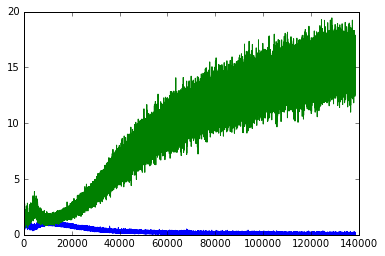

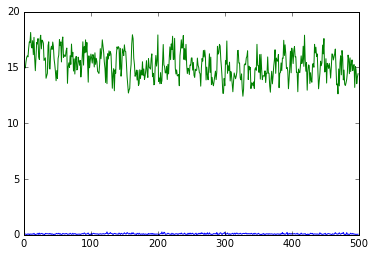

(128, 28, 28, 1)


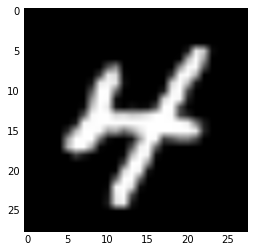

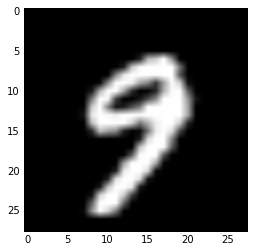

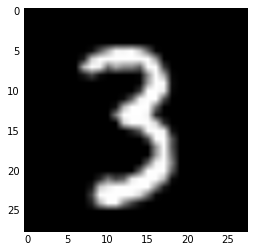

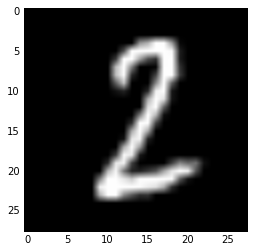

Iter: 130000
D loss: 0.03299
G_loss: 14.5
()


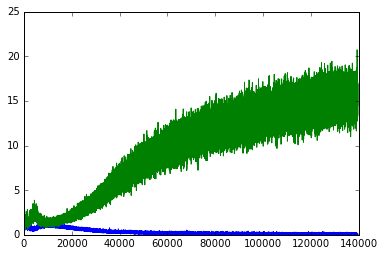

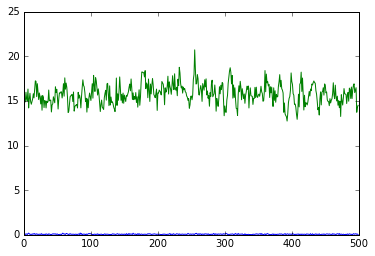

(128, 28, 28, 1)


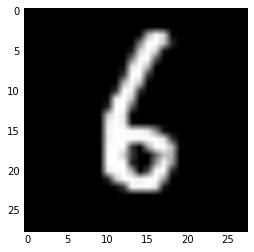

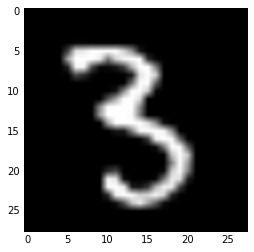

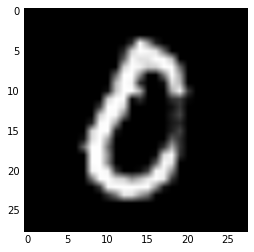

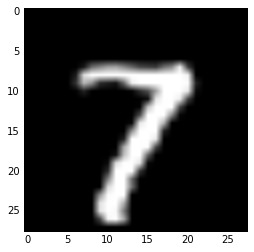

Iter: 131000
D loss: 0.04243
G_loss: 16.69
()


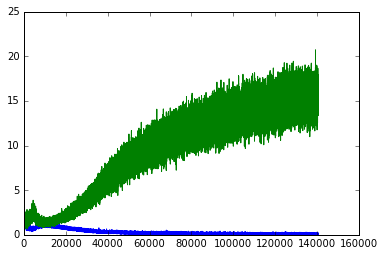

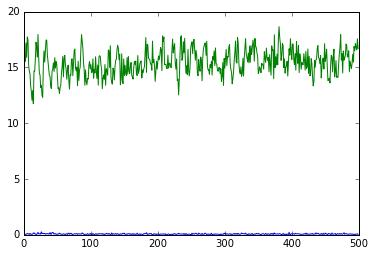

(128, 28, 28, 1)


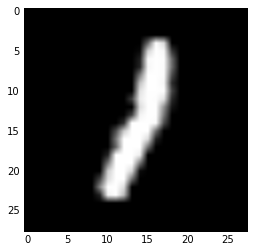

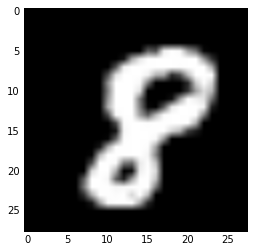

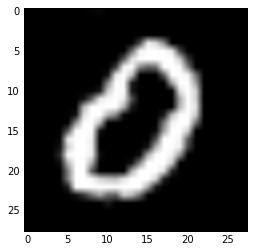

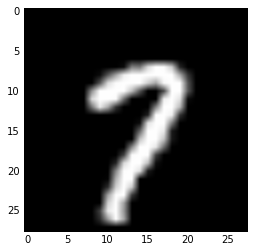

Iter: 132000
D loss: 0.1049
G_loss: 15.31
()


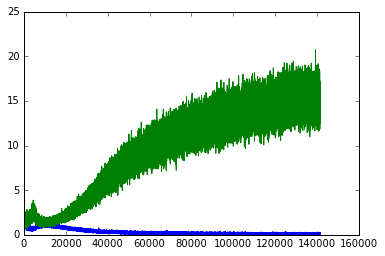

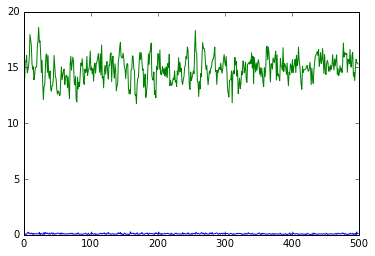

(128, 28, 28, 1)


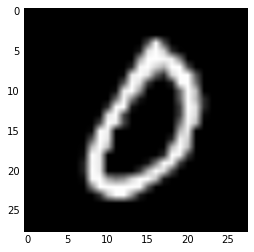

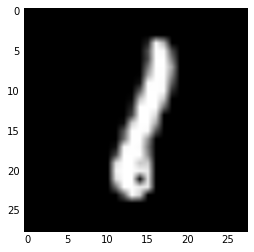

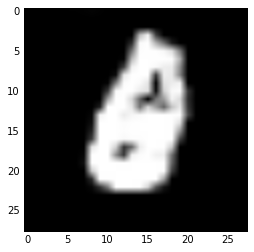

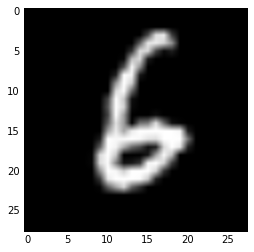

Iter: 133000
D loss: 0.1458
G_loss: 14.06
()


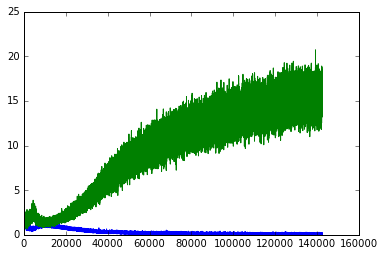

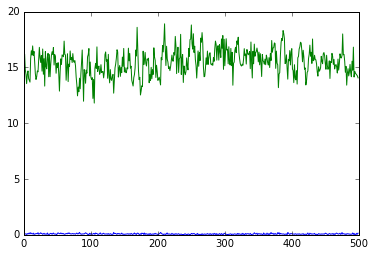

(128, 28, 28, 1)


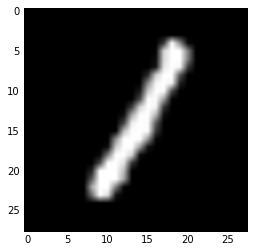

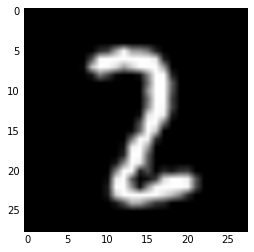

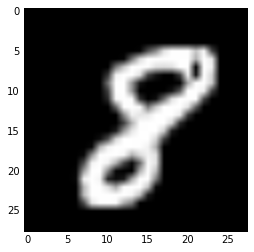

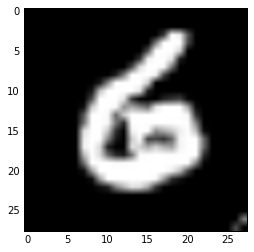

Iter: 134000
D loss: 0.02129
G_loss: 15.43
()


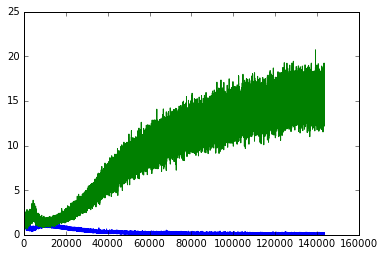

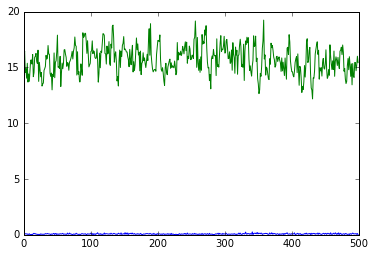

(128, 28, 28, 1)


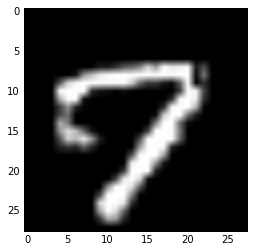

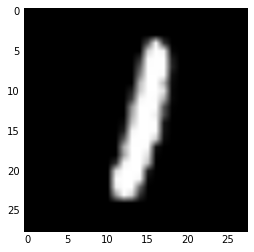

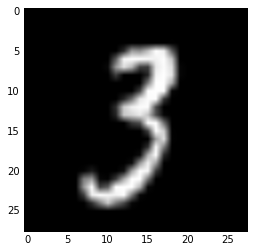

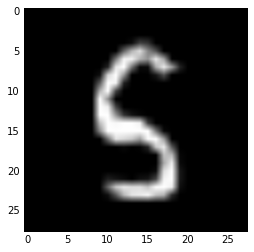

Iter: 135000
D loss: 0.04764
G_loss: 17.3
()


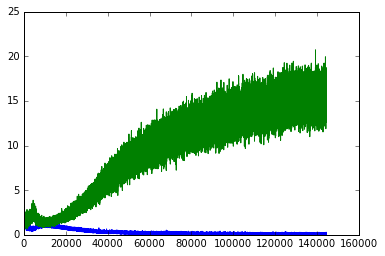

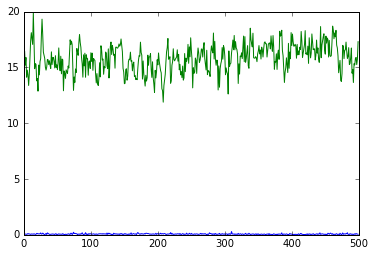

(128, 28, 28, 1)


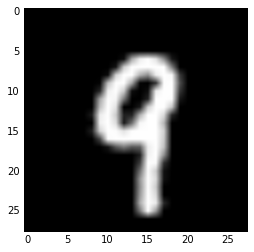

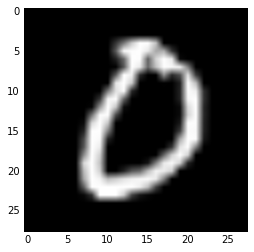

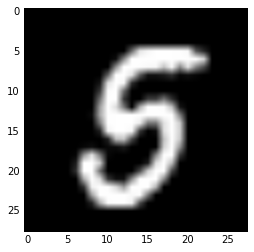

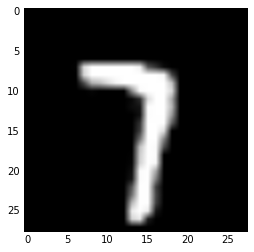

Iter: 136000
D loss: 0.06391
G_loss: 16.71
()


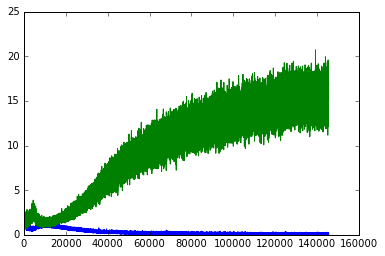

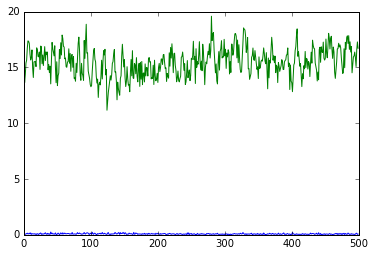

(128, 28, 28, 1)


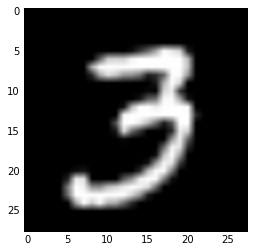

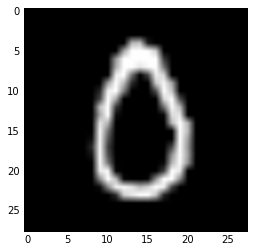

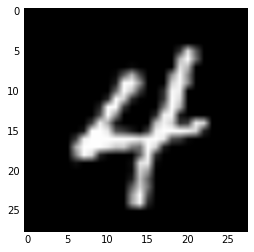

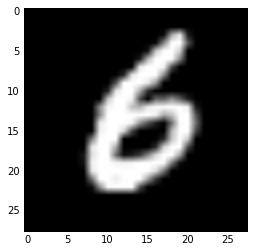

KeyboardInterrupt: 

In [16]:

mb_size = 128

for it in range(1000000):


    X_mb, Y_mb = mnist.train.next_batch(mb_size)

    _, D_loss_curr = sess.run([D_solver, D_loss], feed_dict={X: X_mb, Z: sample_Z(mb_size, Z_dim), Y: Y_mb})
    _, G_loss_curr = sess.run([G_solver, G_loss], feed_dict={Z: sample_Z(mb_size, Z_dim), Y: Y_mb})

    D_loss_record.append(D_loss_curr)
    G_loss_record.append(G_loss_curr)

    if it % 1000 == 0:
        print('Iter: {}'.format(it))
        print('D loss: {:.4}'. format(D_loss_curr))
        print('G_loss: {:.4}'.format(G_loss_curr))
        print()
        plt.plot(D_loss_record[1000:])
        plt.plot(G_loss_record[1000:])
        plt.show()
        
        plt.plot(D_loss_record[-500:])
        plt.plot(G_loss_record[-500:])
        plt.show()
        images_val = sess.run(G_sample, feed_dict={Z: sample_Z(mb_size, Z_dim), Y: Y_mb})
        print images_val.shape
        for i in range(4):
            plt.imshow(np.reshape(images_val[i],[28,28]), cmap='gray')
            plt.show()
        

(128, 28, 28, 1)


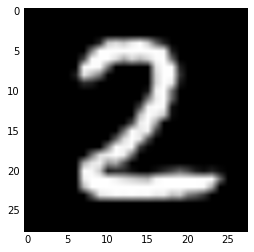

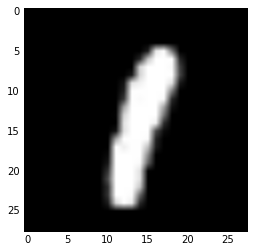

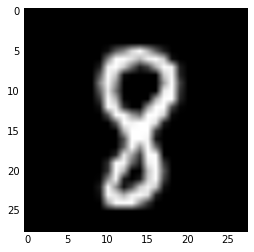

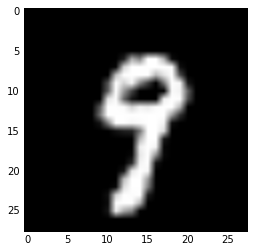

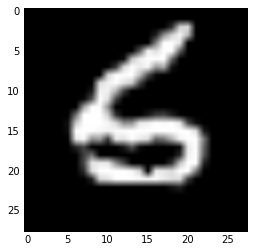

...

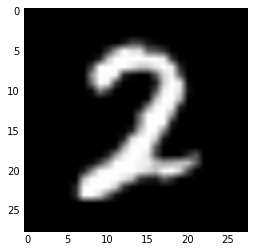

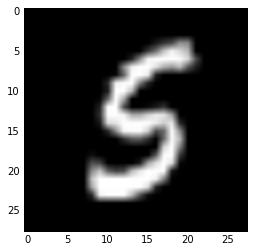

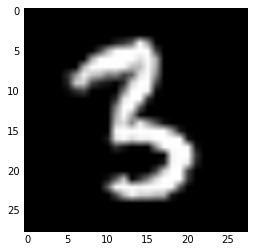

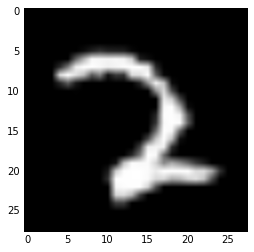

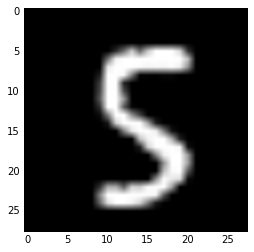

In [17]:
images_val = sess.run(G_sample, feed_dict={Z: sample_Z(mb_size, Z_dim), Y: Y_mb})
print images_val.shape
for i in range(40):
    plt.imshow(np.reshape(images_val[i],[28,28]), cmap='gray')
    plt.show()

(28, 28, 1)


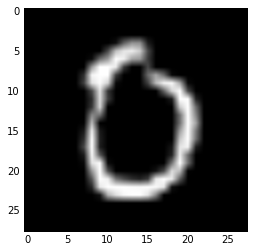

(28, 28, 1)


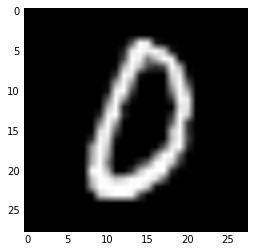

(28, 28, 1)


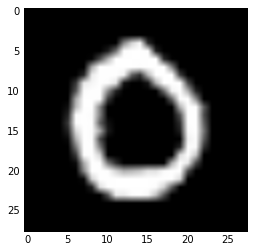

(28, 28, 1)


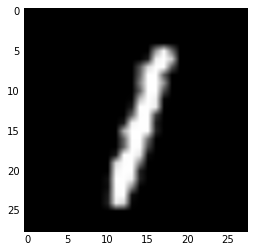

(28, 28, 1)


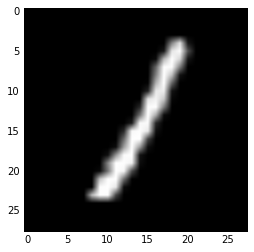

(28, 28, 1)


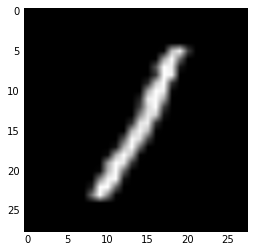

(28, 28, 1)


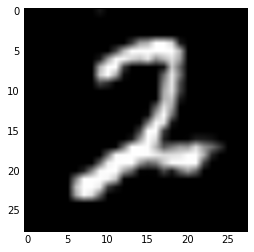

(28, 28, 1)


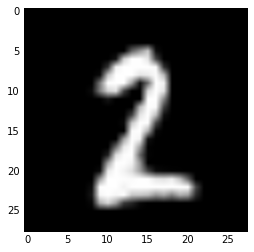

(28, 28, 1)


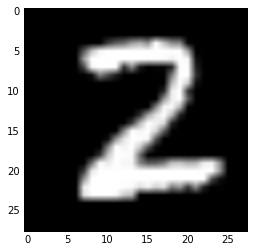

(28, 28, 1)


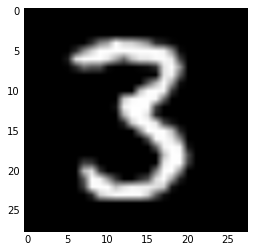

(28, 28, 1)


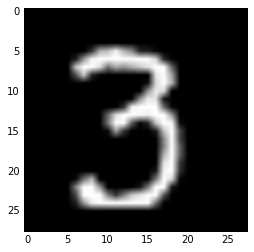

(28, 28, 1)


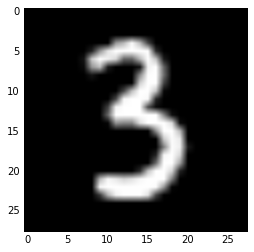

(28, 28, 1)


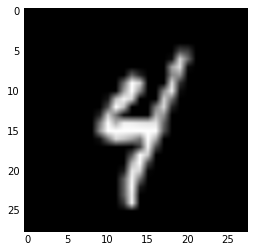

(28, 28, 1)


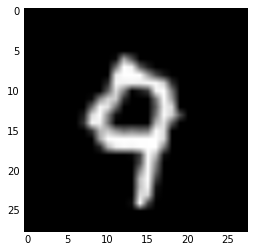

(28, 28, 1)


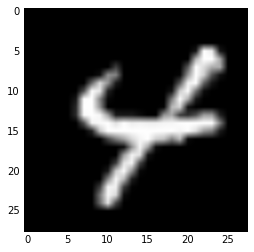

(28, 28, 1)


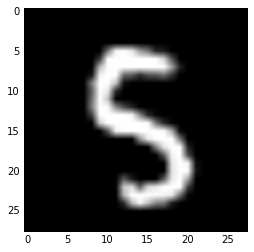

(28, 28, 1)


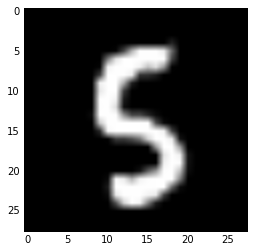

(28, 28, 1)


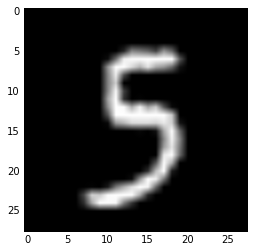

(28, 28, 1)


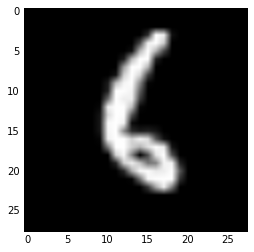

(28, 28, 1)


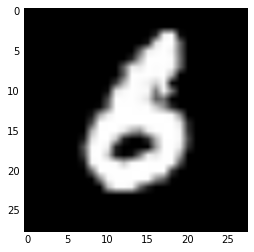

(28, 28, 1)


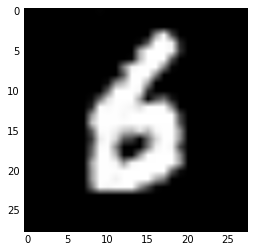

(28, 28, 1)


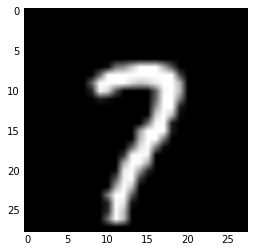

(28, 28, 1)


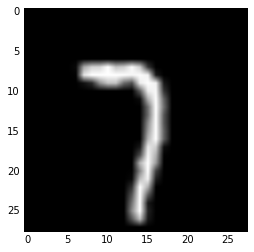

(28, 28, 1)


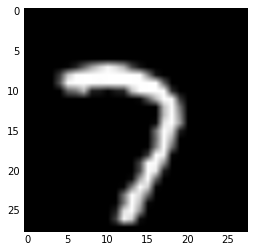

(28, 28, 1)


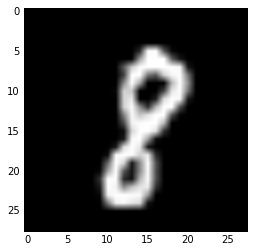

(28, 28, 1)


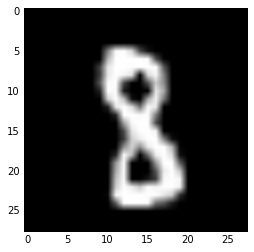

(28, 28, 1)


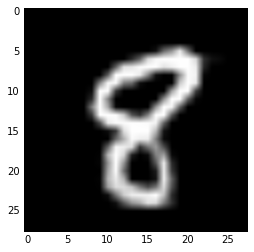

(28, 28, 1)


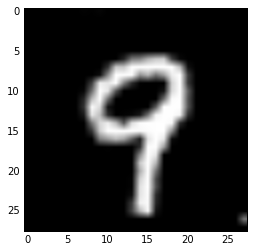

(28, 28, 1)


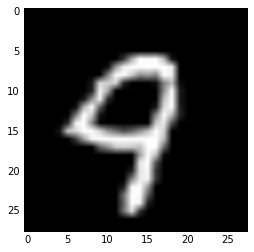

(28, 28, 1)


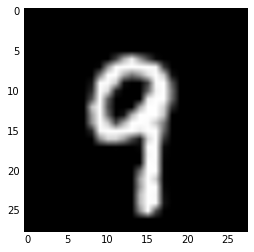

In [21]:
for i in range(10):
        X_mb, Y_mb = mnist.train.next_batch(mb_size)
        Y_mb = np.zeros_like(Y_mb)
        Y_mb[:,i]=1
        for _ in range(3):
            images_val = sess.run(G_sample, feed_dict={Z: sample_Z(mb_size, Z_dim), Y: Y_mb})[0]
            print images_val.shape
            plt.imshow(np.reshape(images_val,[28,28]), cmap='gray')
            plt.show()
#             images_val